In [1]:
import tensorflow as tf

import numpy as np
from tensorflow.keras import layers
import tensorflow.keras.backend as K

from tensorflow.keras import datasets, layers, models

import matplotlib.pyplot as plt
import tensorflow_addons as tfa

2024-04-17 13:52:14.690235: I tensorflow/core/platform/cpu_feature_guard.cc:183] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE3 SSE4.1 SSE4.2 AVX, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.9.0 and strictly below 2.12.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.12.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https:/

In [2]:
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [9]:
NUM_EPOCH = 50

# training SNR


channel_snr = 15
rate = 1 # code rate 
channel_type = 'fading'

# ##### KSG MI estimator #######################
# settings = {'kraskov_k': 3}
# gpu_est = est.OpenCLKraskovMI(settings = settings)
# usage: MI = estimator.estimate(var1, var2)

##### setting for communication channel ######

def getnoisevariance(SNR,rate,P=1):
    # the SNR in args[0] is actually EbN0
    snrdB = SNR + 10*np.log10(rate)
    snr = 10.0**(snrdB/10.0)
    #P_avg = 1
    N0 = P/snr
    return (N0/2)

noise_var = getnoisevariance(channel_snr,rate,P=1)
sd = np.sqrt(noise_var)

##############################################


### DATA Preprocessing

In [10]:
(x_train_val, y_train_val), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

# x_train_val = x_train_val.reshape(x_train.shape[0], -1)
# x_test = x_test.reshape(x_test.shape[0], -1)

# Change the data type to a floating point format
x_train_val = x_train_val.astype("float32")/255.0
x_test = x_test.astype("float32")/255.0

Y_train_val = tf.keras.utils.to_categorical(y_train_val, 10)
Y_test = tf.keras.utils.to_categorical(y_test, 10)

#del y_train_val,y_test

In [28]:

label_permutation = np.arange(10)
#label_permutation = np.random.permutation(10)
LABEL_FIRST_HALF = label_permutation[:10]
label2_list = np.zeros((6,5))
for i in range(6):
    label2_list[i][:] = label_permutation[i:i+5]
    
print(label2_list)

train_filter = np.where(np.in1d(y_train_val, LABEL_FIRST_HALF))
test_filter =  np.where(np.in1d(y_test, LABEL_FIRST_HALF))

[[0. 1. 2. 3. 4.]
 [1. 2. 3. 4. 5.]
 [2. 3. 4. 5. 6.]
 [3. 4. 5. 6. 7.]
 [4. 5. 6. 7. 8.]
 [5. 6. 7. 8. 9.]]


In [12]:
x_train_1 = x_train_val[train_filter]
Y_train_1 = Y_train_val[train_filter]
x_test_1 = x_test[test_filter]
Y_test_1 = Y_test[test_filter]

In [13]:
train_val_ratio = 0.8
train_num = int(x_train_1.shape[0]*train_val_ratio)
print(train_num)

# x_train, x_val = x_train_val[:train_num], x_train_val[train_num:]
# Y_train, Y_val = Y_train_val[:train_num], Y_train_val[train_num:]
# del x_train_val, y_train_val

20000


### Model Structure

In [14]:
# ### normalized Input before 
# class GaussianNoiseLayer(layers.Layer):
#     def __init__(self, stddev, **kwargs):
#         super(GaussianNoiseLayer, self).__init__(**kwargs)
#         self.stddev = stddev
    
#     def call(self, inputs, training=None):
#         if training:
#             noise = tf.random.normal(shape=tf.shape(inputs), mean=0.0, stddev=self.stddev)
#             return inputs + noise
#         else:
#             noise = tf.random.normal(shape=tf.shape(inputs), mean=0.0, stddev=self.stddev)
#             return inputs + noise
    
#     def get_config(self):
#         config = super(GaussianNoiseLayer, self).get_config()
#         config.update({'noise_var': self.stddev})
#         return config

In [15]:
## fading channel

def fading(x, stddev, h=None):
    """Implements the fading channel with multiplicative fading and
    additive white gaussian noise.
    Args:
        x: channel input symbols
        stddev: standard deviation of noise
    Returns:
        y: noisy channel output symbols
    """
    # channel gain
    if h is None:
        h = tf.complex(
            tf.random.normal([tf.shape(x)[0], 1], 0, 1 / np.sqrt(2)),
            tf.random.normal([tf.shape(x)[0], 1], 0, 1 / np.sqrt(2)),
        )

    # additive white gaussian noise
    awgn = tf.complex(
        tf.random.normal(tf.shape(x), 0, 1 / np.sqrt(2)),
        tf.random.normal(tf.shape(x), 0, 1 / np.sqrt(2)),
    )

    return (h * x + stddev * awgn), h

class Channel(layers.Layer):

#cite D-JSCC

    def __init__(self, channel_type, channel_snr, name="channel", **kwargs):
        super(Channel, self).__init__(name=name, **kwargs)
        self.channel_type = channel_type
        self.channel_snr = channel_snr

    def call(self, inputs):
        (encoded_img, prev_h) = inputs
        inter_shape = tf.shape(encoded_img)
        # reshape array to [-1, dim_z]
        z = layers.Flatten()(encoded_img)
        # convert from snr to std
        # print("channel_snr: {}".format(self.channel_snr))
        noise_stddev = np.sqrt(10 ** (-self.channel_snr / 10))

        # Add channel noise
        if self.channel_type == "awgn":
            dim_z = tf.shape(z)[1]
            # normalize latent vector so that the average power is 1
            z_in = tf.sqrt(tf.cast(dim_z, dtype=tf.float32)) * tf.nn.l2_normalize(
                z, axis=1
            )
            z_out = real_awgn(z_in, noise_stddev)
            h = tf.ones_like(z_in)  # h just makes sense on fading channels

        elif self.channel_type == "fading":
            dim_z = tf.shape(z)[1] // 2
            # convert z to complex representation
            z_in = tf.complex(z[:, :dim_z], z[:, dim_z:])
            # normalize the latent vector so that the average power is 1
            z_norm = tf.reduce_sum(
                tf.math.real(z_in * tf.math.conj(z_in)), axis=1, keepdims=True
            )
            z_in = z_in * tf.complex(
                tf.sqrt(tf.cast(dim_z, dtype=tf.float32) / z_norm), 0.0
            )
            z_out, h = fading(z_in, noise_stddev, prev_h)
            # convert back to real
            z_out = tf.concat([tf.math.real(z_out), tf.math.imag(z_out)], 1)

        # convert signal back to intermediate shape
        z_out = tf.reshape(z_out, inter_shape)

        return z_out, h


In [16]:
class CustomMetricCallback(tf.keras.callbacks.Callback):
    def __init__(self, display_frequency=10):
        super(CustomMetricCallback, self).__init__()
        self.display_frequency = display_frequency

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.display_frequency == 0:
            metrics_str = " - ".join([f"{metric_name}: {value:.4f}" for metric_name, value in logs.items()])
            print(f"Epoch {epoch}/{self.params['epochs']} - {metrics_str}")

            
callback = CustomMetricCallback(display_frequency=50)

In [23]:

def do_report(epoch):
#     if epoch < 20:       # Log for all first 20 epochs
#         return True
    if epoch < 100:    # Then for every 5th epoch
        return (epoch % 5 == 0)
    elif epoch < 200:    # Then every 10th
        return (epoch % 10 == 0)
    else:                # Then every 100th
        return (epoch % 100 == 0)
    
    
def train_first_stage(lambda_val,SNR):
    prev_chn_gain = None

    tf.keras.backend.clear_session()
    tf.random.set_seed(42)

        ############ Model Structure ###############################

    input_layer  = layers.Input(shape=(32, 32, 3))
    unlabeled_input = layers.Input(shape=(32, 32, 3))
    encoder_1 = layers.Conv2D(96, (3, 3), activation='relu', padding='same')(input_layer)
    maxpool_1 = layers.MaxPooling2D((2, 2))(encoder_1)
    encoder_2 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(maxpool_1)
    maxpool_2 = layers.MaxPooling2D((2, 2))(encoder_2)
    
    fadingchannel = Channel(channel_type, channel_snr, name="channel_output")
    noise_layer, chn_gain = fadingchannel((encoder_2, prev_chn_gain))

    CE_cnn_1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same', strides=2)(noise_layer)
    flatten_1 = layers.Flatten()(CE_cnn_1)
    flatten_1 = layers.BatchNormalization()(flatten_1)
    CE_dense_2 = layers.Dense(256, activation='relu')(flatten_1)
    CE_output = tf.keras.layers.Dense(10,activation = 'softmax',name='CE')(CE_dense_2)

    mse_1 = layers.Conv2DTranspose(64, kernel_size=3, activation='relu', padding='same')(noise_layer)
    upsample1 = layers.UpSampling2D((2,2))(mse_1)
    mse_2 = layers.Conv2DTranspose(64, kernel_size=3, activation='relu', padding='same')(upsample1)
    upsample2 = layers.UpSampling2D((2,2))(mse_2)
    mse_output = layers.Conv2D(3, kernel_size=(3, 3), activation='sigmoid', padding='same',name='mse')(mse_2)


    model = tf.keras.Model(inputs = input_layer, outputs = [CE_output,mse_output])
    
    lr_schedule_1 = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.03,
    decay_steps=9500,
    decay_rate=0.9)
    lr_schedule_2 = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.06,
    decay_steps=9500,
    decay_rate=0.9)
    
    opt1 = tf.keras.optimizers.SGD(learning_rate=lr_schedule_1)
    opt2 = tf.keras.optimizers.SGD(learning_rate=lr_schedule_2)


    optimizers_and_layers = [(opt1, model.layers[0:4]), (opt2, model.layers[4:])]
    optimizer = tfa.optimizers.MultiOptimizer(optimizers_and_layers)
    
    
    model.compile(optimizer=optimizer,
                  loss = {'CE' : 'categorical_crossentropy', 
                          'mse' : 'mse'},
                  metrics = {'CE' : 'accuracy', 
                             'mse': tf.keras.metrics.RootMeanSquaredError()},
                  loss_weights=[1, lambda_val])
    

    history = model.fit(x=x_train_1, y=(Y_train_1,x_train_1),
                        batch_size=128,
                        epochs=250,
                        verbose=0,
                        validation_data=(x_test_1, (Y_test_1,x_test_1)))
                       #callbacks = [callback])
                        #callbacks=[reporter,])
            
#     plt.plot(history.history['CE_loss'])
#     plt.plot(history.history['val_CE_loss'])
#     plt.title('cross-entropy loss')
#     plt.ylabel('loss')
#     plt.xlabel('epoch')
#     plt.legend(['train', 'validation'], loc='upper left')
#     plt.show()
    
#     plt.plot(history.history['mse_loss'])
#     plt.plot(history.history['val_mse_loss'])
#     plt.title('mse loss')
#     plt.ylabel('loss')
#     plt.xlabel('epoch')
#     plt.legend(['train', 'validation'], loc='upper left')
#     plt.show()
    
#     plt.plot(history.history['CE_accuracy'])
#     plt.plot(history.history['val_CE_accuracy'])
#     plt.title('acc')
#     plt.ylabel('loss')
#     plt.xlabel('epoch')
#     plt.legend(['train', 'validation'], loc='upper left')
#     plt.show()
    
    
    print("ce_acc: ",history.history['val_CE_accuracy'][-1])
    print("mse_loss: ", history.history['mse_loss'][-1])
            

    ################### secpmd stage #################
    #print("stage 2!")
   
    train_filter = np.where(np.in1d(y_train_val, LABEL_SECOND_HALF))
    test_filter =  np.where(np.in1d(y_test, LABEL_SECOND_HALF))

    x_trainval_2 = x_train_val[train_filter]
    x_test_2 = x_test[test_filter]
    Y_trainval_2 = Y_train_val[train_filter]
    Y_test_2 = Y_test[test_filter]

    x_train_2, x_val_2 = x_trainval_2[:train_num], x_trainval_2[train_num:]
    Y_train_2, Y_val_2 = Y_trainval_2[:train_num], Y_trainval_2[train_num:]
    
    
    fadingchannel = Channel(channel_type, SNR, name="second_channel")
    noise_layer2, chn_gain = fadingchannel((encoder_2, prev_chn_gain))
    
    CE_cnn_2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same', strides=2)(noise_layer2)
#     CE_cnn_2 = layers.AveragePooling2D(pool_size=(2, 2))(CE_cnn_2)
#     CE_cnn_2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same', strides=2)(CE_cnn_2)
    
    flatten_2 = layers.Flatten()(CE_cnn_2)
    flatten_2 = layers.BatchNormalization()(flatten_2)
    CE_dense_3 = layers.Dense(256, activation='relu')(flatten_2)
    CE_output1 = tf.keras.layers.Dense(10,activation = 'softmax',name='CE')(CE_dense_3)
    
    
    reconstructed_model = tf.keras.models.Model(inputs = input_layer, outputs = [CE_output1,mse_output])

    reconstructed_model.layers[1].trainable = False
    reconstructed_model.layers[2].trainable = False

    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=4e-2,
    decay_steps=10000,
    decay_rate=0.9)
    opt = tf.keras.optimizers.SGD(learning_rate=lr_schedule)
    #opt = tf.keras.optimizers.Adam(learning_rate=0.002)


    reconstructed_model.compile(optimizer=opt, 
                loss = {'CE' : 'categorical_crossentropy', 
                          'mse' : 'mse'
                         },              loss_weights=[1, 0],
                  metrics = {'CE' : 'accuracy', 
                             'mse': tf.keras.metrics.RootMeanSquaredError()
                           }
                 )

    #     reporter_2 = getMIOutput(trn=x_retrain, 
    #                                tst=Y_retrain, 
    #                                snr=SNR,
        #                               do_save_func=do_report)
        
    history1 = reconstructed_model.fit(x=x_train_2, y=(Y_train_2,x_train_2),
                        batch_size=128,
                        epochs=50,
                        verbose=0,
                        validation_data=(x_val_2,(Y_val_2,x_val_2)))
    
    results = reconstructed_model.evaluate(x_test_2,(Y_test_2,x_test_2))
    
#     [results_list[key_list[i]].append(results[i]) for i in range(len(key_list))]
        
    print(results[3])
    return results[3]
        
#     return results_list

    

In [30]:
'''
channel_snr; the original SNR
SNR; phase 2 SNR

'''
SNR_list = [-10,-5,0,5,10,15]
lambda_list = [0,1,2,5,10]

acc_list = []

LABEL_SECOND_HALF =  LABEL_FIRST_HALF

for snr_phase2 in SNR_list:
    print("Phase 2 SNR: ", snr_phase2)
    
    for lambda_val in lambda_list:
        print("lambda: ", lambda_val)
        acc = train_first_stage(lambda_val,snr_phase2)
        acc_list.append(acc)

Phase 2 SNR:  -10
lambda:  0
ce_acc:  0.7847999930381775
mse_loss:  0.06951678544282913
313/313 [==============================] - 1s 4ms/step - loss: 1.3485 - CE_loss: 1.3485 - mse_loss: 0.0694 - CE_accuracy: 0.5165 - mse_root_mean_squared_error: 0.2634
0.5164999961853027
lambda:  1
ce_acc:  0.7760000228881836
mse_loss:  0.033090990036726
313/313 [==============================] - 1s 3ms/step - loss: 1.3363 - CE_loss: 1.3363 - mse_loss: 0.0616 - CE_accuracy: 0.5279 - mse_root_mean_squared_error: 0.2483
0.527899980545044
lambda:  2
ce_acc:  0.7742000222206116
mse_loss:  0.02929523214697838
313/313 [==============================] - 1s 3ms/step - loss: 1.4731 - CE_loss: 1.4731 - mse_loss: 0.0545 - CE_accuracy: 0.4791 - mse_root_mean_squared_error: 0.2334
0.47909998893737793
lambda:  5
ce_acc:  0.7778000235557556
mse_loss:  0.02518104761838913
313/313 [==============================] - 1s 3ms/step - loss: 1.4155 - CE_loss: 1.4155 - mse_loss: 0.0518 - CE_accuracy: 0.4995 - mse_root_mean_s

In [27]:
'''
channel_snr; the original SNR
SNR; phase 2 SNR

'''
SNR_list = [-10,-5,0,5,10,15]
lambda_list = [0,1,2,5,10]

acc_list = []

LABEL_SECOND_HALF =  label2_list[5]

for snr_phase2 in SNR_list:
    print("Phase 2 SNR: ", snr_phase2)
    
    for lambda_val in lambda_list:
        print("lambda: ", lambda_val)
        acc = train_first_stage(lambda_val,snr_phase2)
        acc_list.append(acc)

Phase 2 SNR:  -10
lambda:  0
ce_acc:  0.8019999861717224
mse_loss:  0.06795153021812439
157/157 [==============================] - 0s 3ms/step - loss: 0.7268 - CE_loss: 0.7268 - mse_loss: 0.0710 - CE_accuracy: 0.7310 - mse_root_mean_squared_error: 0.2664
0.7310000061988831
lambda:  1
ce_acc:  0.7861999869346619
mse_loss:  0.03281046450138092
157/157 [==============================] - 1s 3ms/step - loss: 0.7845 - CE_loss: 0.7845 - mse_loss: 0.0620 - CE_accuracy: 0.7196 - mse_root_mean_squared_error: 0.2490
0.7196000218391418
lambda:  2
ce_acc:  0.7875999808311462
mse_loss:  0.029551105573773384
157/157 [==============================] - 0s 3ms/step - loss: 0.6981 - CE_loss: 0.6981 - mse_loss: 0.0563 - CE_accuracy: 0.7394 - mse_root_mean_squared_error: 0.2373
0.7394000291824341
lambda:  5
ce_acc:  0.7824000120162964
mse_loss:  0.024998463690280914
157/157 [==============================] - 1s 3ms/step - loss: 0.8117 - CE_loss: 0.8117 - mse_loss: 0.0573 - CE_accuracy: 0.7158 - mse_root_me

KeyboardInterrupt: 

In [24]:
'''
channel_snr; the original SNR
SNR; phase 2 SNR

'''
SNR_list = [-10,-5,0,5,10,15]
lambda_list = [0,1,2,5,10]

acc_list = []

LABEL_SECOND_HALF =  label2_list[0]

for snr_phase2 in SNR_list:
    print("Phase 2 SNR: ", snr_phase2)
    
    for lambda_val in lambda_list:
        print("lambda: ", lambda_val)
        acc = train_first_stage(lambda_val,snr_phase2)
        acc_list.append(acc)

Phase 2 SNR:  -10
lambda:  0
ce_acc:  0.7847999930381775
mse_loss:  0.07822490483522415
157/157 [==============================] - 0s 3ms/step - loss: 0.9618 - CE_loss: 0.9618 - mse_loss: 0.0775 - CE_accuracy: 0.6272 - mse_root_mean_squared_error: 0.2784
0.6272000074386597
lambda:  1
ce_acc:  0.7591999769210815
mse_loss:  0.03292049840092659
157/157 [==============================] - 1s 3ms/step - loss: 0.9027 - CE_loss: 0.9027 - mse_loss: 0.0580 - CE_accuracy: 0.6500 - mse_root_mean_squared_error: 0.2409
0.6499999761581421
lambda:  2
ce_acc:  0.7233999967575073
mse_loss:  0.029453299939632416
157/157 [==============================] - 0s 3ms/step - loss: 0.9601 - CE_loss: 0.9601 - mse_loss: 0.0554 - CE_accuracy: 0.6244 - mse_root_mean_squared_error: 0.2353
0.6244000196456909
lambda:  5
ce_acc:  0.7771999835968018
mse_loss:  0.025113793089985847
157/157 [==============================] - 0s 3ms/step - loss: 0.9258 - CE_loss: 0.9258 - mse_loss: 0.0509 - CE_accuracy: 0.6354 - mse_root_me

In [36]:
key_list = ['loss', 'CE_loss', 'mse_loss', 'CE_accuracy', 'mse']

lambda_list = [0,1,2,5,10]


results_list = {key: [] for key in key_list}
for i in range(6):

    print("current overlap is: ", (i) )
    acc_list = [] 
    LABEL_SECOND_HALF = label2_list[5-i]
    for lambda_val in lambda_list:
        print("lambda: ", lambda_val)
        train_first_stage(lambda_val,results_list,LABEL_SECOND_HALF)
    print(np.array(results_list['CE_accuracy']).reshape(-1,5))


array([5., 6., 7., 8., 9.])

current overlap is:  0
lambda:  1
learning rate:  0.0015


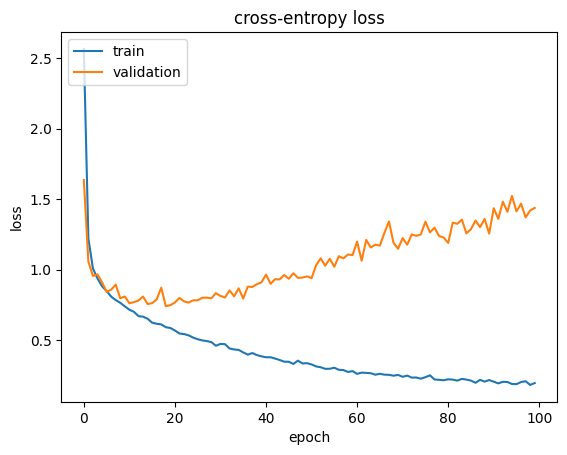

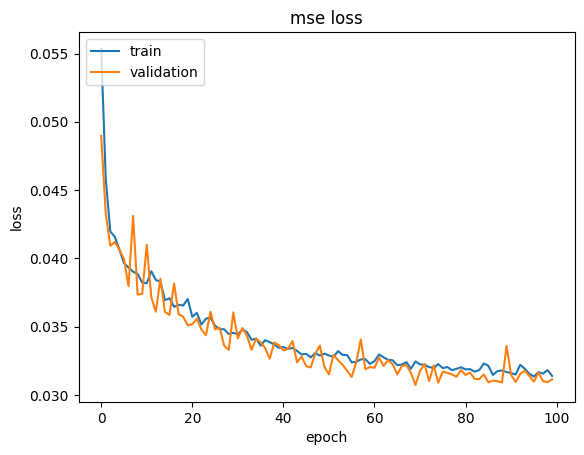

157/157 [==============================] - 0s 3ms/step - loss: 1.5314 - CE_loss: 1.5314 - mse_loss: 0.0353 - CE_accuracy: 0.7966 - mse_root_mean_squared_error: 0.1880
0.7975999712944031
lambda:  1
learning rate:  0.001


KeyboardInterrupt: 

In [49]:
## only for learning rate finding - adam
key_list = ['loss', 'CE_loss', 'mse_loss', 'CE_accuracy', 'mse']

lambda_list = [1,2,5,10]


results_list = {key: [] for key in key_list}
print("current overlap is: ", (i) )
LABEL_SECOND_HALF = label2_list[5]
for learning_rate in learning_rate_test:
    print("lambda: ", 1)
    print("learning rate: ", learning_rate)
    results_list = train_first_stage(1,LABEL_SECOND_HALF,learning_rate)
print(np.array(results_list['CE_accuracy']).reshape(-1,5))


In [89]:
## only for learning rate finding - adam
key_list = ['loss', 'CE_loss', 'mse_loss', 'CE_accuracy', 'mse']

lambda_list = [1,2,5,10]

learning_rate_test = [1e-2,8e-3,6e-3,5e-3,4e-3,3e-3,2e-3]

results_list = {key: [] for key in key_list}
print("current overlap is: ", (i) )
LABEL_SECOND_HALF = label2_list[5]
for learning_rate in learning_rate_test:
    print("lambda: ", 1)
    print("learning rate: ", learning_rate)
    results_list = train_first_stage(1,LABEL_SECOND_HALF,learning_rate)
print(np.array(results_list['CE_accuracy']).reshape(-1,5))


current overlap is:  0
lambda:  1
learning rate:  0.01


TypeError: train_first_stage() missing 1 required positional argument: 'lr'

current overlap is:  0
lambda:  1
learning rate:  0.05


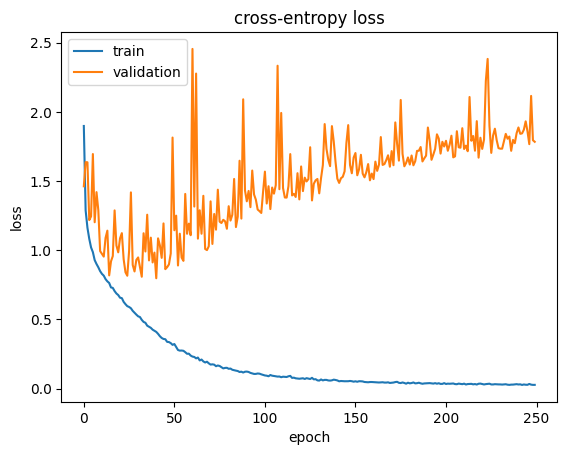

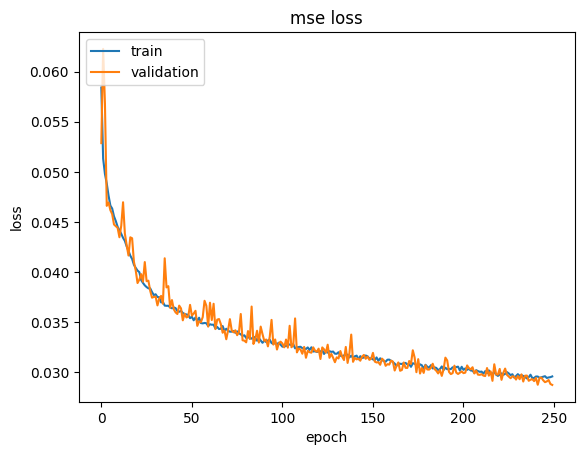

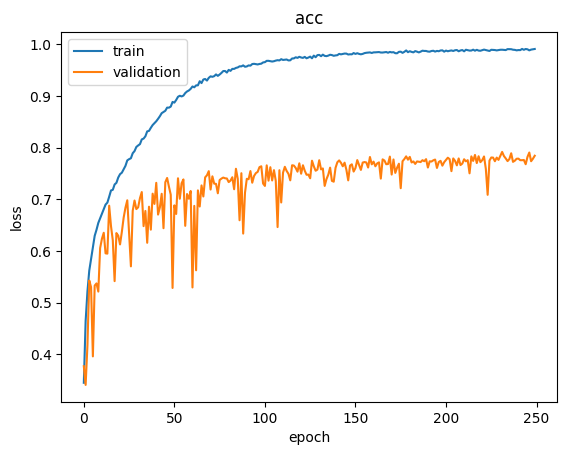

ce_acc:  0.7842000126838684
mse_loss:  0.029551224783062935
lambda:  1
learning rate:  0.04


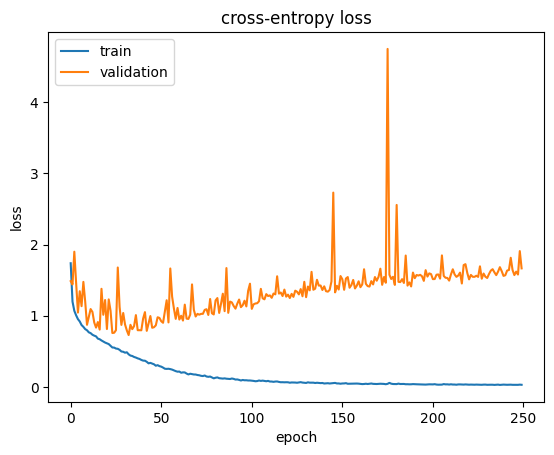

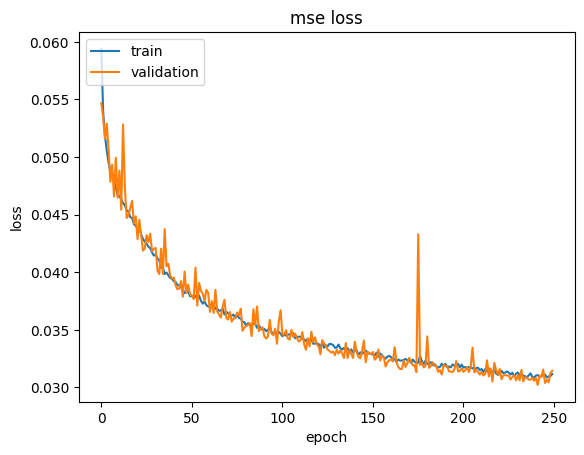

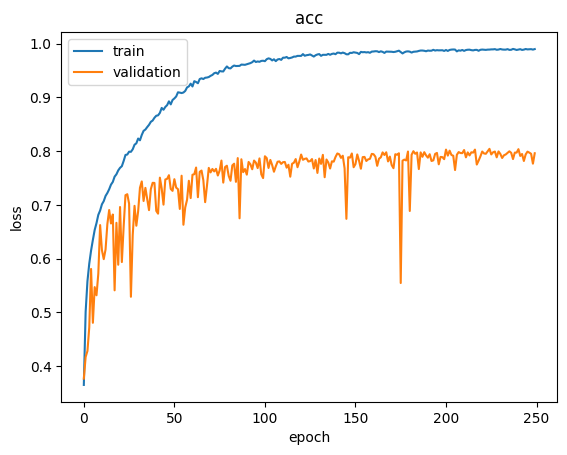

ce_acc:  0.7961999773979187
mse_loss:  0.031154513359069824
lambda:  1
learning rate:  0.03


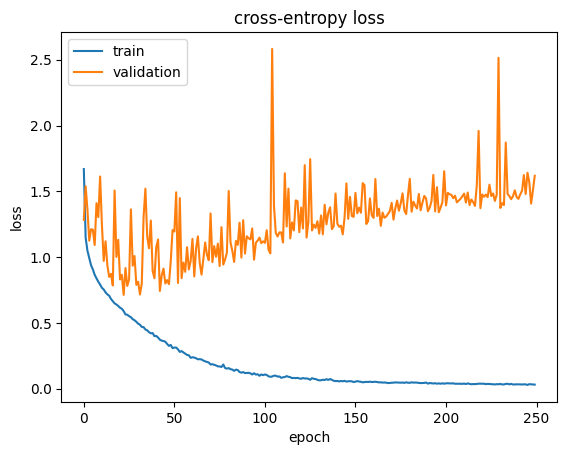

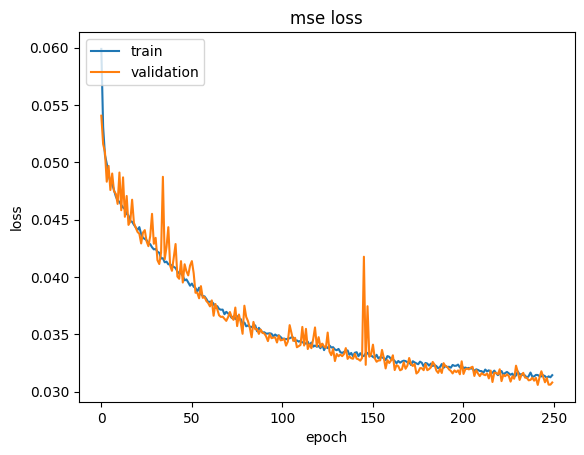

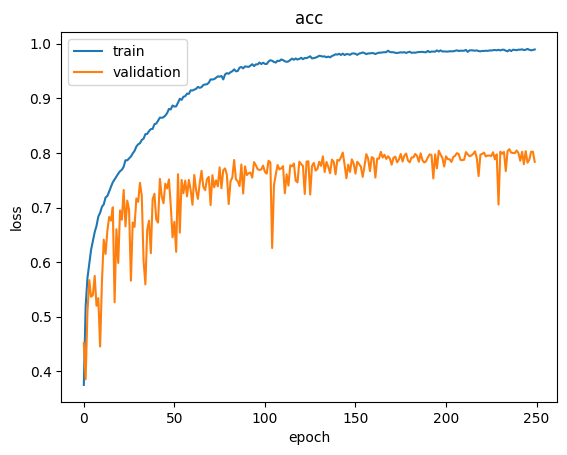

ce_acc:  0.7835999727249146
mse_loss:  0.031434737145900726
lambda:  1
learning rate:  0.02


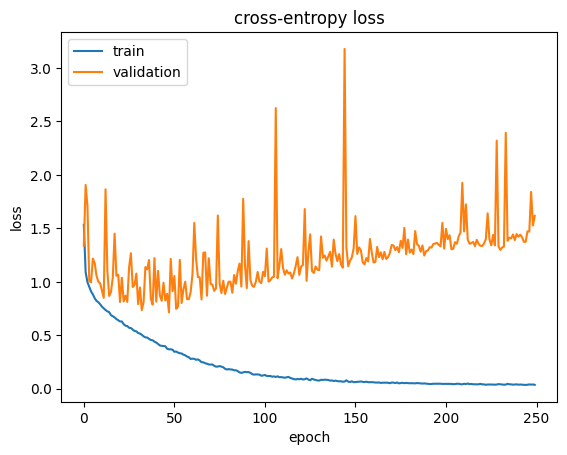

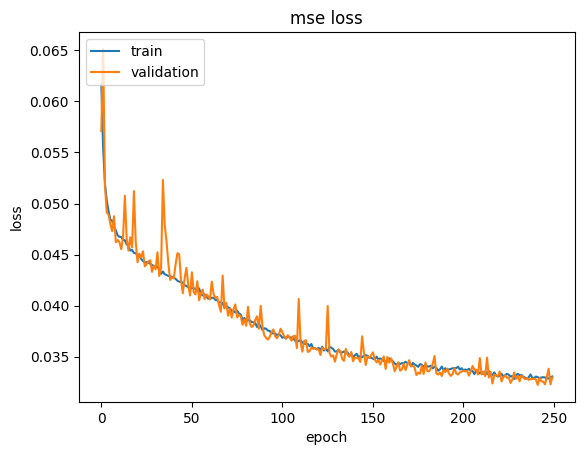

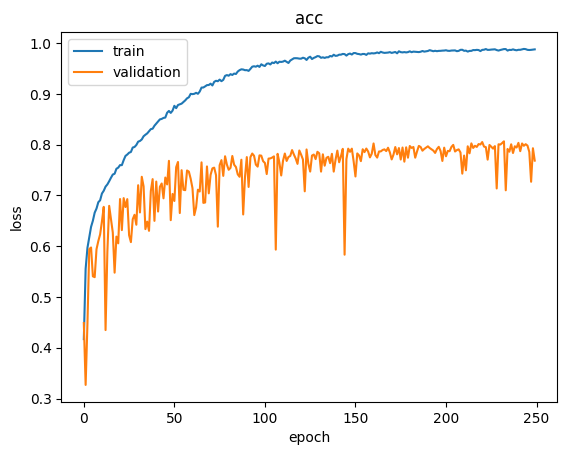

ce_acc:  0.7684000134468079
mse_loss:  0.033064767718315125
lambda:  1
learning rate:  0.01


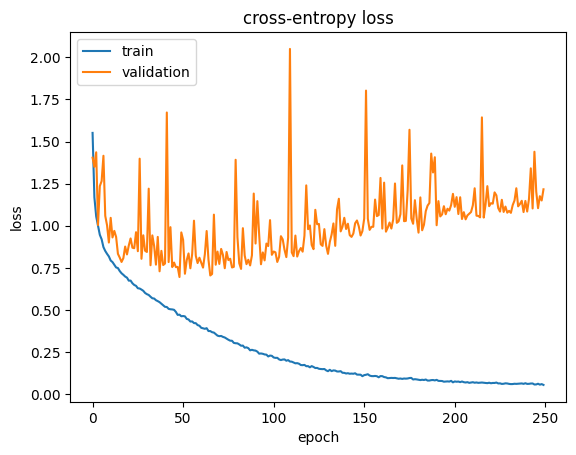

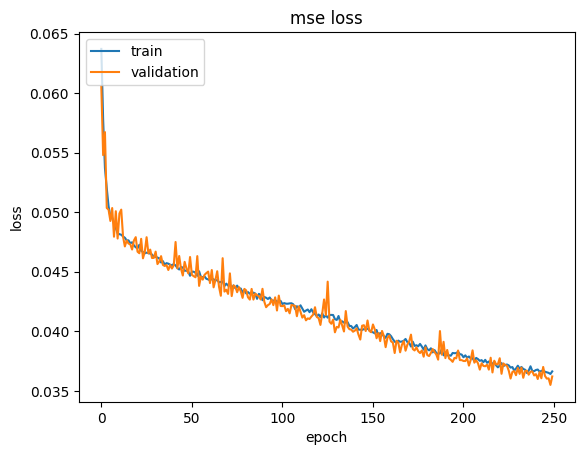

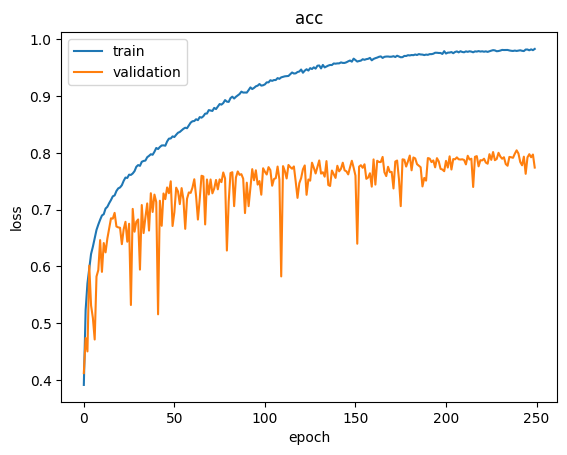

ce_acc:  0.7739999890327454
mse_loss:  0.036629583686590195
lambda:  1
learning rate:  0.008


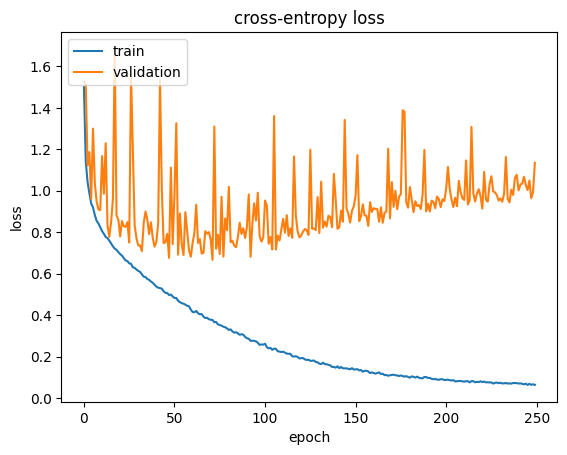

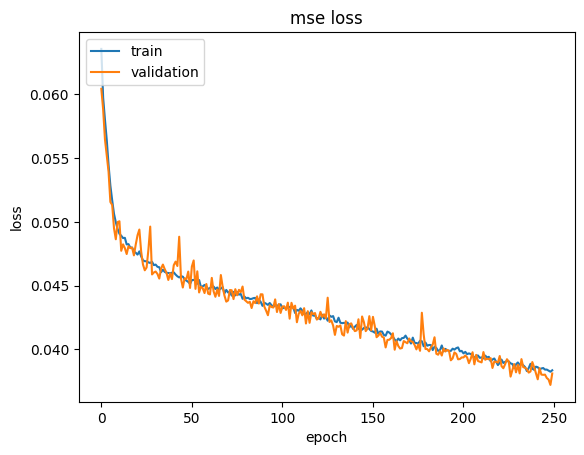

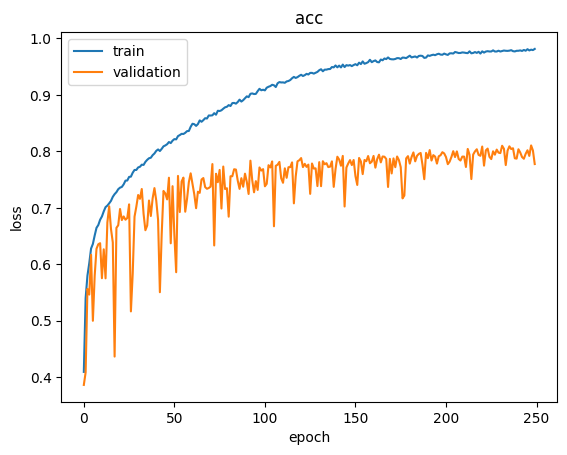

ce_acc:  0.7775999903678894
mse_loss:  0.03836064785718918
lambda:  1
learning rate:  0.005


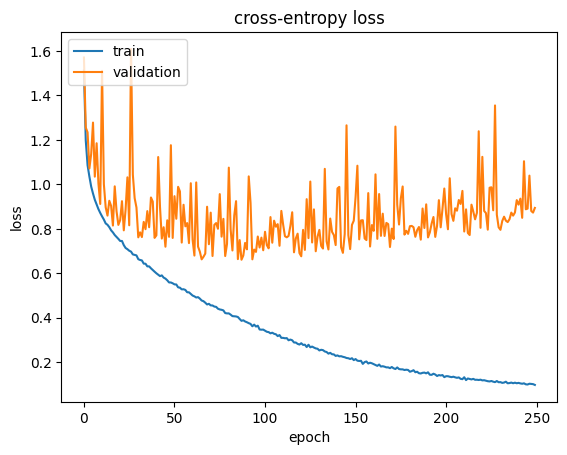

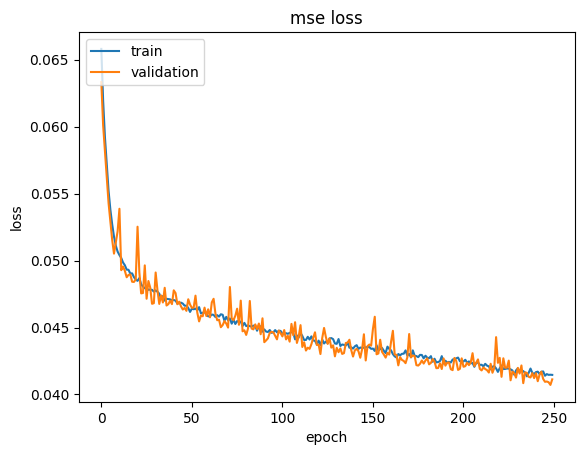

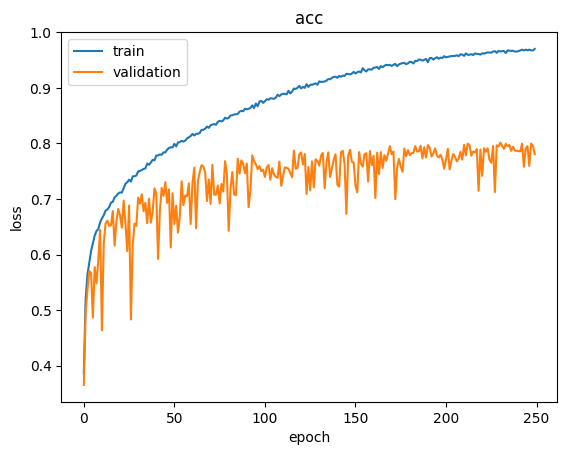

ce_acc:  0.7807999849319458
mse_loss:  0.04146408662199974


TypeError: 'NoneType' object is not subscriptable

In [90]:
## only for learning rate finding - adam
key_list = ['loss', 'CE_loss', 'mse_loss', 'CE_accuracy', 'mse']

lambda_list = [1,2,5,10]
result_list = []
learning_rate_test = [5e-2,4e-2,3e-2,2e-2,1e-2,8e-3,5e-3]

results_list = {key: [] for key in key_list}
print("current overlap is: ", (i) )
LABEL_SECOND_HALF = label2_list[5]
for learning_rate in learning_rate_test:
    print("lambda: ", 1)
    print("learning rate: ", learning_rate)
    results_list = train_first_stage(1,result_list,LABEL_SECOND_HALF,learning_rate)
print(np.array(results_list['CE_accuracy']).reshape(-1,5))


current overlap is:  0
lambda:  1
learning rate:  0.05


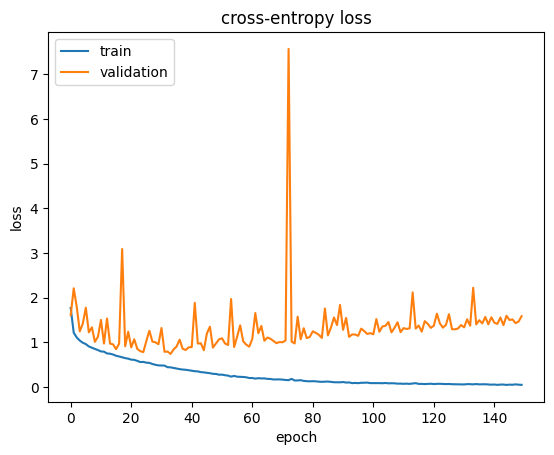

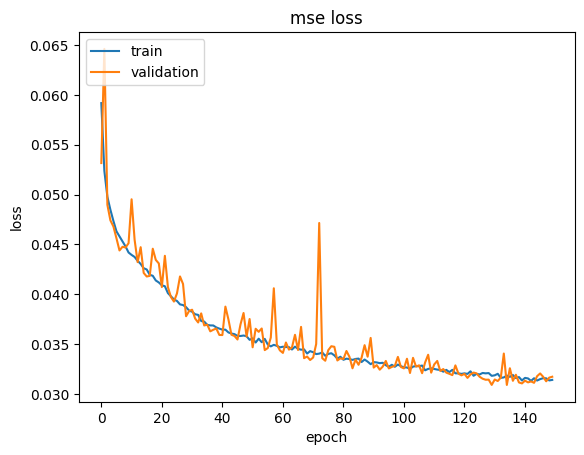

ce_acc:  0.7746000289916992
mse_loss:  0.031423889100551605
lambda:  1
learning rate:  0.04


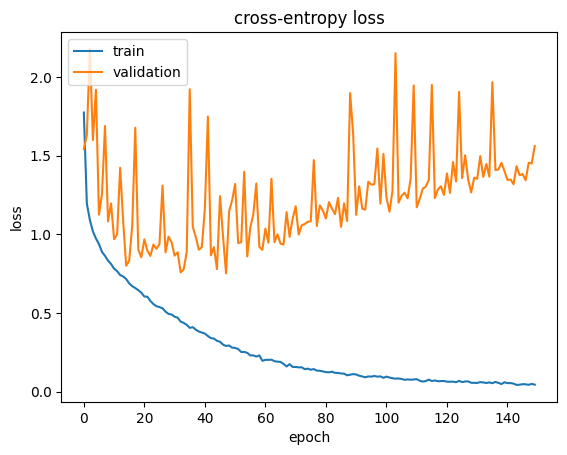

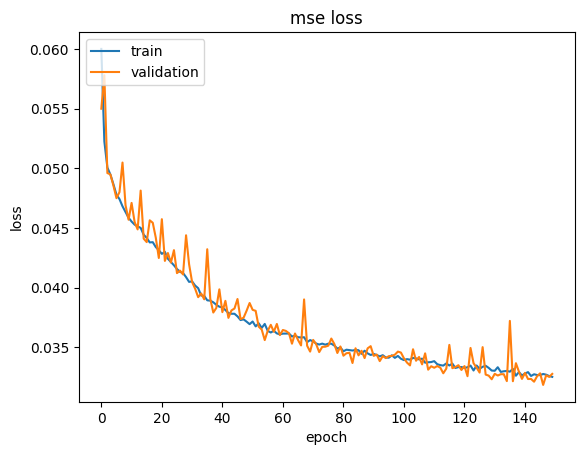

ce_acc:  0.777400016784668
mse_loss:  0.03252466395497322
lambda:  1
learning rate:  0.03


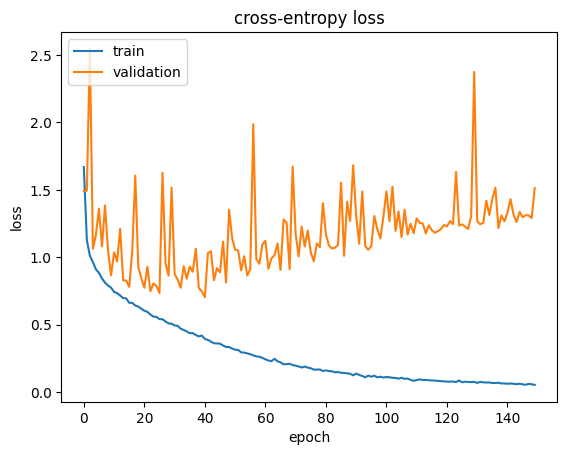

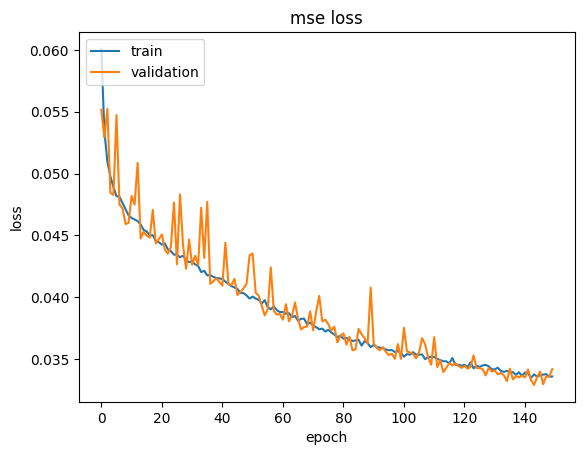

ce_acc:  0.7645999789237976
mse_loss:  0.03359582647681236
lambda:  1
learning rate:  0.02


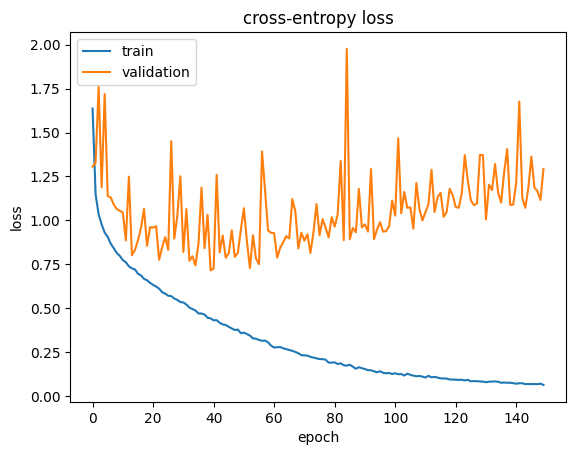

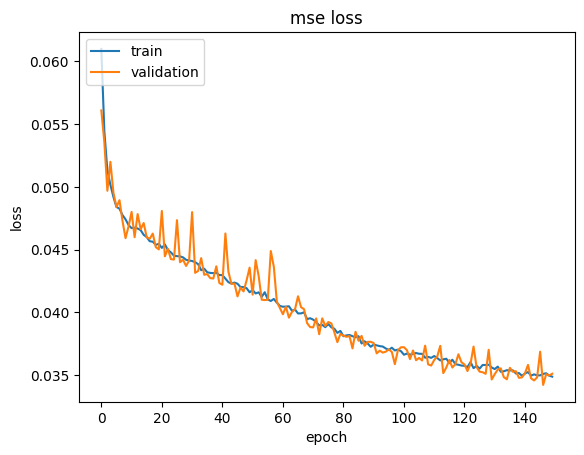

ce_acc:  0.7724000215530396
mse_loss:  0.034891415387392044
lambda:  1
learning rate:  0.01


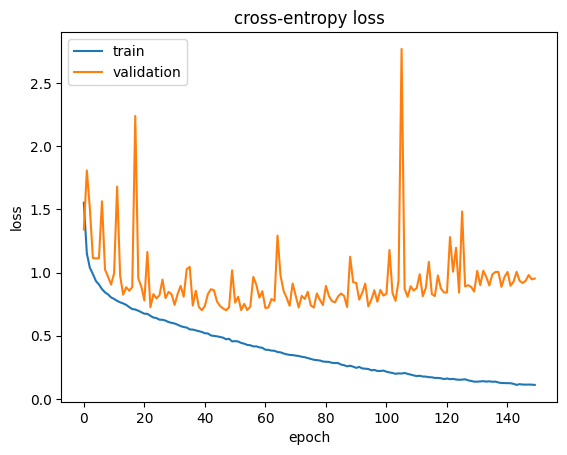

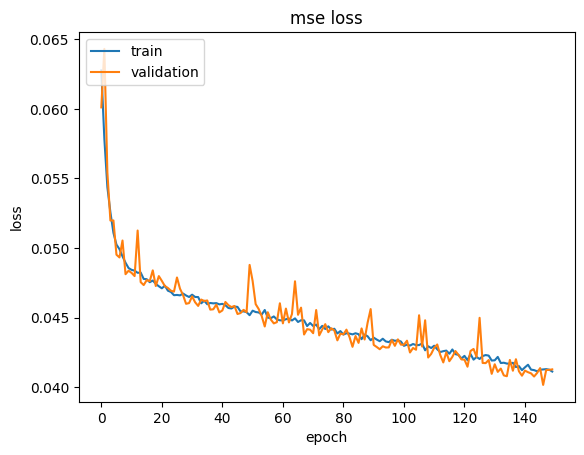

ce_acc:  0.7850000262260437
mse_loss:  0.0411202646791935
lambda:  1
learning rate:  0.008


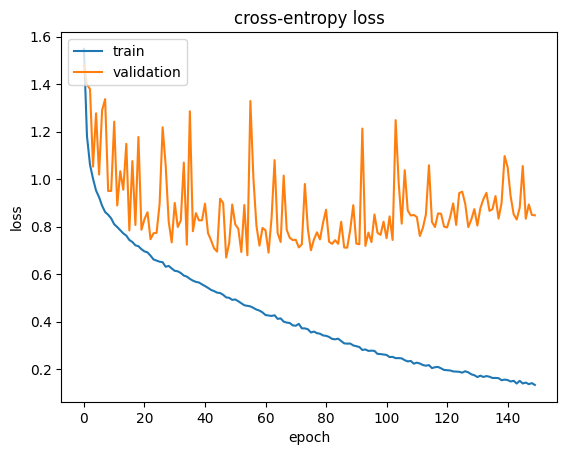

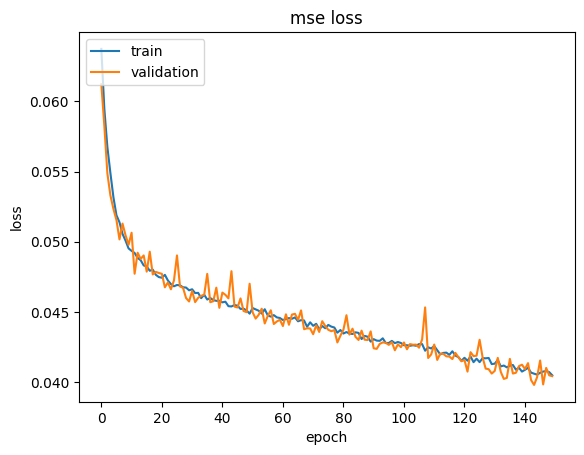

ce_acc:  0.7893999814987183
mse_loss:  0.04049303010106087
lambda:  1
learning rate:  0.005


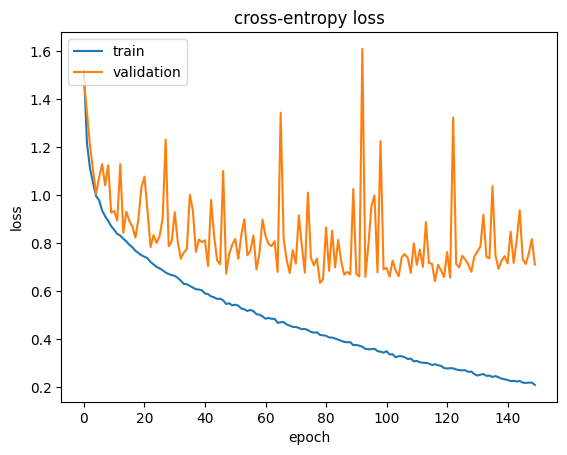

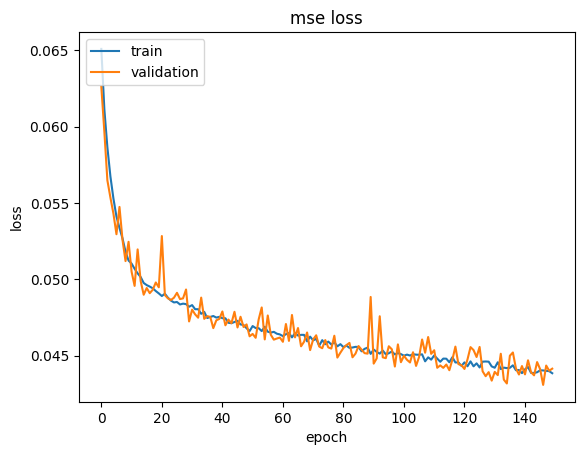

ce_acc:  0.7925999760627747
mse_loss:  0.043844301253557205


TypeError: 'NoneType' object is not subscriptable

In [81]:
## only for learning rate finding - adam
key_list = ['loss', 'CE_loss', 'mse_loss', 'CE_accuracy', 'mse']

lambda_list = [1,2,5,10]
result_list = []
learning_rate_test = [5e-2,4e-2,3e-2,2e-2,1e-2,8e-3,5e-3]

results_list = {key: [] for key in key_list}
print("current overlap is: ", (i) )
LABEL_SECOND_HALF = label2_list[5]
for learning_rate in learning_rate_test:
    print("lambda: ", 1)
    print("learning rate: ", learning_rate)
    results_list = train_first_stage(1,result_list,LABEL_SECOND_HALF,learning_rate)
print(np.array(results_list['CE_accuracy']).reshape(-1,5))


current overlap is:  0
lambda:  0


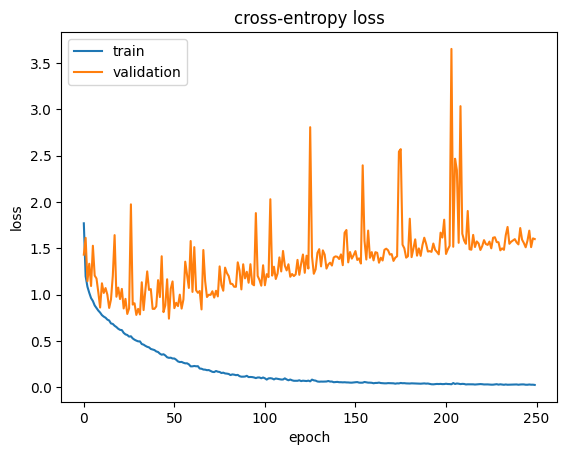

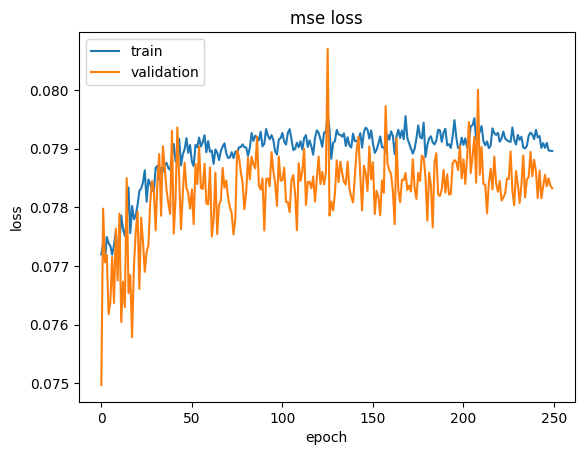

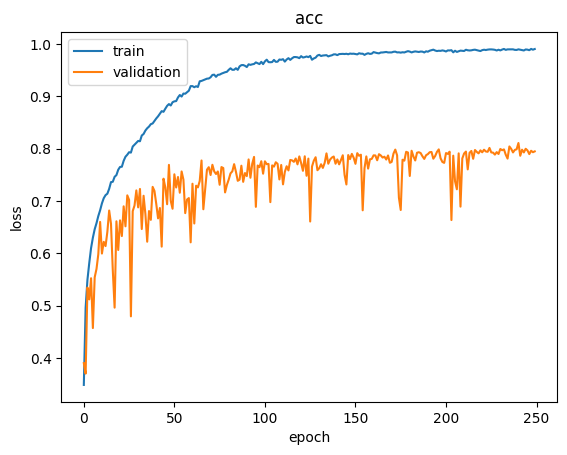

ce_acc:  0.7947999835014343
mse_loss:  0.07895687222480774
157/157 [==============================] - 1s 3ms/step - loss: 1.0114 - CE_loss: 1.0114 - mse_loss: 0.0812 - CE_accuracy: 0.8058 - mse_root_mean_squared_error: 0.2850
0.8176000118255615
lambda:  0.5


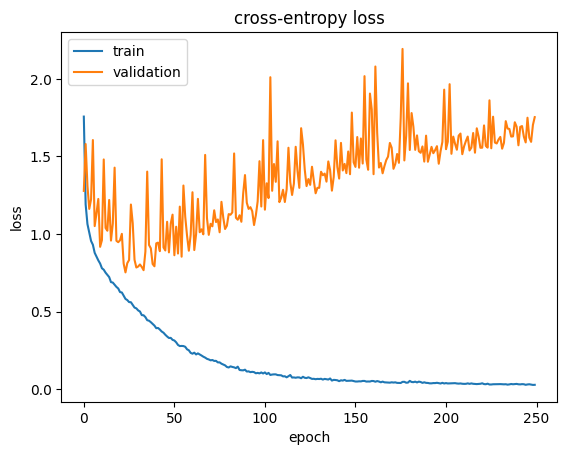

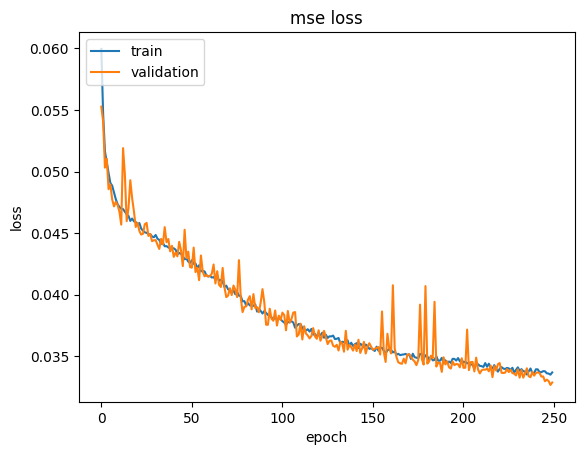

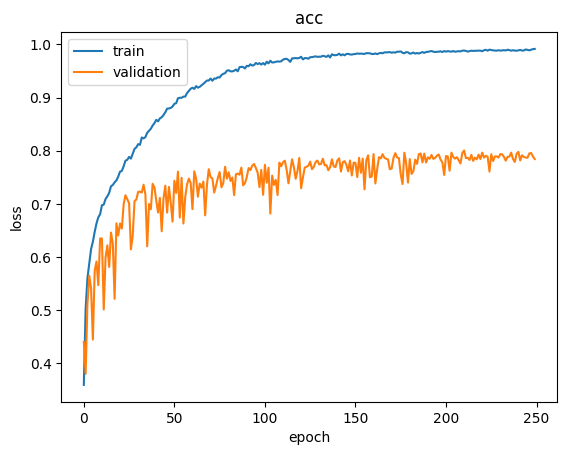

ce_acc:  0.7842000126838684
mse_loss:  0.033693958073854446
157/157 [==============================] - 0s 3ms/step - loss: 0.9411 - CE_loss: 0.9411 - mse_loss: 0.0476 - CE_accuracy: 0.8098 - mse_root_mean_squared_error: 0.2182
0.8064000010490417
lambda:  1


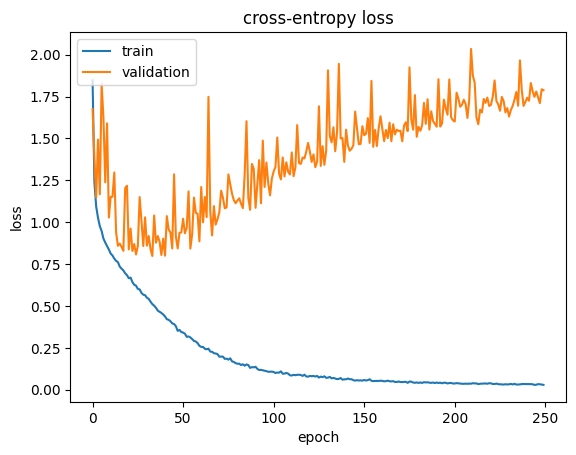

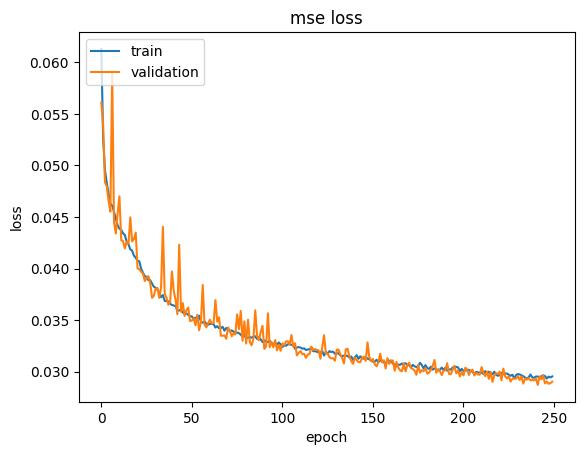

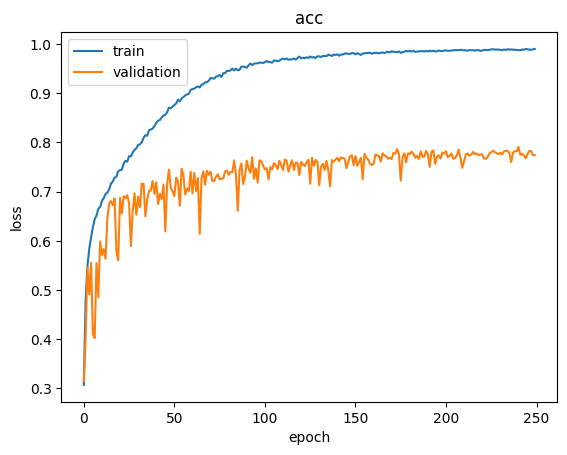

ce_acc:  0.7742000222206116
mse_loss:  0.029529938474297523
157/157 [==============================] - 1s 3ms/step - loss: 0.9437 - CE_loss: 0.9437 - mse_loss: 0.0429 - CE_accuracy: 0.7926 - mse_root_mean_squared_error: 0.2072
0.8101999759674072
lambda:  2


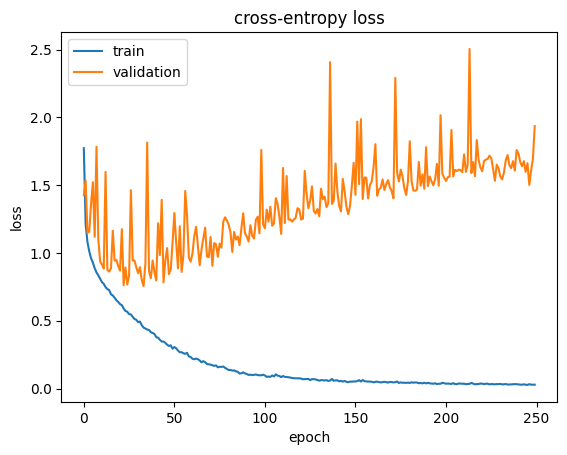

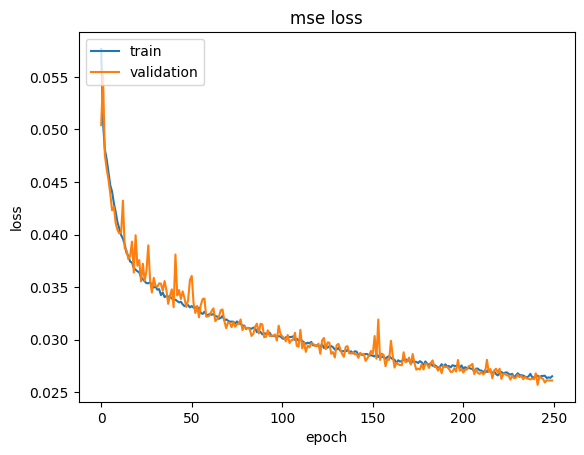

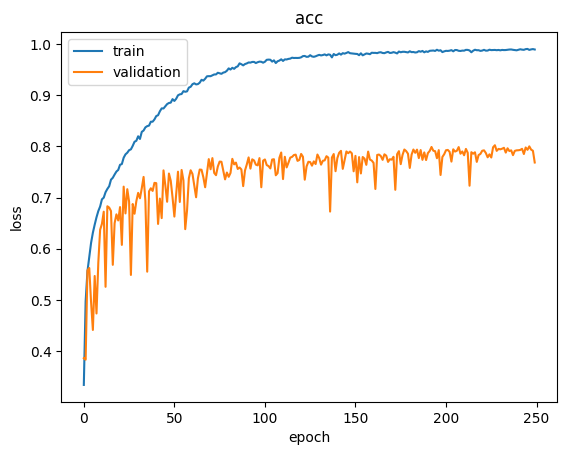

ce_acc:  0.7685999870300293
mse_loss:  0.026517126709222794
157/157 [==============================] - 1s 3ms/step - loss: 1.5211 - CE_loss: 1.5211 - mse_loss: 0.0395 - CE_accuracy: 0.7800 - mse_root_mean_squared_error: 0.1988
0.7853999733924866
lambda:  3


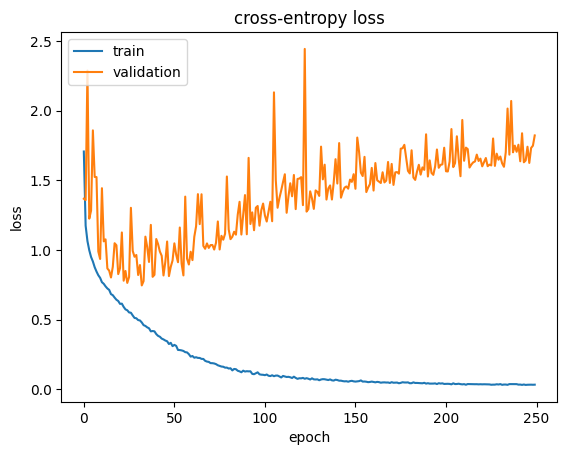

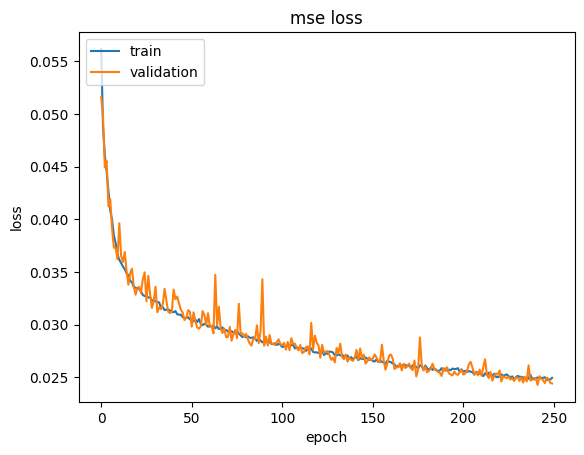

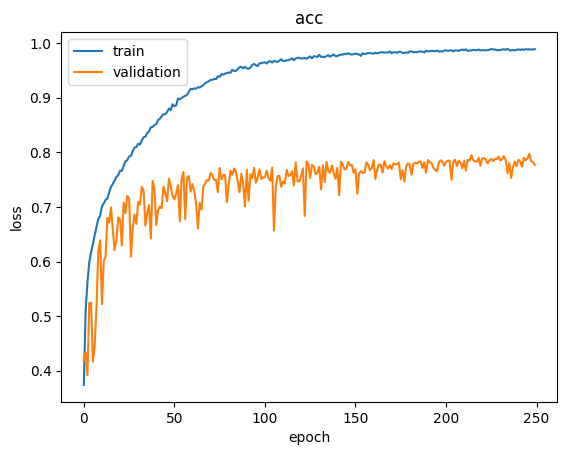

ce_acc:  0.7771999835968018
mse_loss:  0.02494538575410843
157/157 [==============================] - 0s 2ms/step - loss: 0.7746 - CE_loss: 0.7746 - mse_loss: 0.0381 - CE_accuracy: 0.8286 - mse_root_mean_squared_error: 0.1953
0.8414000272750854
lambda:  4


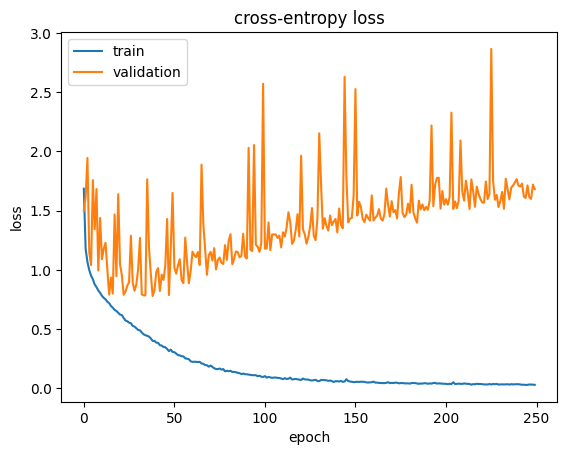

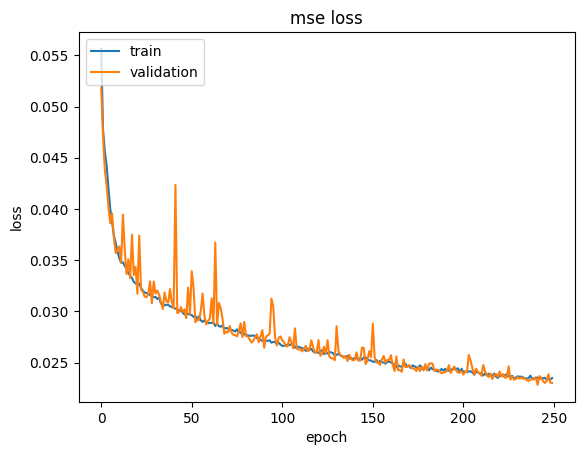

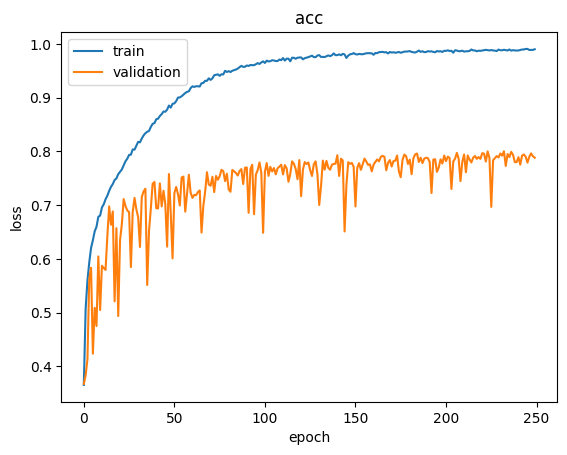

ce_acc:  0.7882000207901001
mse_loss:  0.02347937971353531
157/157 [==============================] - 1s 4ms/step - loss: 1.3199 - CE_loss: 1.3199 - mse_loss: 0.0375 - CE_accuracy: 0.7664 - mse_root_mean_squared_error: 0.1936
0.7753999829292297
lambda:  5


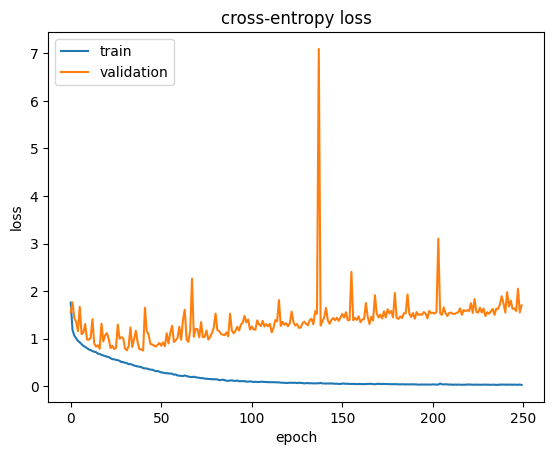

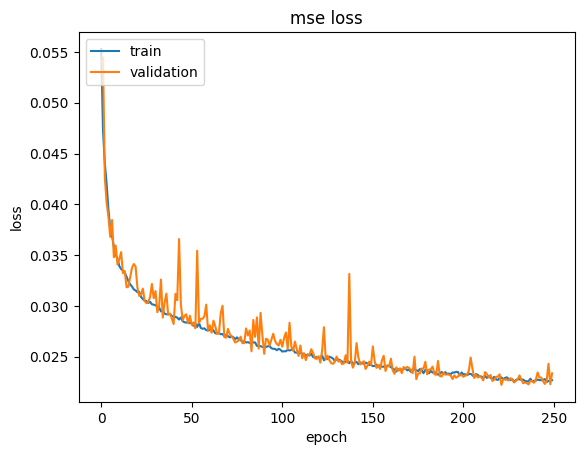

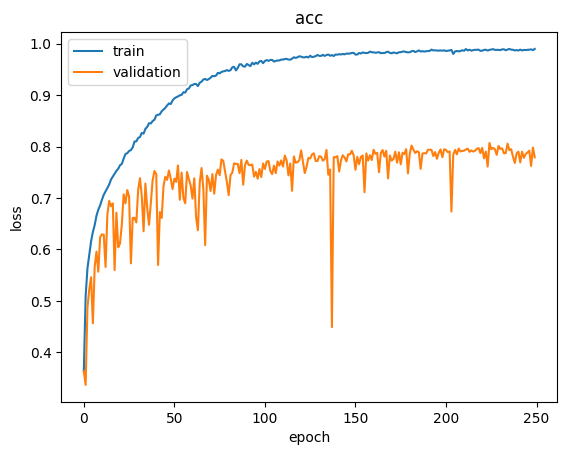

ce_acc:  0.77920001745224
mse_loss:  0.022685404866933823
157/157 [==============================] - 0s 3ms/step - loss: 0.9282 - CE_loss: 0.9282 - mse_loss: 0.0375 - CE_accuracy: 0.8072 - mse_root_mean_squared_error: 0.1935
0.8148000240325928
lambda:  6


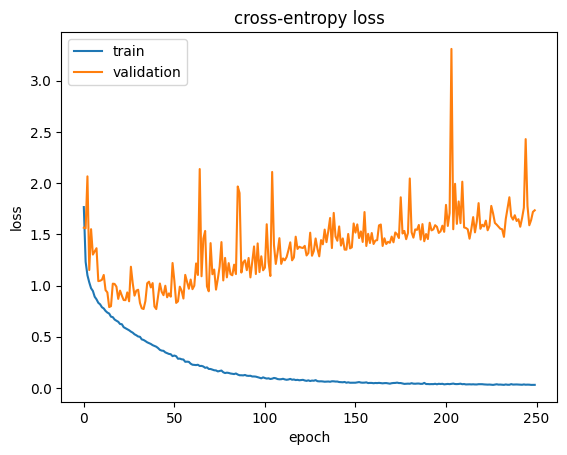

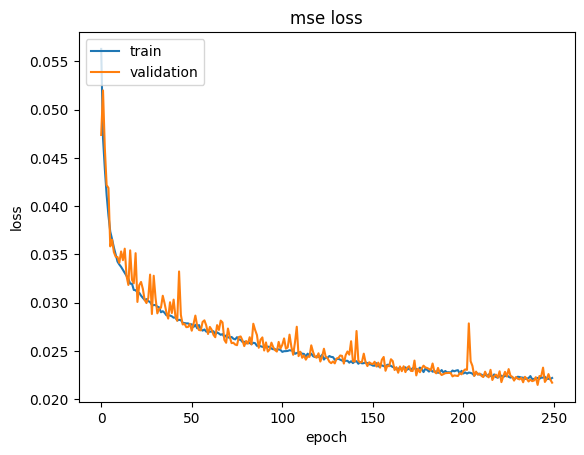

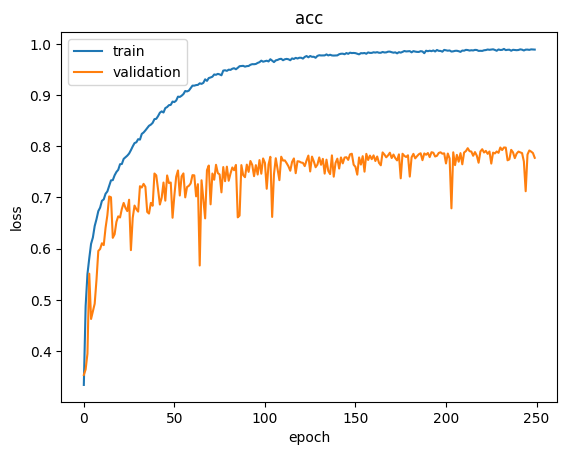

ce_acc:  0.777400016784668
mse_loss:  0.02221713587641716


KeyboardInterrupt: 

In [93]:
key_list = ['loss', 'CE_loss', 'mse_loss', 'CE_accuracy', 'mse']

lambda_list = [0,0.5,1,2,3,4,5,6,7,8,9,10]


results_list = {key: [] for key in key_list}
for i in range(6):

    print("current overlap is: ", (i) )
    acc_list = [] 
    LABEL_SECOND_HALF = label2_list[5-i]
    for lambda_val in lambda_list:
        print("lambda: ", lambda_val)
        train_first_stage(lambda_val,results_list,LABEL_SECOND_HALF)
    print(np.array(results_list['CE_accuracy']).reshape(-1,5))


current overlap is:  0
lambda:  0


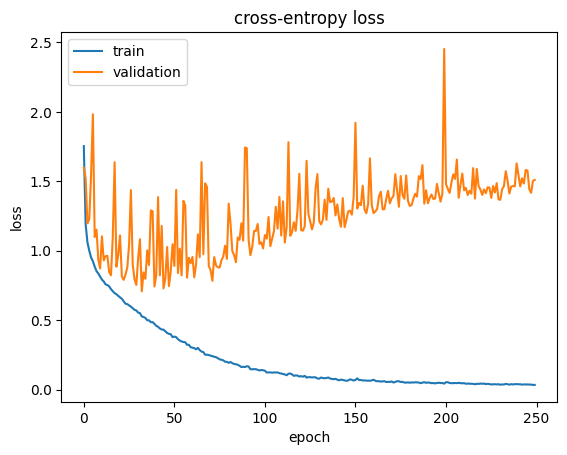

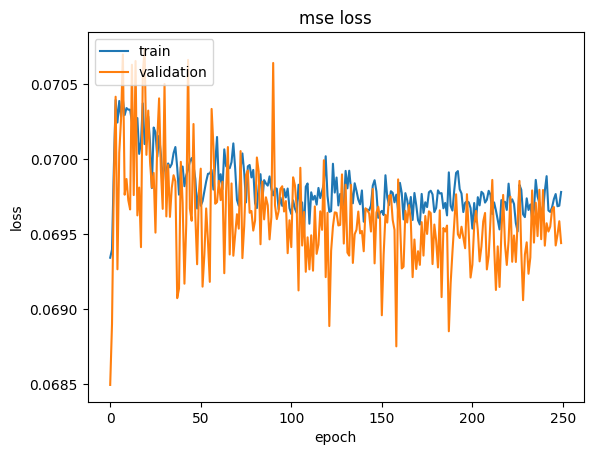

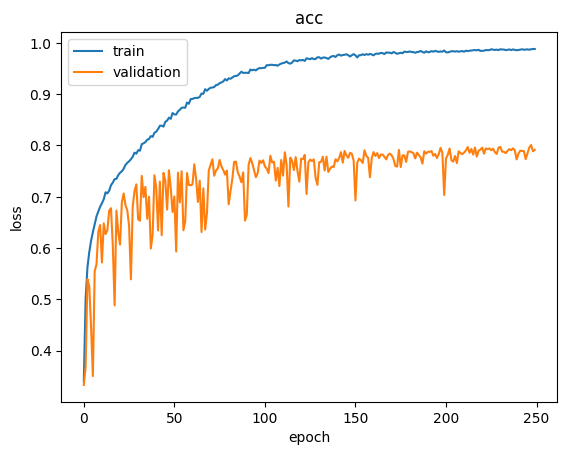

ce_acc:  0.7914000153541565
mse_loss:  0.06978003680706024
157/157 [==============================] - 1s 3ms/step - loss: 1.4614 - CE_loss: 1.4614 - mse_loss: 0.0710 - CE_accuracy: 0.7126 - mse_root_mean_squared_error: 0.2665
0.725600004196167
lambda:  1


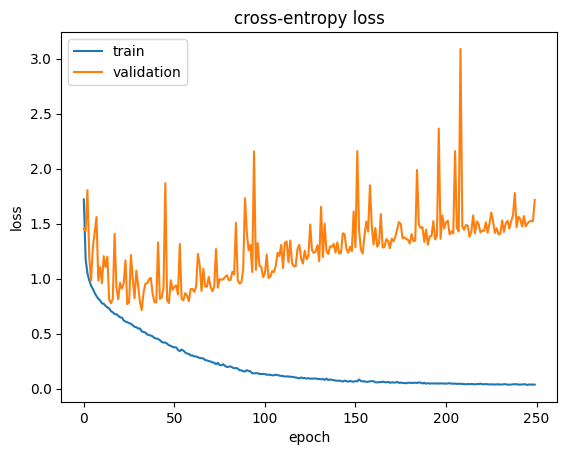

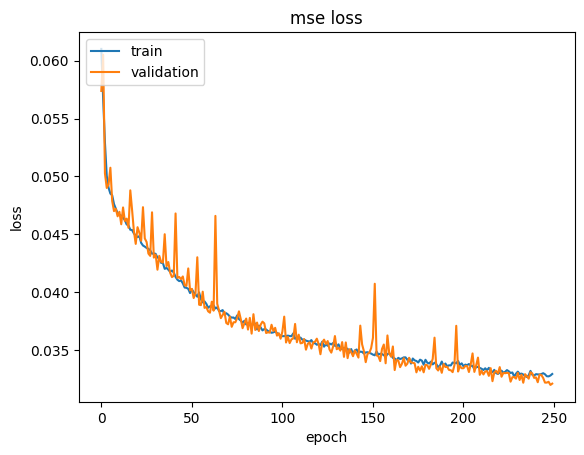

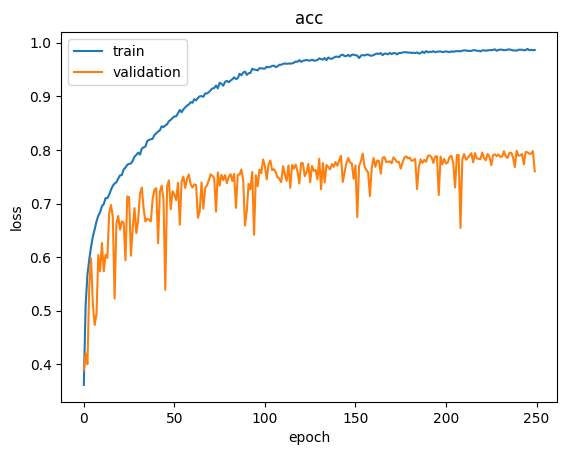

ce_acc:  0.7599999904632568
mse_loss:  0.03293362632393837
157/157 [==============================] - 0s 3ms/step - loss: 1.0520 - CE_loss: 1.0520 - mse_loss: 0.0441 - CE_accuracy: 0.7714 - mse_root_mean_squared_error: 0.2101
0.7954000234603882
lambda:  2


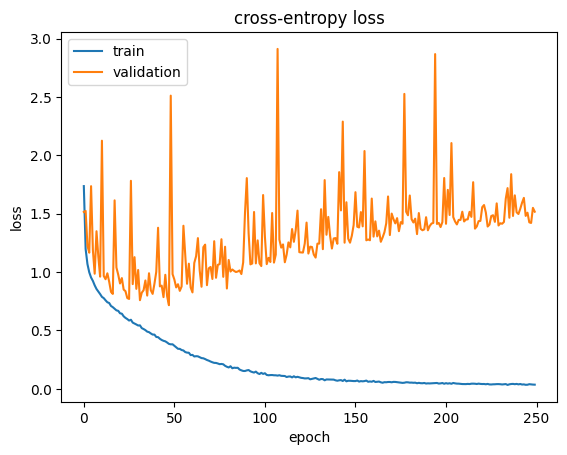

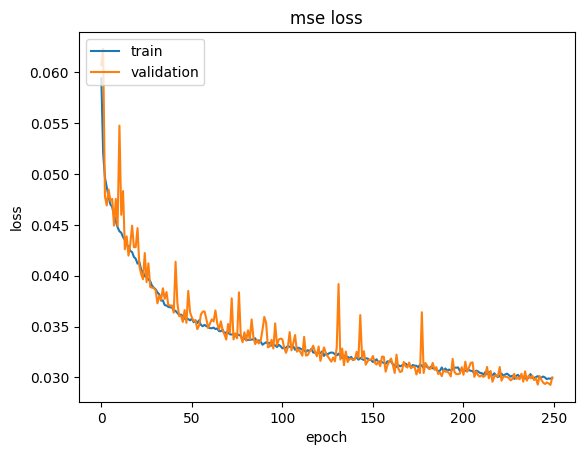

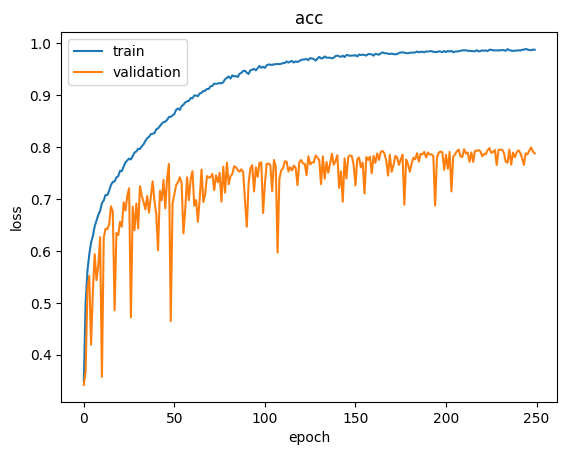

ce_acc:  0.7875999808311462
mse_loss:  0.029958441853523254
157/157 [==============================] - 0s 3ms/step - loss: 0.8393 - CE_loss: 0.8393 - mse_loss: 0.0433 - CE_accuracy: 0.8032 - mse_root_mean_squared_error: 0.2082
0.8068000078201294
lambda:  5


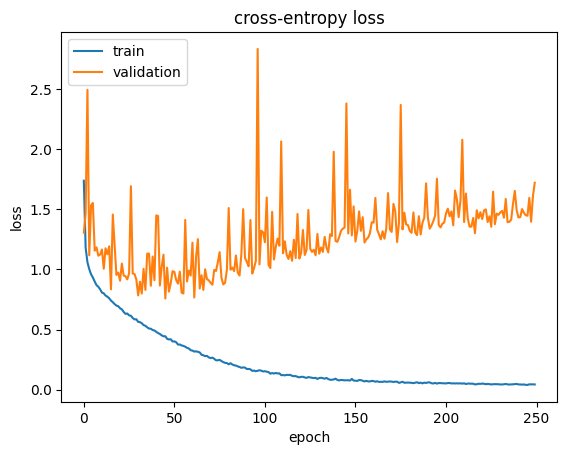

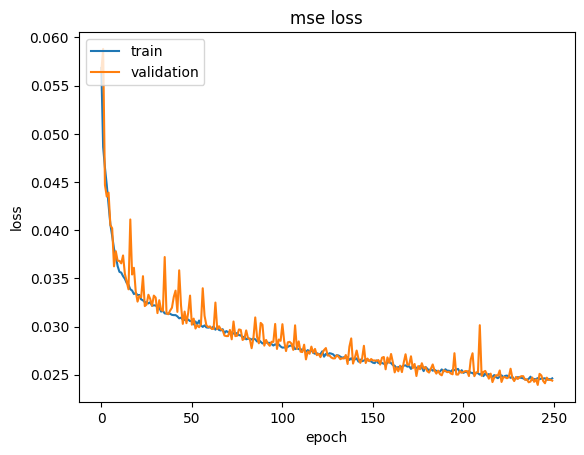

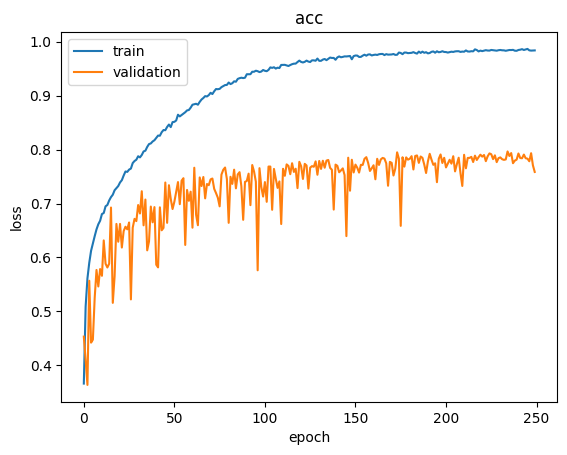

ce_acc:  0.7585999965667725
mse_loss:  0.024625930935144424
157/157 [==============================] - 0s 3ms/step - loss: 0.9132 - CE_loss: 0.9132 - mse_loss: 0.0364 - CE_accuracy: 0.8002 - mse_root_mean_squared_error: 0.1908
0.8123999834060669
lambda:  10


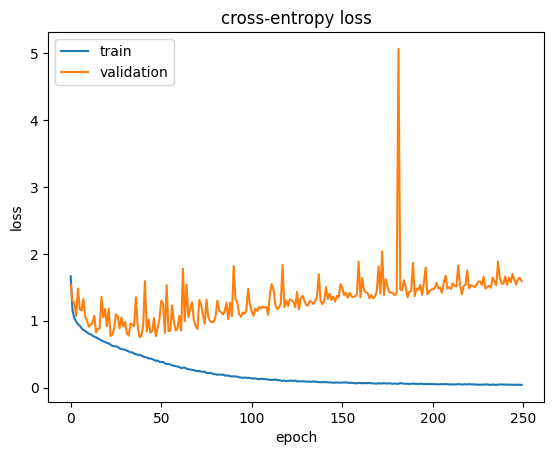

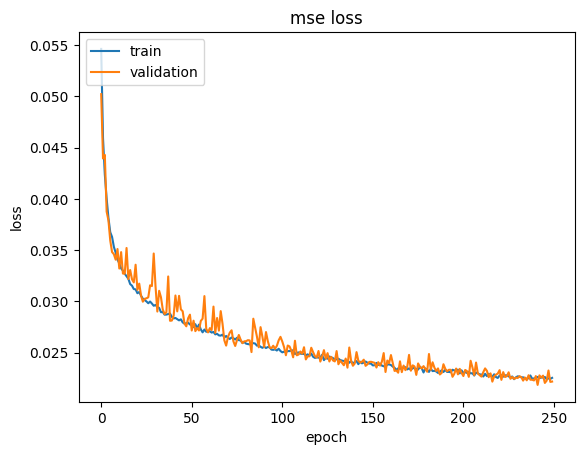

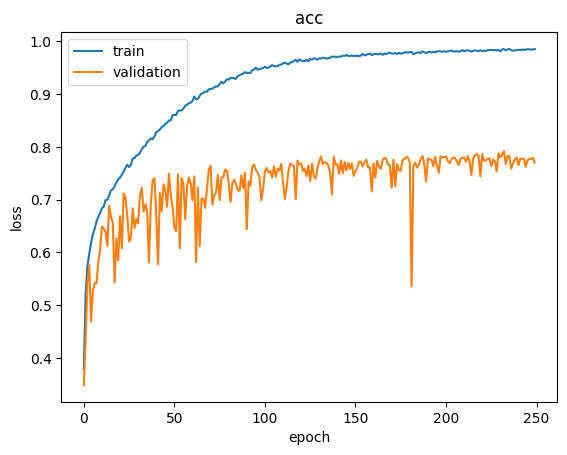

ce_acc:  0.7702000141143799
mse_loss:  0.022547878324985504
157/157 [==============================] - 0s 3ms/step - loss: 0.6423 - CE_loss: 0.6423 - mse_loss: 0.0371 - CE_accuracy: 0.8256 - mse_root_mean_squared_error: 0.1927
0.8464000225067139
[[0.71259999 0.77139997 0.80320001 0.80019999 0.82560003]]
current overlap is:  1
lambda:  0


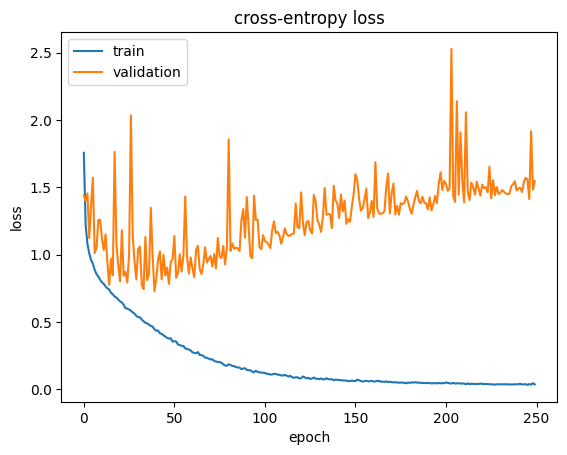

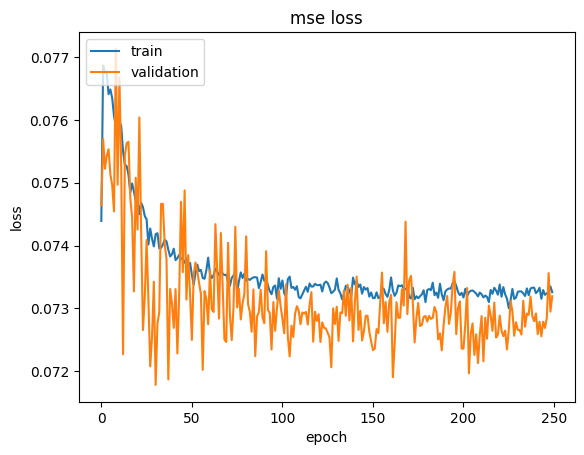

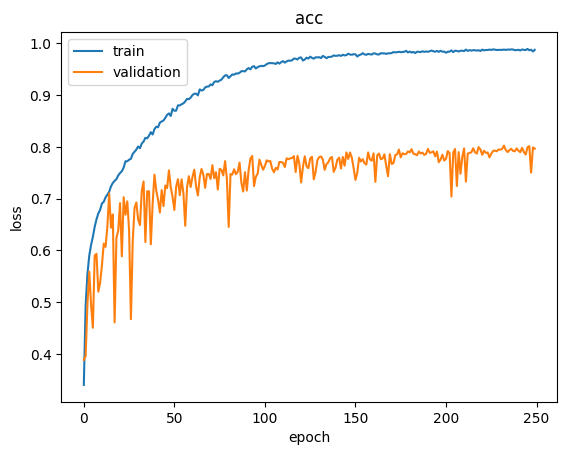

ce_acc:  0.7964000105857849
mse_loss:  0.07325717061758041
157/157 [==============================] - 0s 3ms/step - loss: 1.0220 - CE_loss: 1.0220 - mse_loss: 0.0697 - CE_accuracy: 0.7640 - mse_root_mean_squared_error: 0.2640
0.7746000289916992
lambda:  1


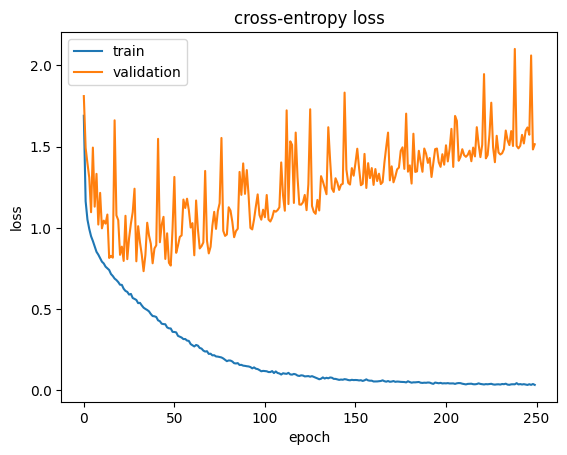

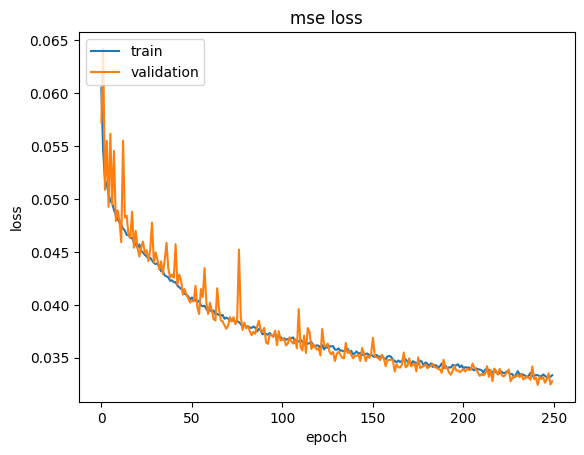

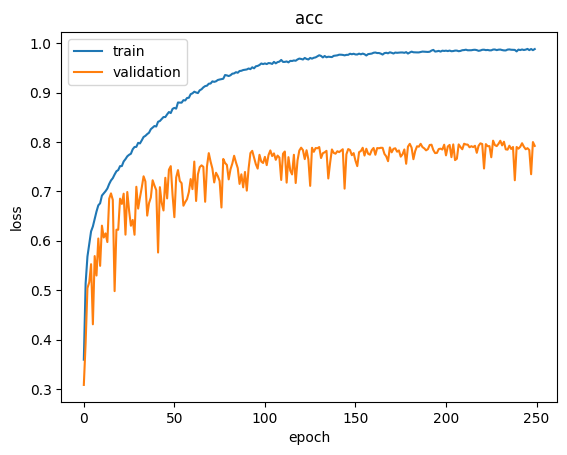

ce_acc:  0.7922000288963318
mse_loss:  0.03334745764732361
157/157 [==============================] - 0s 3ms/step - loss: 0.6969 - CE_loss: 0.6969 - mse_loss: 0.0392 - CE_accuracy: 0.8106 - mse_root_mean_squared_error: 0.1979
0.8076000213623047
lambda:  2


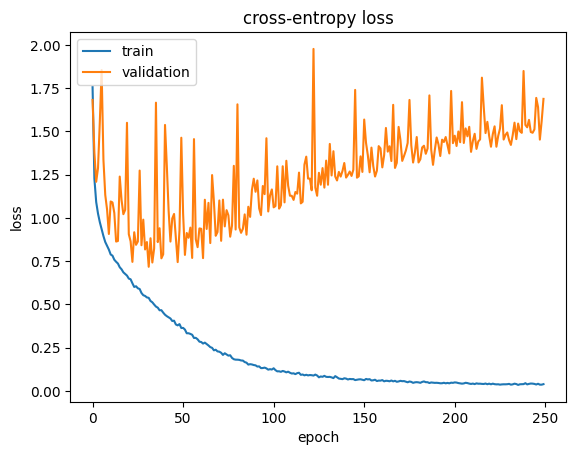

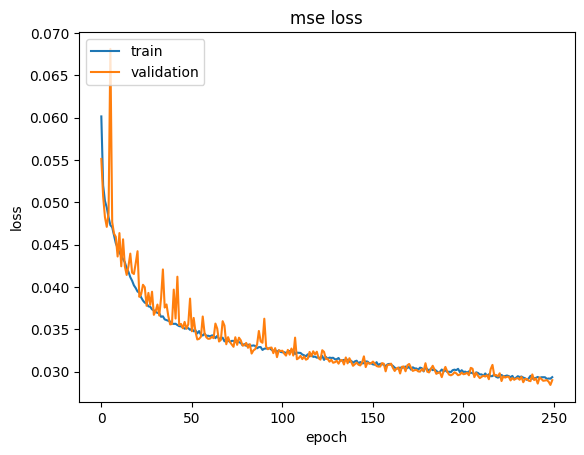

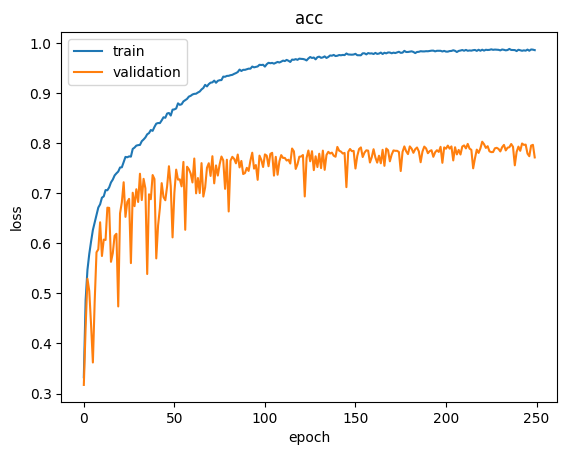

ce_acc:  0.7717999815940857
mse_loss:  0.029350515455007553
157/157 [==============================] - 1s 3ms/step - loss: 0.7992 - CE_loss: 0.7992 - mse_loss: 0.0372 - CE_accuracy: 0.7970 - mse_root_mean_squared_error: 0.1928
0.8023999929428101
lambda:  5


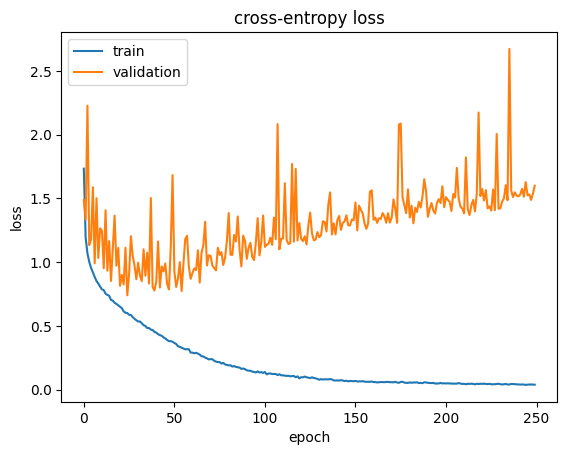

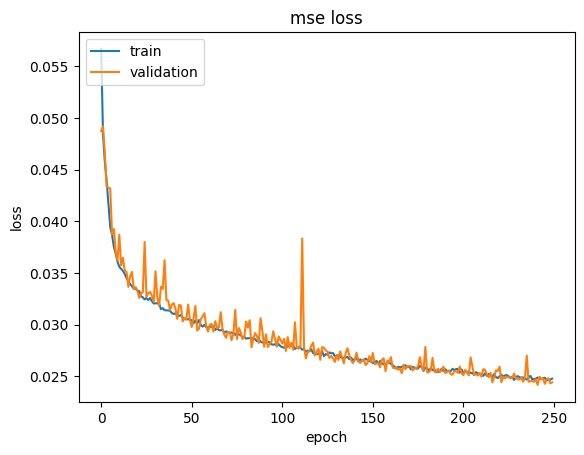

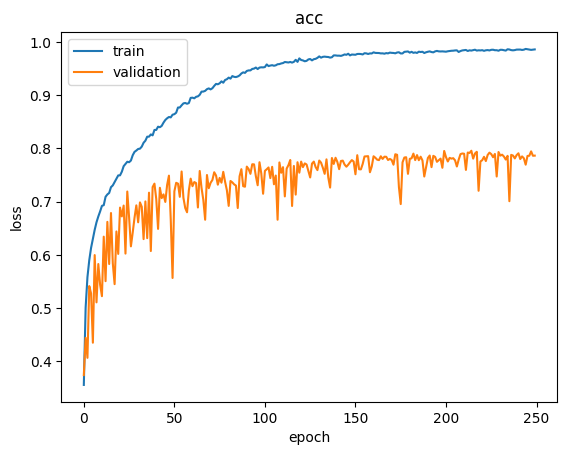

ce_acc:  0.7865999937057495
mse_loss:  0.024773910641670227
157/157 [==============================] - 0s 3ms/step - loss: 0.8065 - CE_loss: 0.8065 - mse_loss: 0.0321 - CE_accuracy: 0.7930 - mse_root_mean_squared_error: 0.1793
0.7972000241279602
lambda:  10


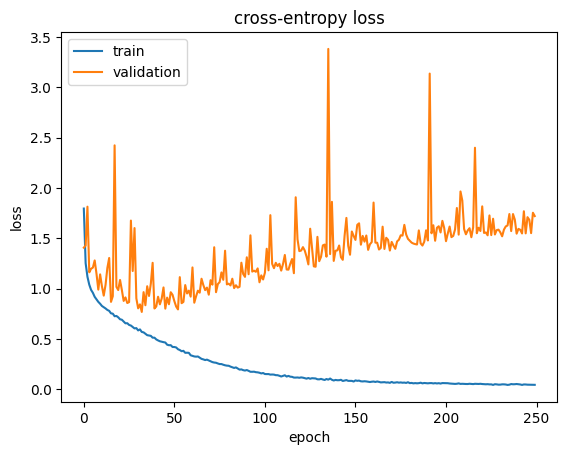

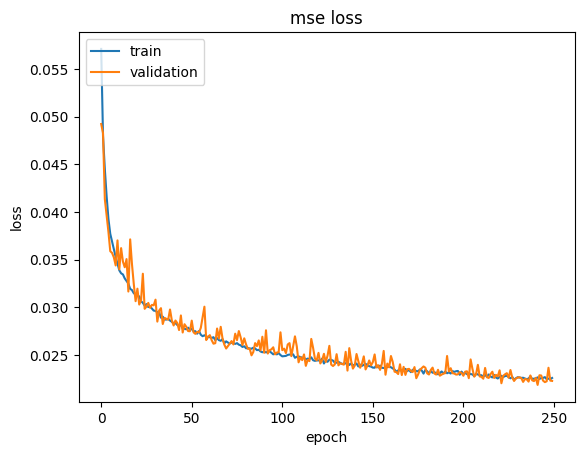

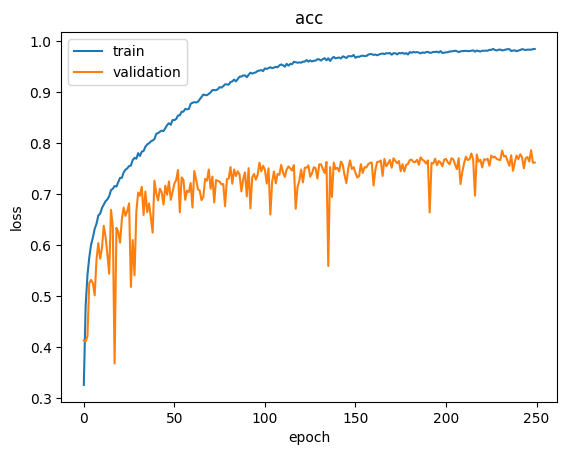

ce_acc:  0.7621999979019165
mse_loss:  0.022572848945856094
157/157 [==============================] - 0s 3ms/step - loss: 0.8696 - CE_loss: 0.8696 - mse_loss: 0.0302 - CE_accuracy: 0.7718 - mse_root_mean_squared_error: 0.1736
0.7842000126838684
[[0.71259999 0.77139997 0.80320001 0.80019999 0.82560003]
 [0.764      0.81059998 0.79699999 0.79299998 0.77179998]]
current overlap is:  2
lambda:  0


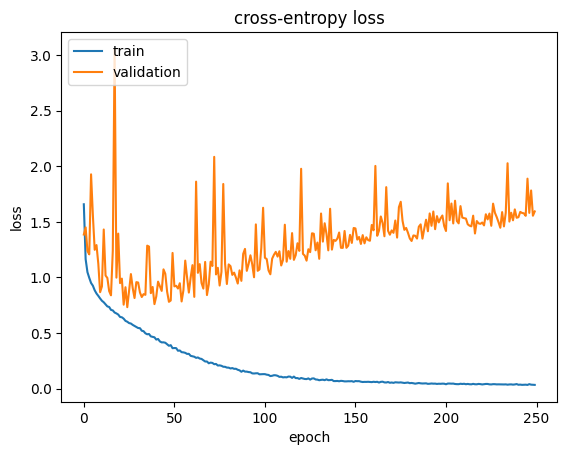

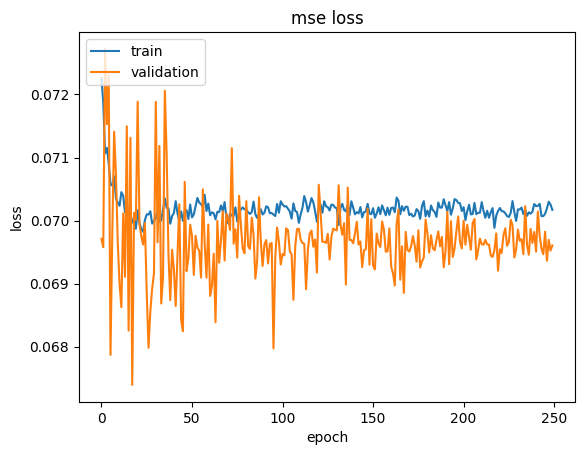

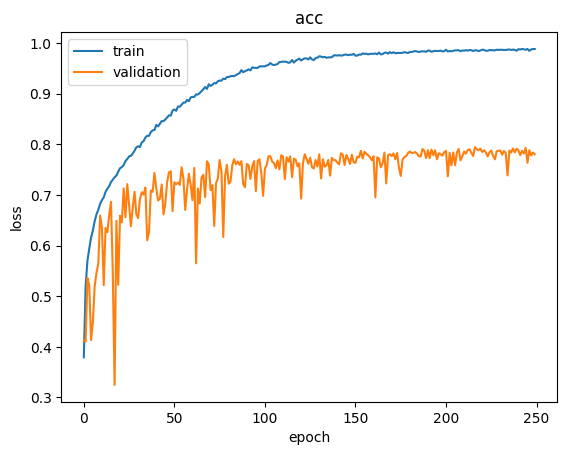

ce_acc:  0.7803999781608582
mse_loss:  0.07016895711421967
157/157 [==============================] - 0s 3ms/step - loss: 2.2354 - CE_loss: 2.2354 - mse_loss: 0.0686 - CE_accuracy: 0.5574 - mse_root_mean_squared_error: 0.2620
0.5595999956130981
lambda:  1


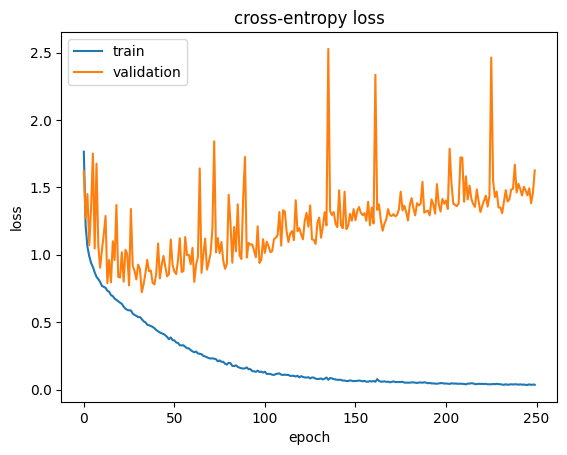

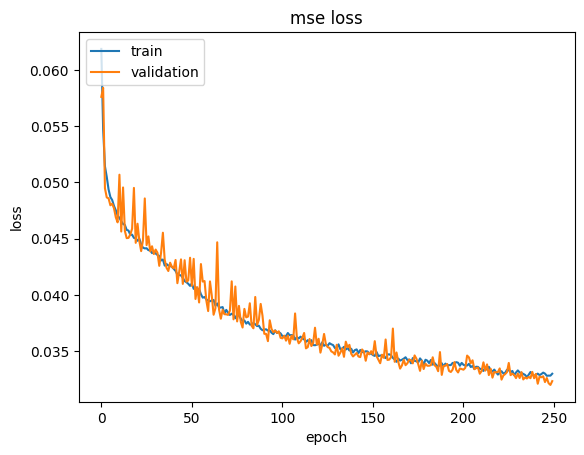

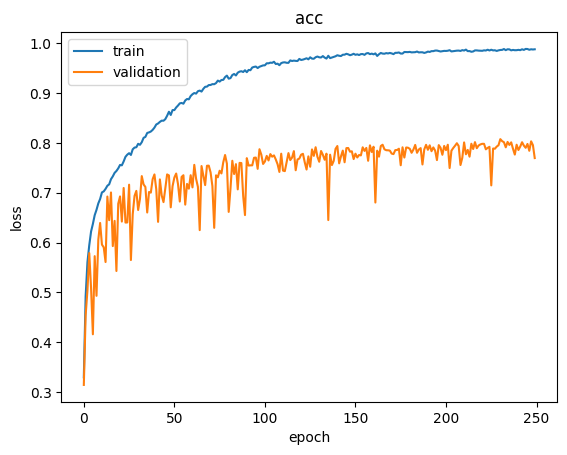

ce_acc:  0.769599974155426
mse_loss:  0.032985080033540726
157/157 [==============================] - 0s 2ms/step - loss: 1.2533 - CE_loss: 1.2533 - mse_loss: 0.0398 - CE_accuracy: 0.6770 - mse_root_mean_squared_error: 0.1994
0.6850000023841858
lambda:  2


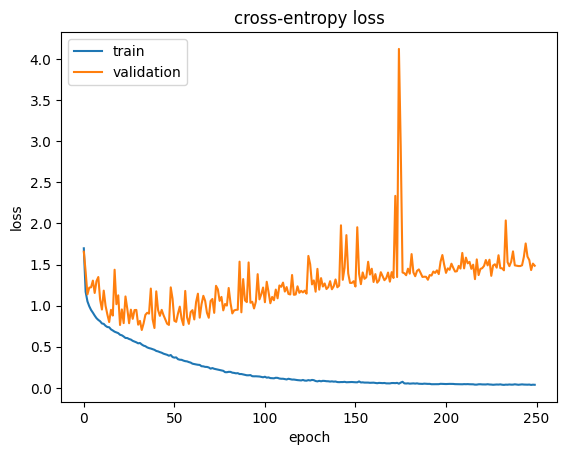

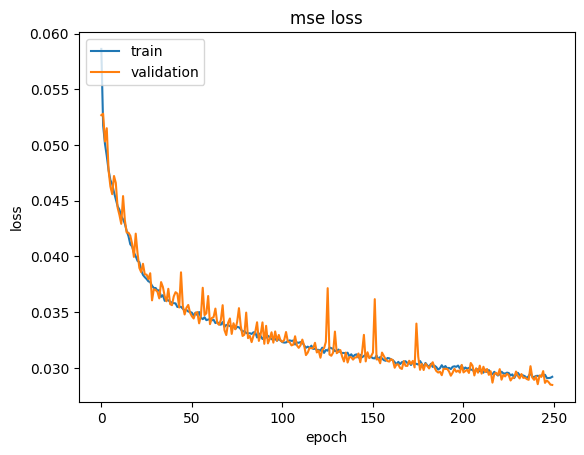

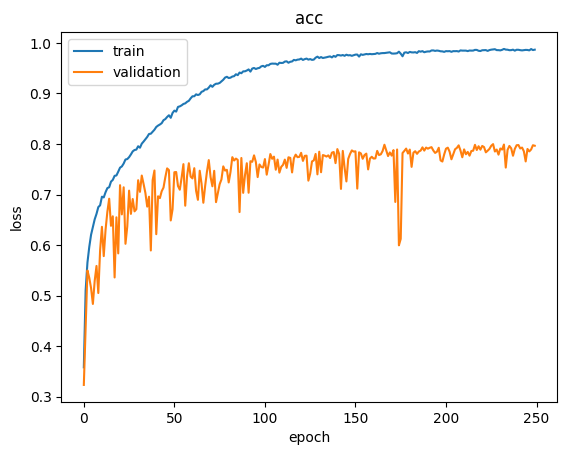

ce_acc:  0.7965999841690063
mse_loss:  0.029209831729531288
157/157 [==============================] - 0s 3ms/step - loss: 1.1987 - CE_loss: 1.1987 - mse_loss: 0.0349 - CE_accuracy: 0.6908 - mse_root_mean_squared_error: 0.1867
0.7024000287055969
lambda:  5


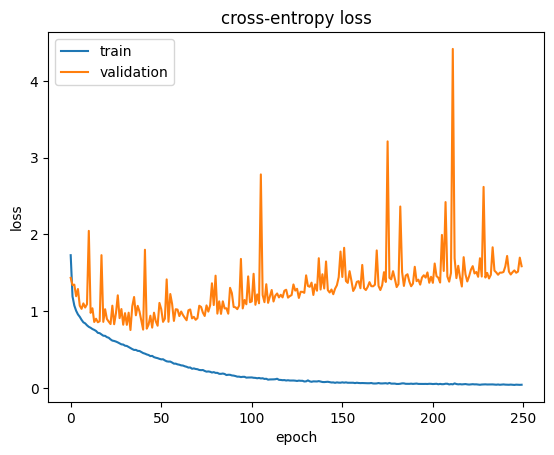

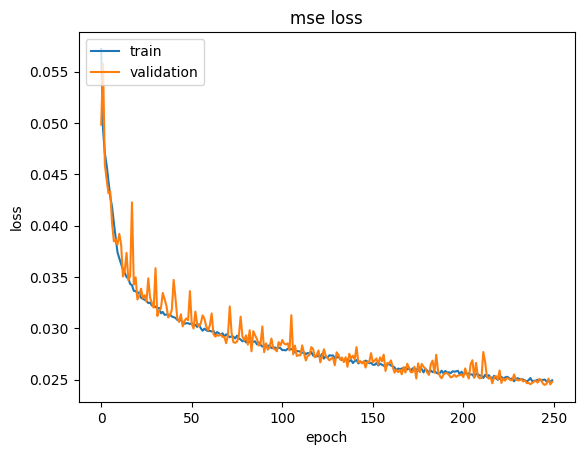

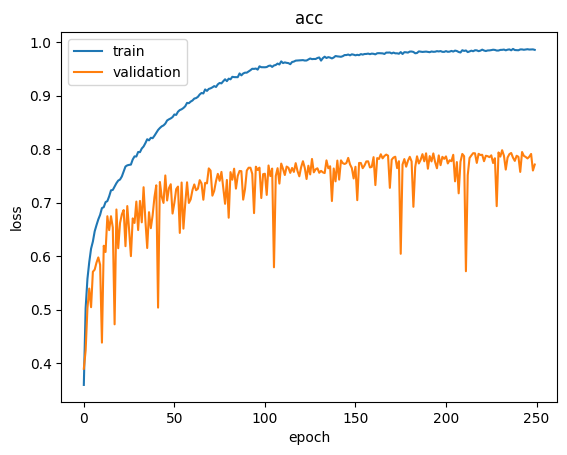

ce_acc:  0.7710000276565552
mse_loss:  0.02492508850991726
157/157 [==============================] - 0s 3ms/step - loss: 1.5922 - CE_loss: 1.5922 - mse_loss: 0.0330 - CE_accuracy: 0.6178 - mse_root_mean_squared_error: 0.1816
0.6313999891281128
lambda:  10


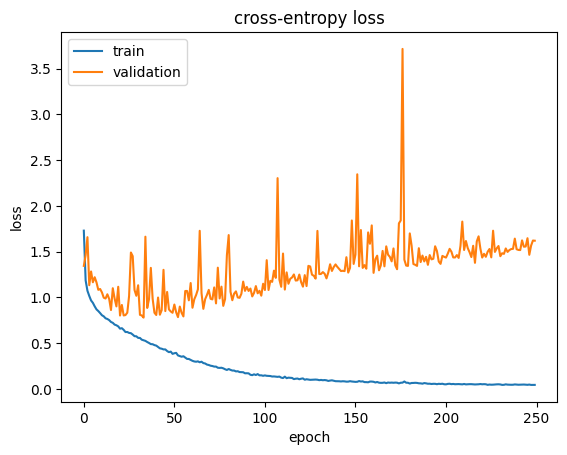

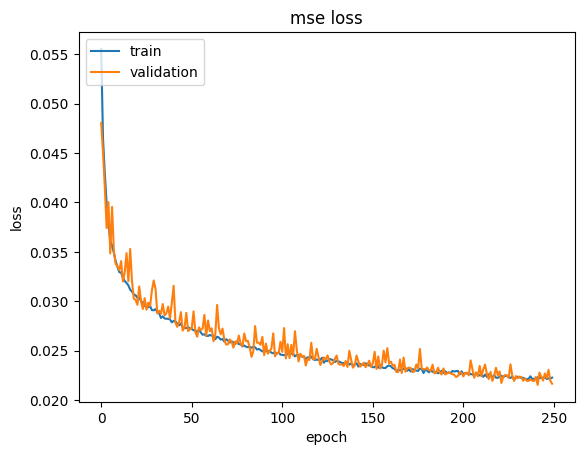

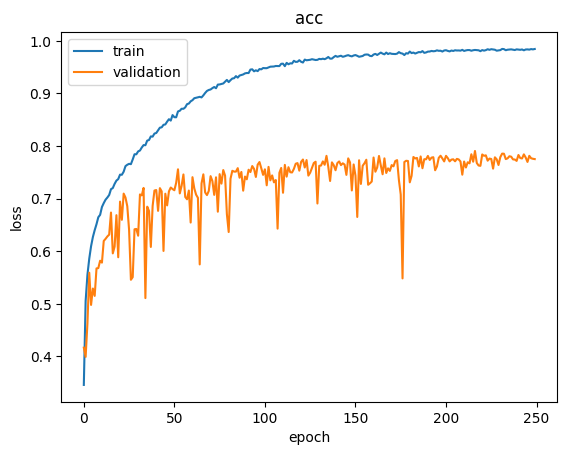

ce_acc:  0.7752000093460083
mse_loss:  0.022265512496232986
157/157 [==============================] - 1s 3ms/step - loss: 1.4761 - CE_loss: 1.4761 - mse_loss: 0.0307 - CE_accuracy: 0.6524 - mse_root_mean_squared_error: 0.1752
0.6355999708175659
[[0.71259999 0.77139997 0.80320001 0.80019999 0.82560003]
 [0.764      0.81059998 0.79699999 0.79299998 0.77179998]
 [0.55739999 0.67699999 0.69080001 0.6178     0.65240002]]
current overlap is:  3
lambda:  0


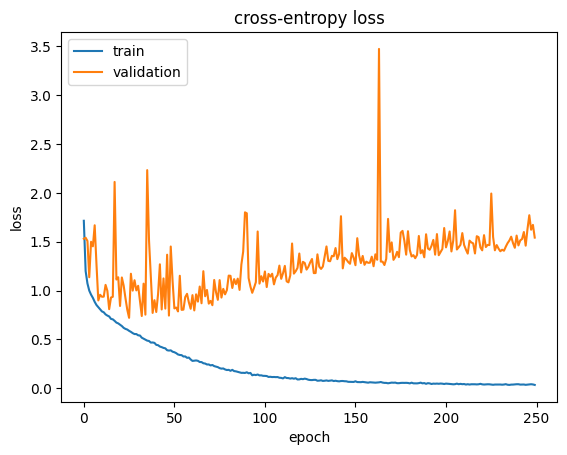

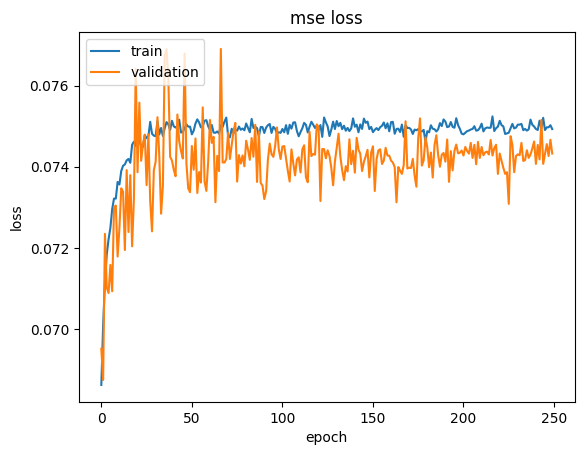

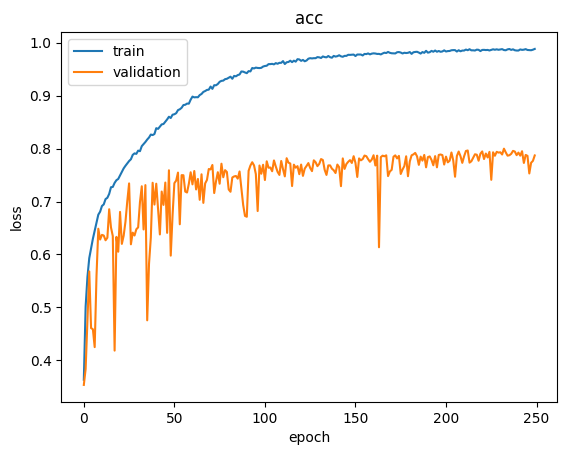

ce_acc:  0.7870000004768372
mse_loss:  0.07492797076702118
157/157 [==============================] - 0s 3ms/step - loss: 1.4755 - CE_loss: 1.4755 - mse_loss: 0.0737 - CE_accuracy: 0.6282 - mse_root_mean_squared_error: 0.2715
0.6327999830245972
lambda:  1


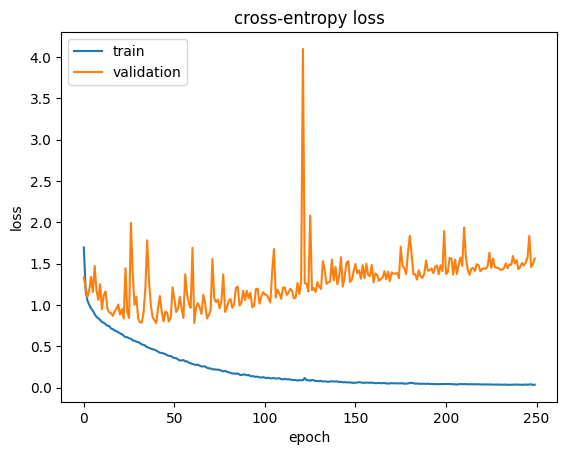

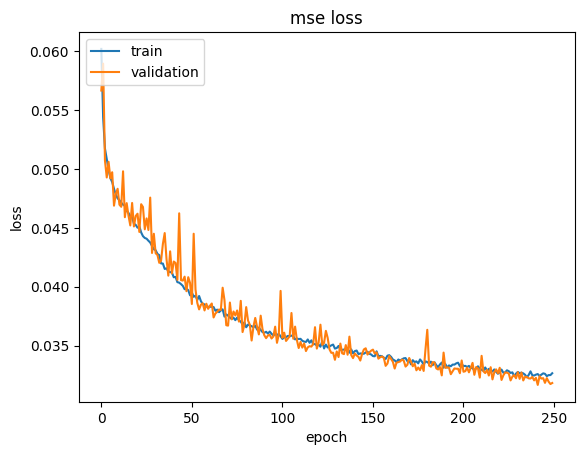

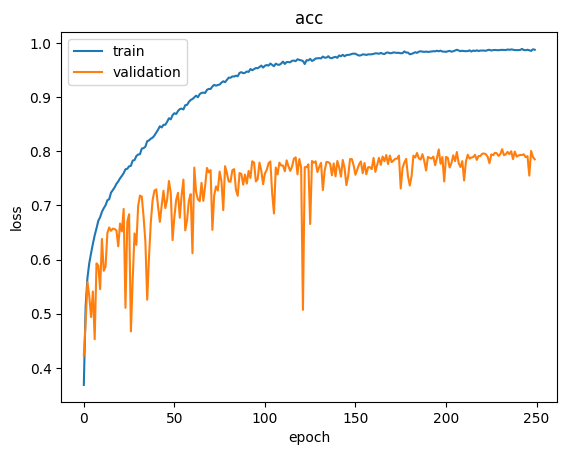

ce_acc:  0.7850000262260437
mse_loss:  0.03266039863228798
157/157 [==============================] - 1s 5ms/step - loss: 1.6678 - CE_loss: 1.6678 - mse_loss: 0.0343 - CE_accuracy: 0.5852 - mse_root_mean_squared_error: 0.1853
0.5914000272750854
lambda:  2


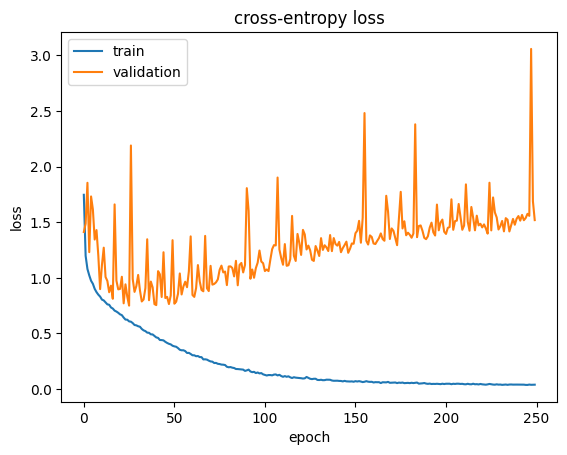

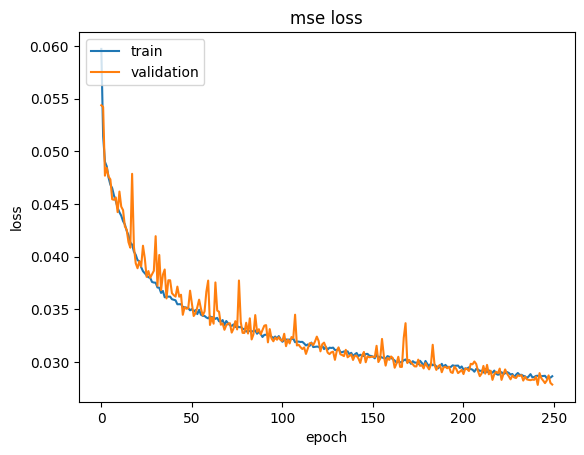

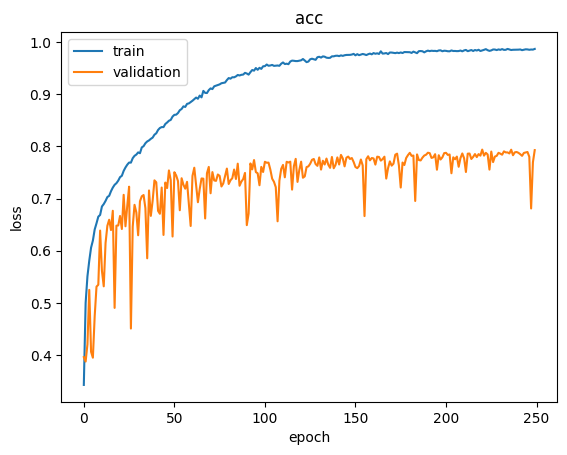

ce_acc:  0.7929999828338623
mse_loss:  0.02866283990442753
157/157 [==============================] - 1s 4ms/step - loss: 1.3200 - CE_loss: 1.3200 - mse_loss: 0.0330 - CE_accuracy: 0.6452 - mse_root_mean_squared_error: 0.1817
0.6633999943733215
lambda:  5


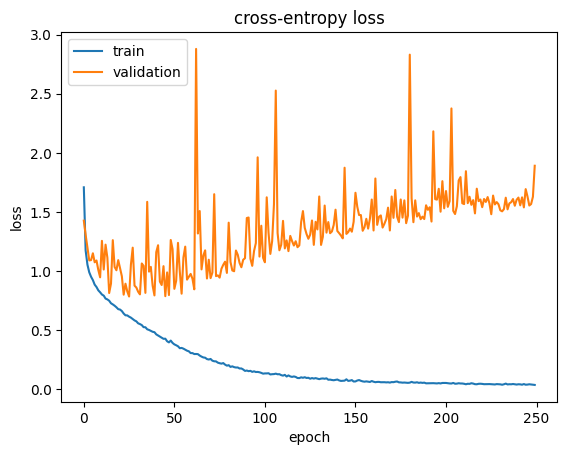

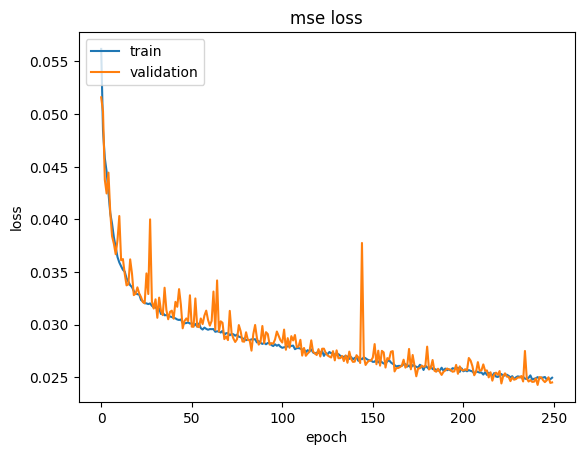

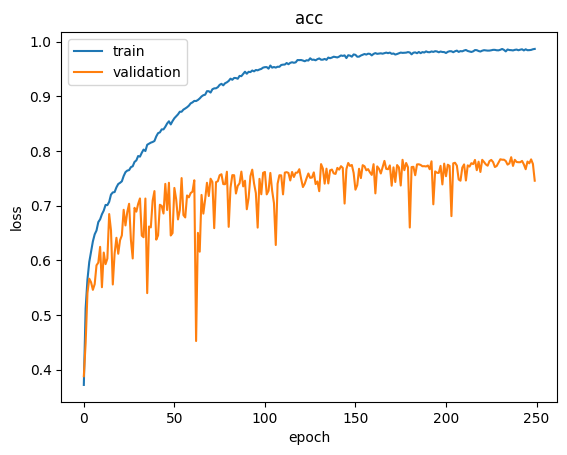

ce_acc:  0.7458000183105469
mse_loss:  0.02497337944805622
157/157 [==============================] - 1s 3ms/step - loss: 1.6277 - CE_loss: 1.6277 - mse_loss: 0.0291 - CE_accuracy: 0.5950 - mse_root_mean_squared_error: 0.1705
0.6011999845504761
lambda:  10


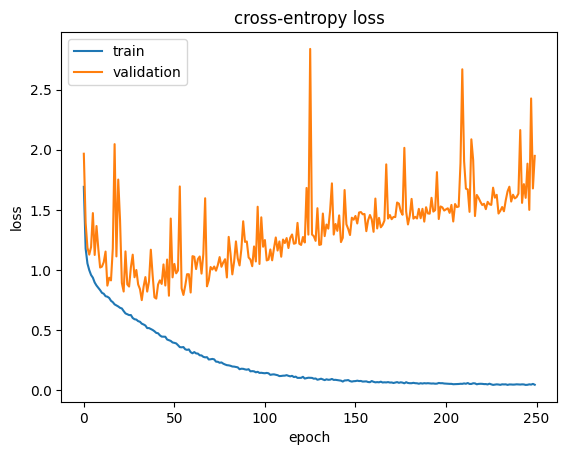

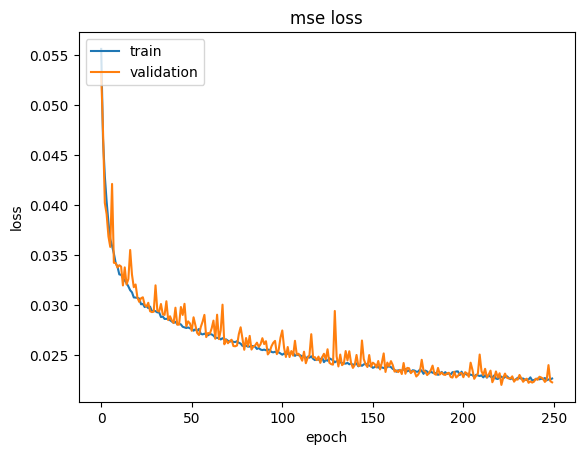

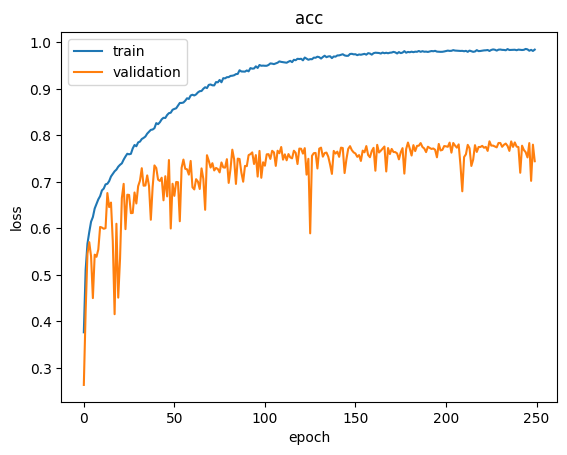

ce_acc:  0.7444000244140625
mse_loss:  0.022628892213106155
157/157 [==============================] - 0s 3ms/step - loss: 1.7438 - CE_loss: 1.7438 - mse_loss: 0.0283 - CE_accuracy: 0.5824 - mse_root_mean_squared_error: 0.1681
0.5838000178337097
[[0.71259999 0.77139997 0.80320001 0.80019999 0.82560003]
 [0.764      0.81059998 0.79699999 0.79299998 0.77179998]
 [0.55739999 0.67699999 0.69080001 0.6178     0.65240002]
 [0.62819999 0.58520001 0.64520001 0.59500003 0.58240002]]
current overlap is:  4
lambda:  0


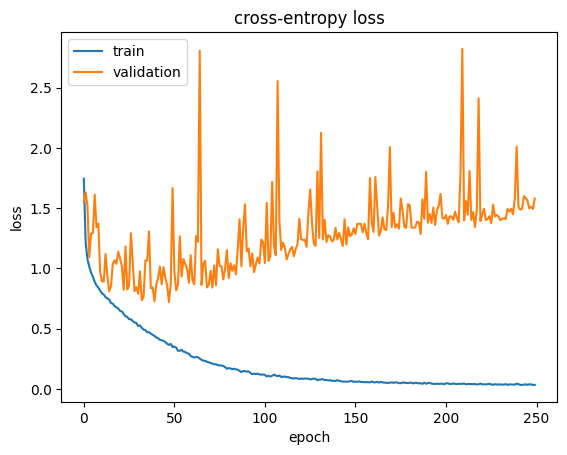

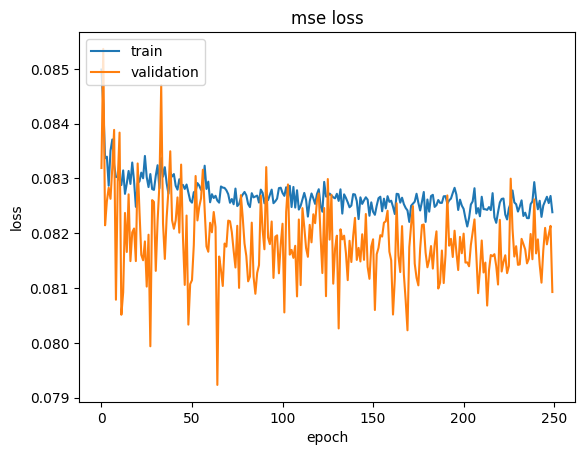

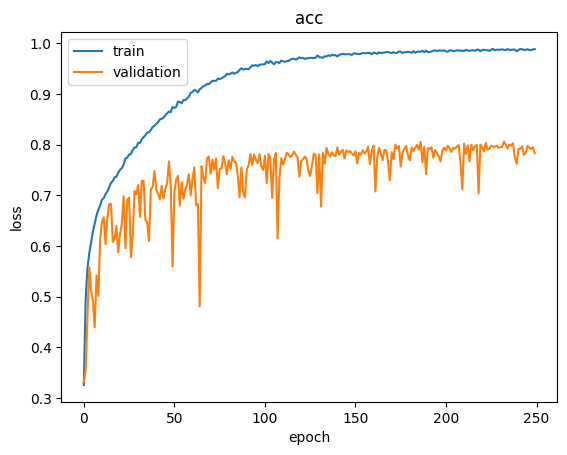

ce_acc:  0.7829999923706055
mse_loss:  0.08238271623849869
157/157 [==============================] - 0s 3ms/step - loss: 1.3813 - CE_loss: 1.3813 - mse_loss: 0.0827 - CE_accuracy: 0.6644 - mse_root_mean_squared_error: 0.2875
0.6722000241279602
lambda:  1


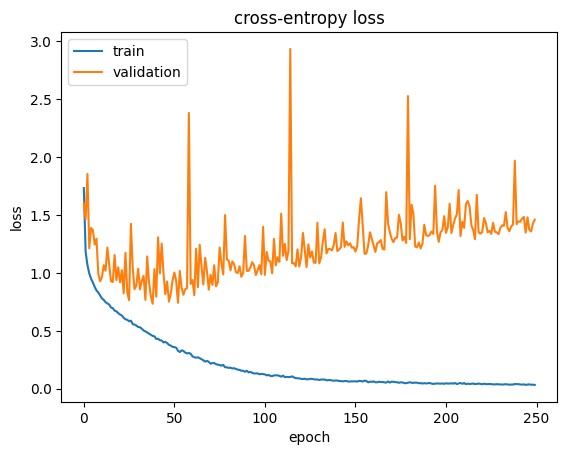

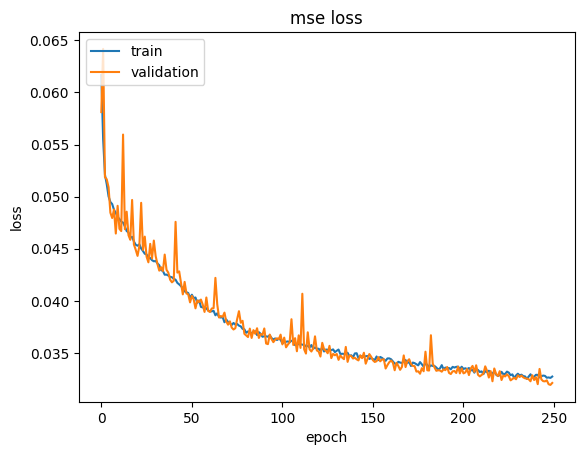

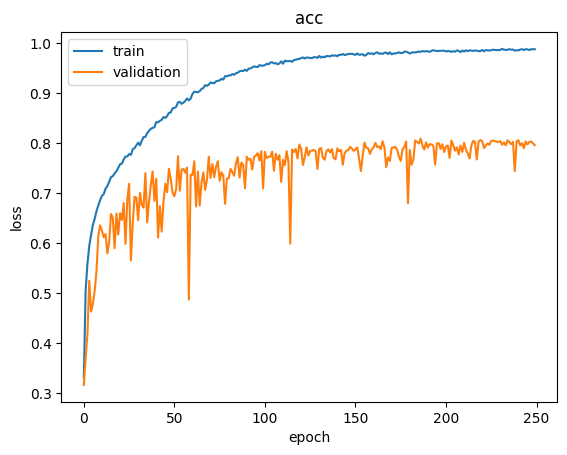

ce_acc:  0.7961999773979187
mse_loss:  0.032733768224716187
157/157 [==============================] - 0s 3ms/step - loss: 1.1326 - CE_loss: 1.1326 - mse_loss: 0.0384 - CE_accuracy: 0.6938 - mse_root_mean_squared_error: 0.1961
0.7059999704360962
lambda:  2


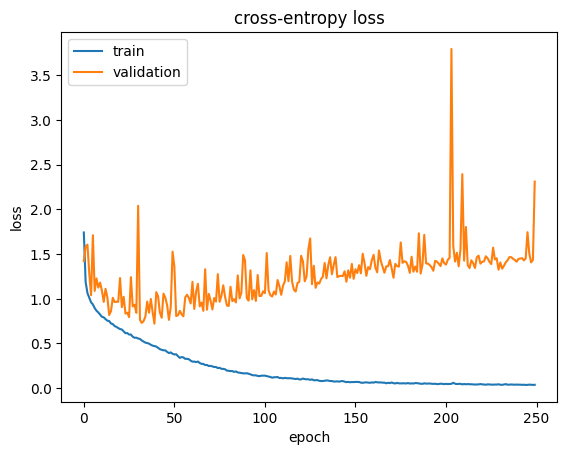

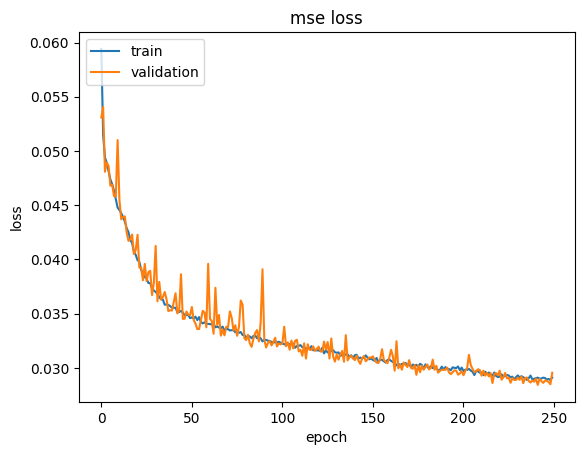

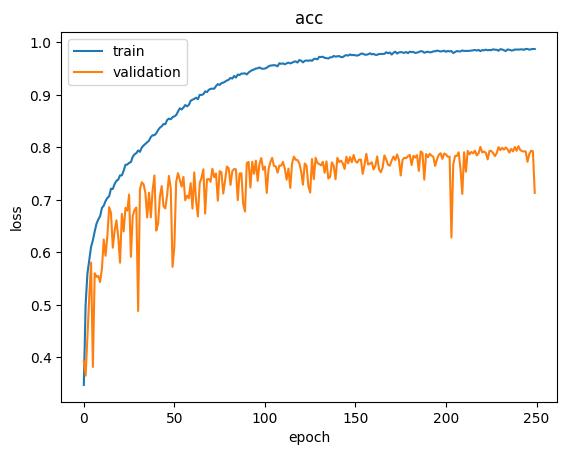

ce_acc:  0.7134000062942505
mse_loss:  0.029105519875884056
157/157 [==============================] - 0s 3ms/step - loss: 1.5793 - CE_loss: 1.5793 - mse_loss: 0.0357 - CE_accuracy: 0.6504 - mse_root_mean_squared_error: 0.1890
0.6570000052452087
lambda:  5


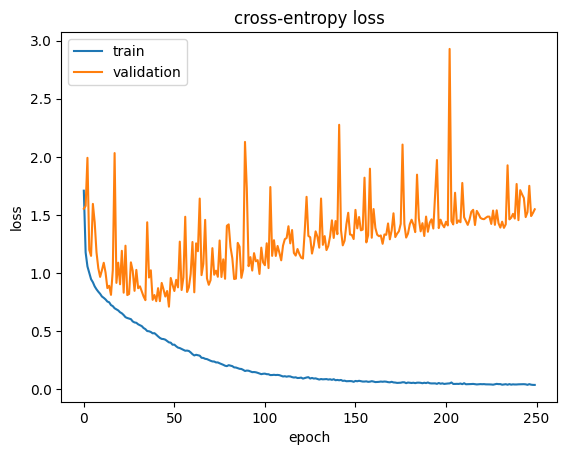

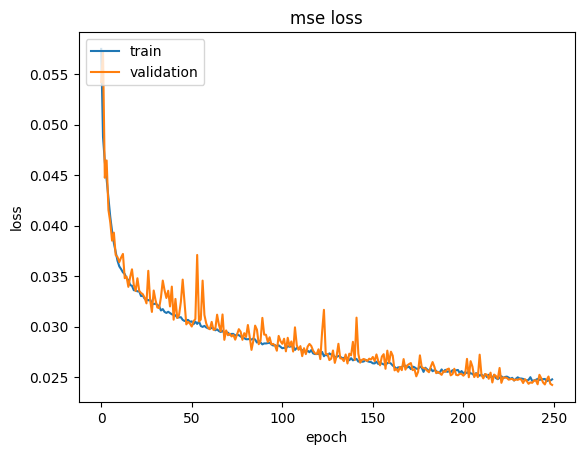

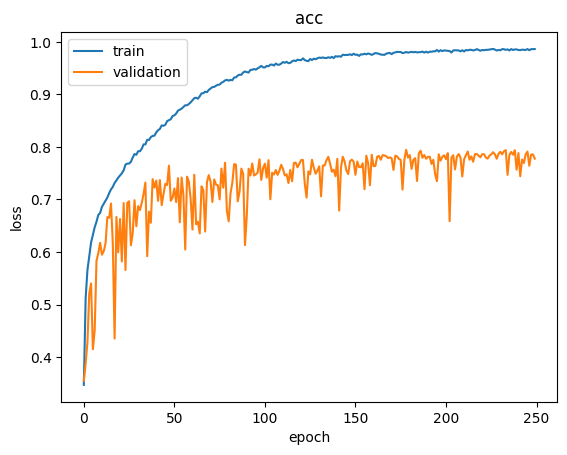

ce_acc:  0.7778000235557556
mse_loss:  0.024784060195088387
157/157 [==============================] - 0s 3ms/step - loss: 1.2682 - CE_loss: 1.2682 - mse_loss: 0.0315 - CE_accuracy: 0.6778 - mse_root_mean_squared_error: 0.1775
0.6686000227928162
lambda:  10


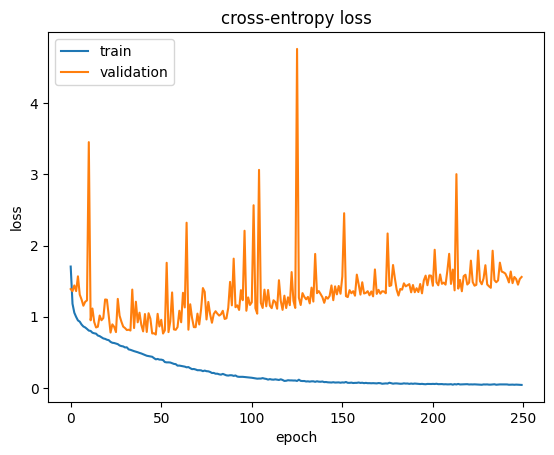

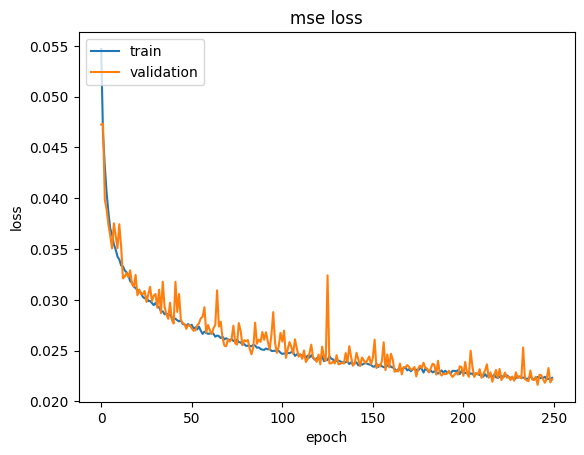

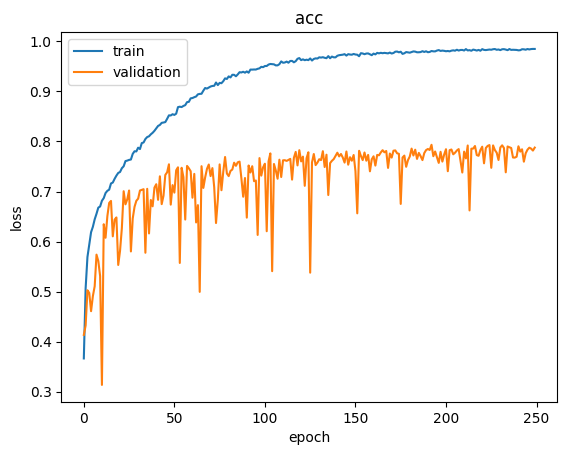

ce_acc:  0.7878000140190125
mse_loss:  0.022311437875032425
157/157 [==============================] - 0s 3ms/step - loss: 1.2329 - CE_loss: 1.2329 - mse_loss: 0.0315 - CE_accuracy: 0.6682 - mse_root_mean_squared_error: 0.1774
0.6747999787330627
[[0.71259999 0.77139997 0.80320001 0.80019999 0.82560003]
 [0.764      0.81059998 0.79699999 0.79299998 0.77179998]
 [0.55739999 0.67699999 0.69080001 0.6178     0.65240002]
 [0.62819999 0.58520001 0.64520001 0.59500003 0.58240002]
 [0.66439998 0.69379997 0.65039998 0.6778     0.66820002]]
current overlap is:  5
lambda:  0


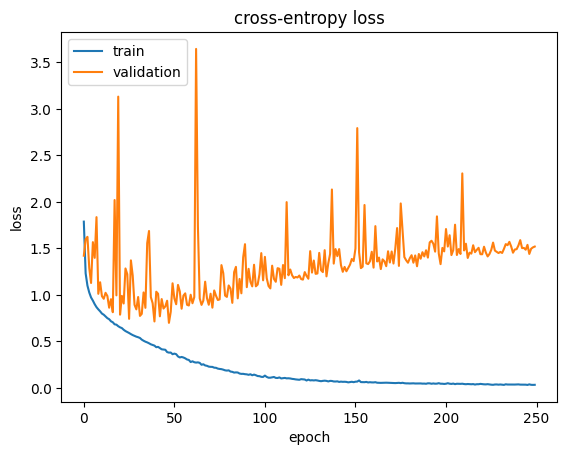

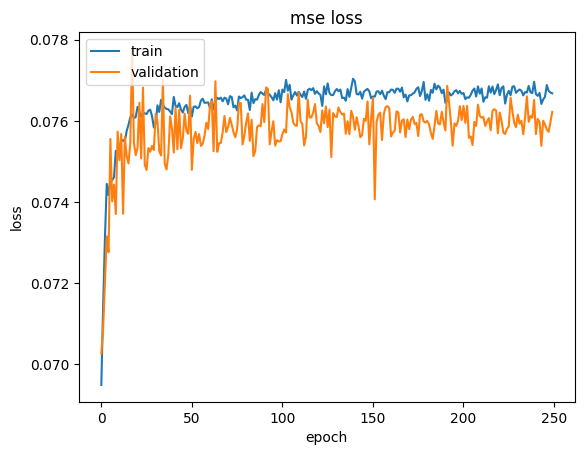

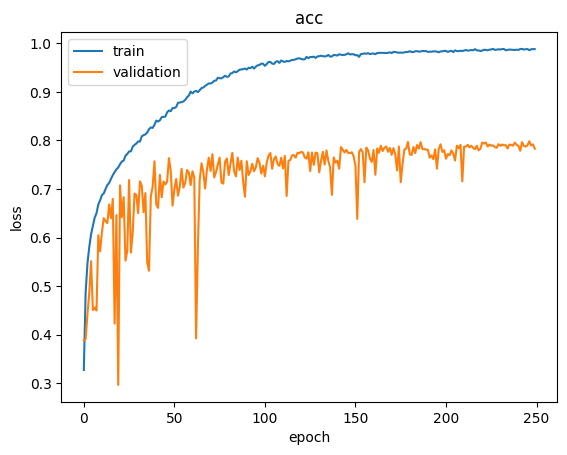

ce_acc:  0.7832000255584717
mse_loss:  0.07667622715234756
157/157 [==============================] - 0s 3ms/step - loss: 0.9133 - CE_loss: 0.9133 - mse_loss: 0.0760 - CE_accuracy: 0.7498 - mse_root_mean_squared_error: 0.2756
0.7653999924659729
lambda:  1


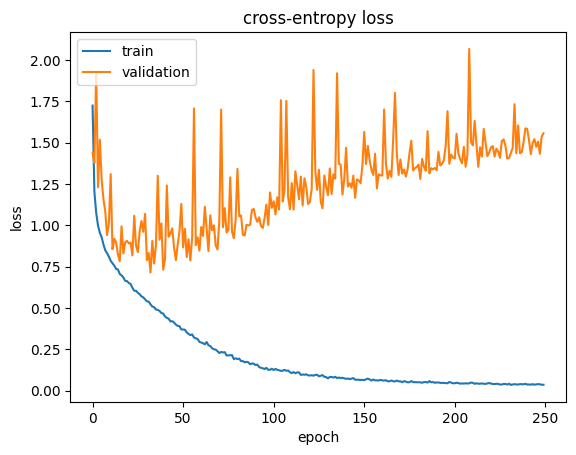

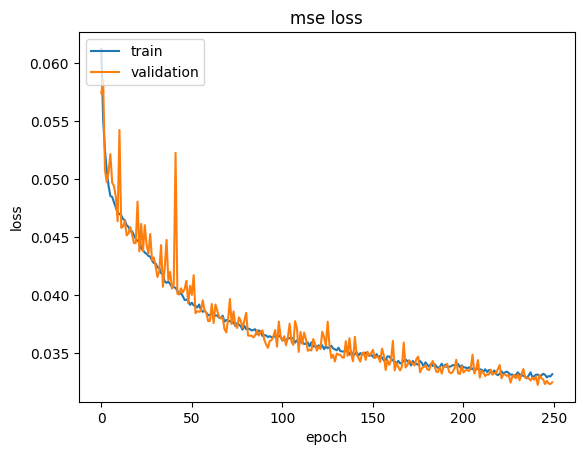

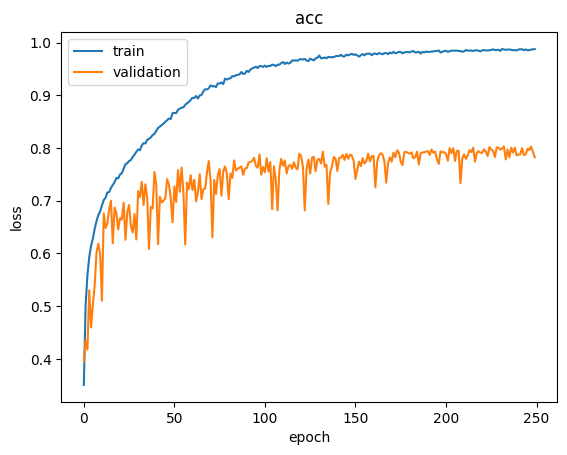

ce_acc:  0.782800018787384
mse_loss:  0.03321632742881775
157/157 [==============================] - 1s 3ms/step - loss: 0.9237 - CE_loss: 0.9237 - mse_loss: 0.0450 - CE_accuracy: 0.7536 - mse_root_mean_squared_error: 0.2121
0.7699999809265137
lambda:  2


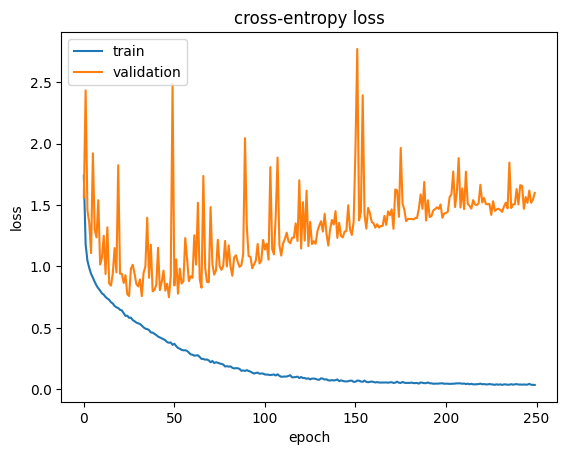

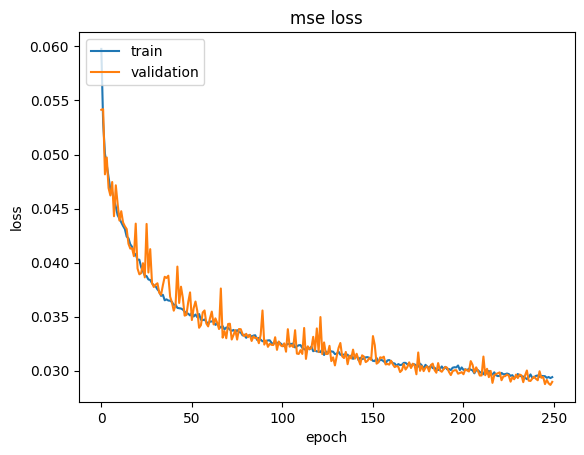

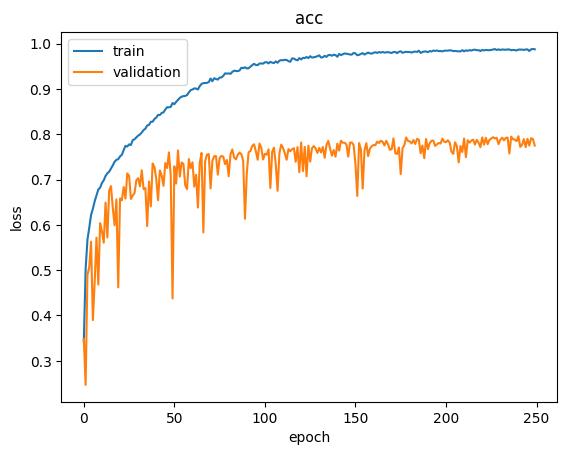

ce_acc:  0.7749999761581421
mse_loss:  0.029407693073153496
157/157 [==============================] - 0s 3ms/step - loss: 0.9011 - CE_loss: 0.9011 - mse_loss: 0.0372 - CE_accuracy: 0.7682 - mse_root_mean_squared_error: 0.1929
0.7692000269889832
lambda:  5


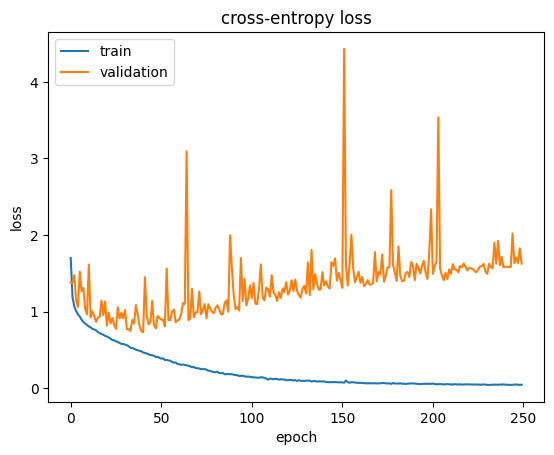

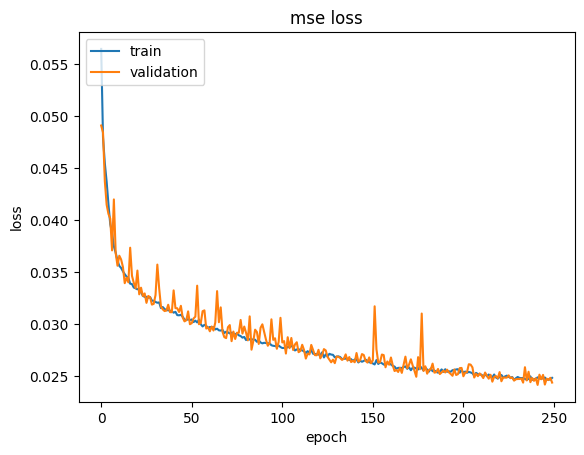

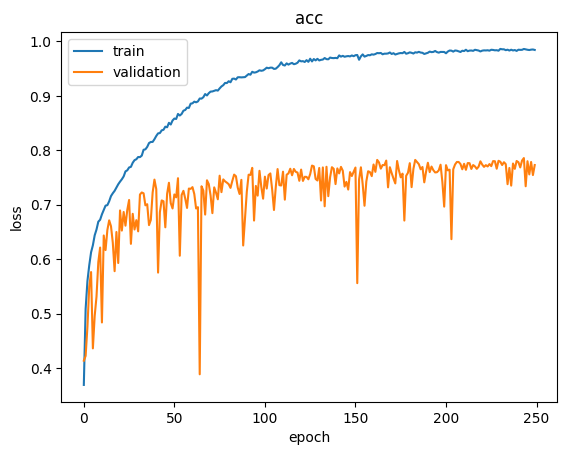

ce_acc:  0.7730000019073486
mse_loss:  0.02483905851840973
157/157 [==============================] - 1s 3ms/step - loss: 0.9326 - CE_loss: 0.9326 - mse_loss: 0.0348 - CE_accuracy: 0.7442 - mse_root_mean_squared_error: 0.1865
0.7608000040054321
lambda:  10


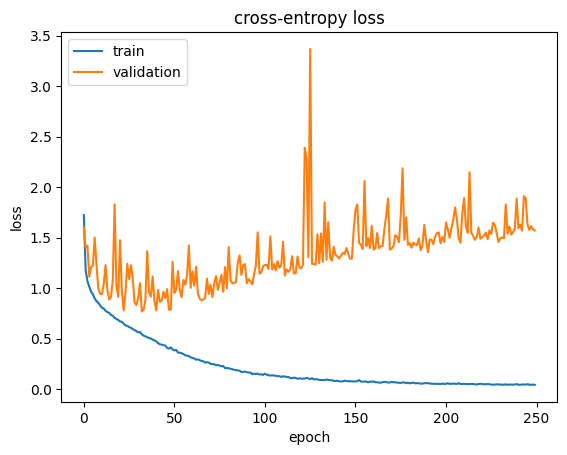

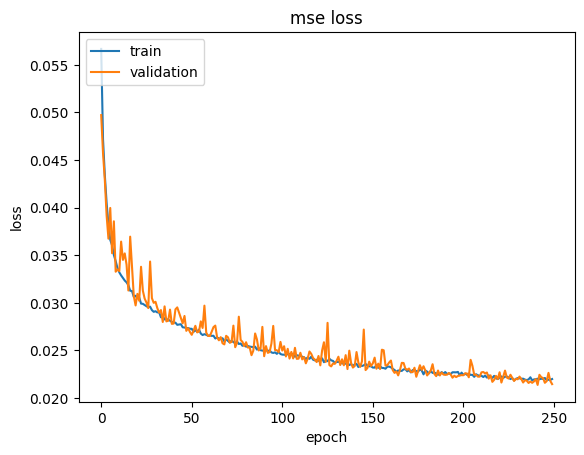

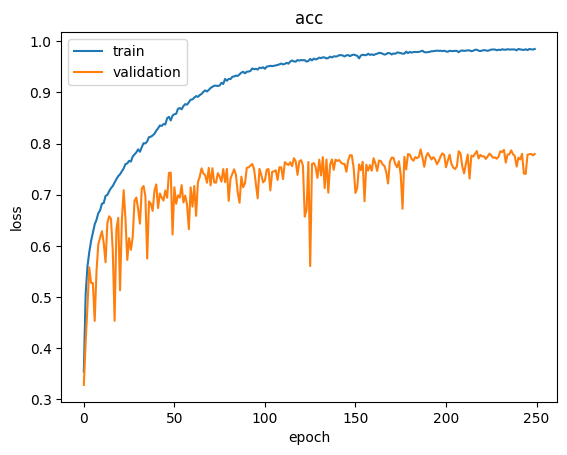

ce_acc:  0.7796000242233276
mse_loss:  0.02199573814868927
157/157 [==============================] - 1s 3ms/step - loss: 0.9465 - CE_loss: 0.9465 - mse_loss: 0.0304 - CE_accuracy: 0.7528 - mse_root_mean_squared_error: 0.1745
0.7573999762535095
[[0.71259999 0.77139997 0.80320001 0.80019999 0.82560003]
 [0.764      0.81059998 0.79699999 0.79299998 0.77179998]
 [0.55739999 0.67699999 0.69080001 0.6178     0.65240002]
 [0.62819999 0.58520001 0.64520001 0.59500003 0.58240002]
 [0.66439998 0.69379997 0.65039998 0.6778     0.66820002]
 [0.74980003 0.7536     0.76819998 0.74419999 0.75279999]]


In [100]:
key_list = ['loss', 'CE_loss', 'mse_loss', 'CE_accuracy', 'mse']

lambda_list = [0,1,2,5,10]


results_list = {key: [] for key in key_list}
for i in range(6):

    print("current overlap is: ", (i) )
    acc_list = [] 
    LABEL_SECOND_HALF = label2_list[5-i]
    for lambda_val in lambda_list:
        print("lambda: ", lambda_val)
        train_first_stage(lambda_val,results_list,LABEL_SECOND_HALF)
    print(np.array(results_list['CE_accuracy']).reshape(-1,5))


In [101]:
np.array(results_list['CE_accuracy']).reshape(-1,5)

array([[0.71259999, 0.77139997, 0.80320001, 0.80019999, 0.82560003],
       [0.764     , 0.81059998, 0.79699999, 0.79299998, 0.77179998],
       [0.55739999, 0.67699999, 0.69080001, 0.6178    , 0.65240002],
       [0.62819999, 0.58520001, 0.64520001, 0.59500003, 0.58240002],
       [0.66439998, 0.69379997, 0.65039998, 0.6778    , 0.66820002],
       [0.74980003, 0.7536    , 0.76819998, 0.74419999, 0.75279999]])

In [96]:
np.array(results_list['CE_accuracy']).reshape(-1,5)

array([[0.83999997, 0.81519997, 0.72759998, 0.79299998, 0.81480002],
       [0.76880002, 0.78619999, 0.76179999, 0.78539997, 0.80040002],
       [0.70200002, 0.66720003, 0.68339998, 0.69580001, 0.67500001],
       [0.5848    , 0.62220001, 0.60460001, 0.61040002, 0.58340001],
       [0.70120001, 0.70020002, 0.69559997, 0.67299998, 0.68599999],
       [0.70639998, 0.76200002, 0.7482    , 0.73940003, 0.73379999]])

current overlap is:  0
lambda:  0


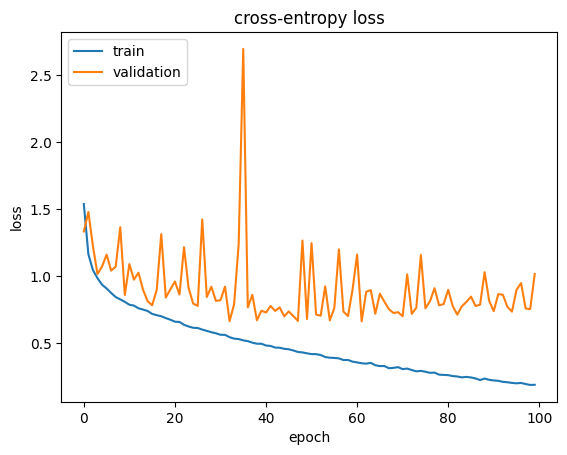

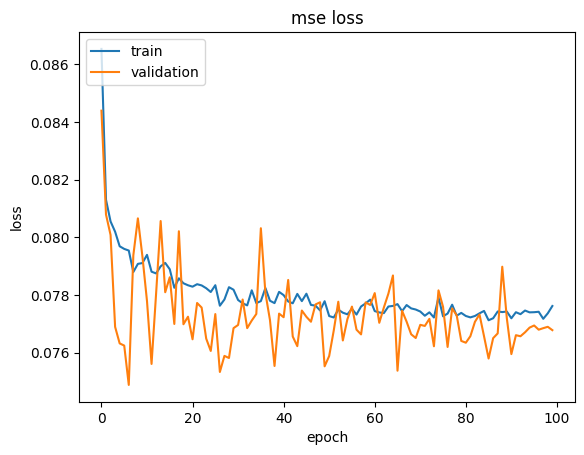

157/157 [==============================] - 0s 3ms/step - loss: 0.6635 - CE_loss: 0.6635 - mse_loss: 0.0789 - CE_accuracy: 0.8546 - mse_root_mean_squared_error: 0.2808
0.8587999939918518
lambda:  1


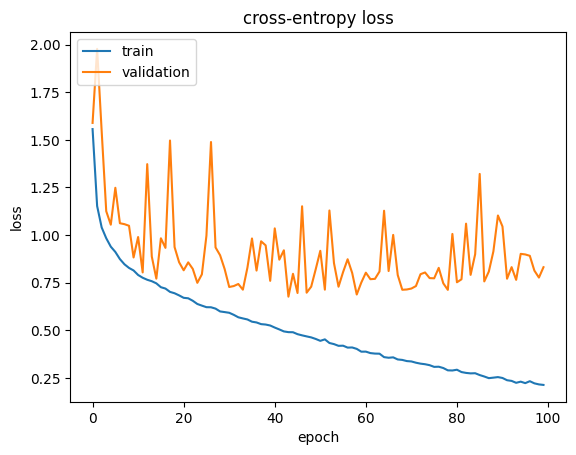

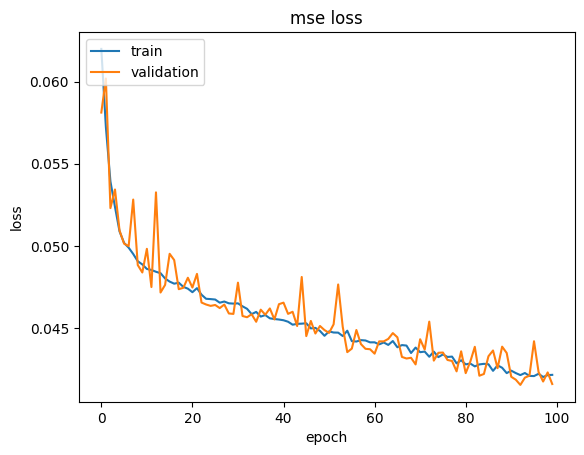

157/157 [==============================] - 0s 3ms/step - loss: 1.1814 - CE_loss: 1.1814 - mse_loss: 0.0533 - CE_accuracy: 0.7634 - mse_root_mean_squared_error: 0.2308
0.7710000276565552
lambda:  2


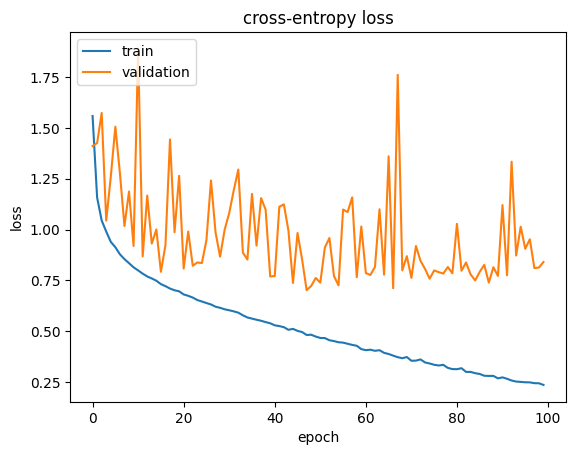

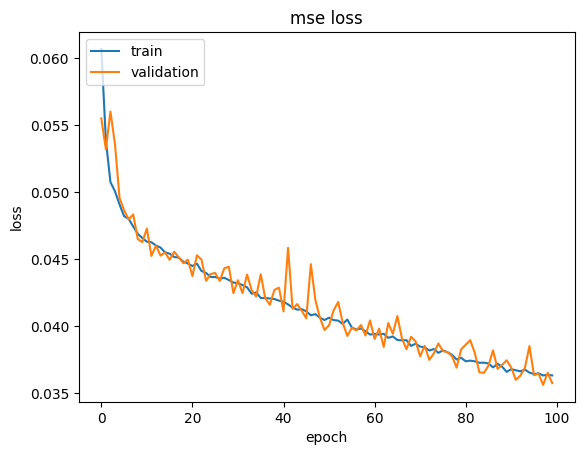

157/157 [==============================] - 1s 3ms/step - loss: 0.9043 - CE_loss: 0.9043 - mse_loss: 0.0489 - CE_accuracy: 0.8274 - mse_root_mean_squared_error: 0.2212
0.8263999819755554
lambda:  5


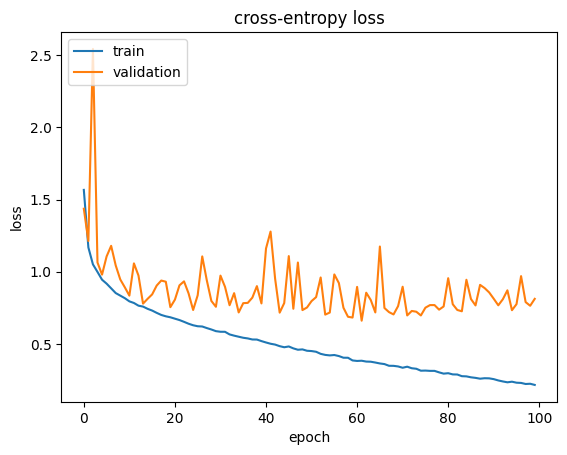

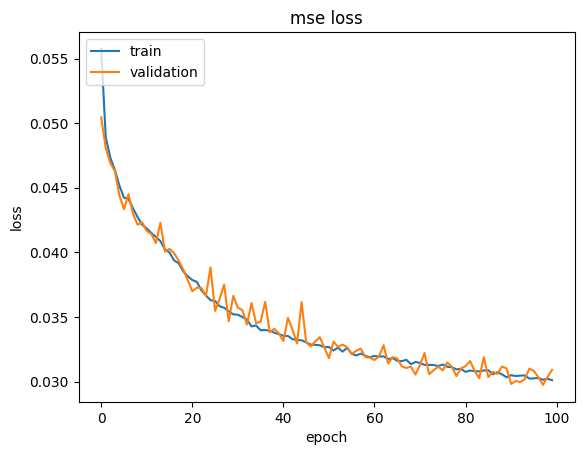

157/157 [==============================] - 1s 3ms/step - loss: 1.4657 - CE_loss: 1.4657 - mse_loss: 0.0445 - CE_accuracy: 0.7690 - mse_root_mean_squared_error: 0.2110
0.7698000073432922
lambda:  10


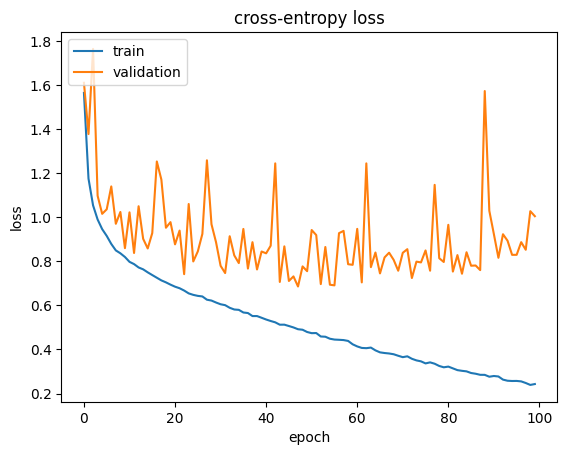

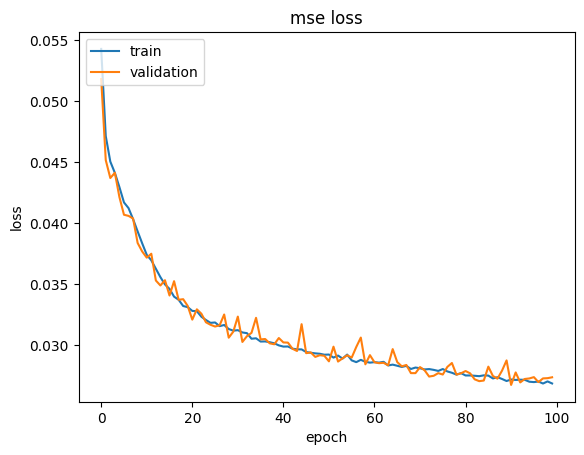

157/157 [==============================] - 0s 3ms/step - loss: 0.4851 - CE_loss: 0.4851 - mse_loss: 0.0436 - CE_accuracy: 0.8866 - mse_root_mean_squared_error: 0.2088
0.8809999823570251
[[0.85460001 0.76340002 0.82740003 0.76899999 0.88660002]]
current overlap is:  1
lambda:  0


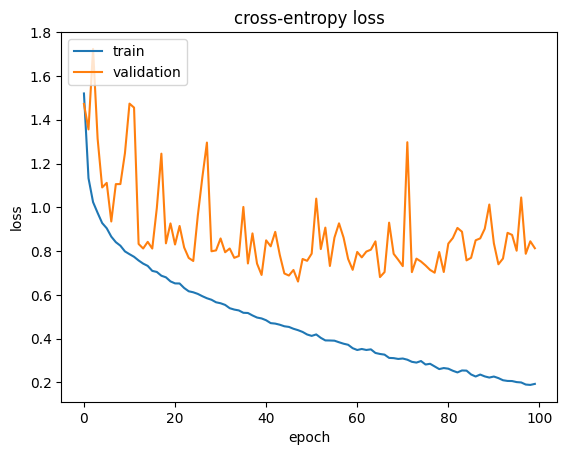

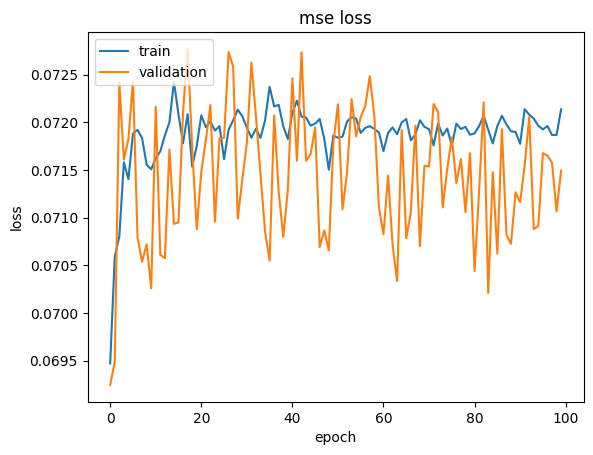

157/157 [==============================] - 1s 3ms/step - loss: 0.8195 - CE_loss: 0.8195 - mse_loss: 0.0689 - CE_accuracy: 0.8094 - mse_root_mean_squared_error: 0.2626
0.8185999989509583
lambda:  1


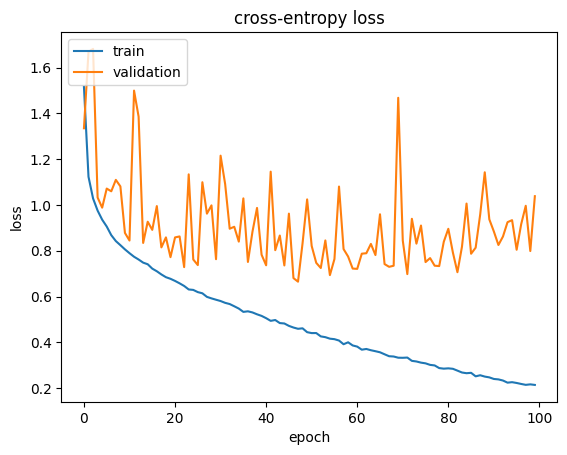

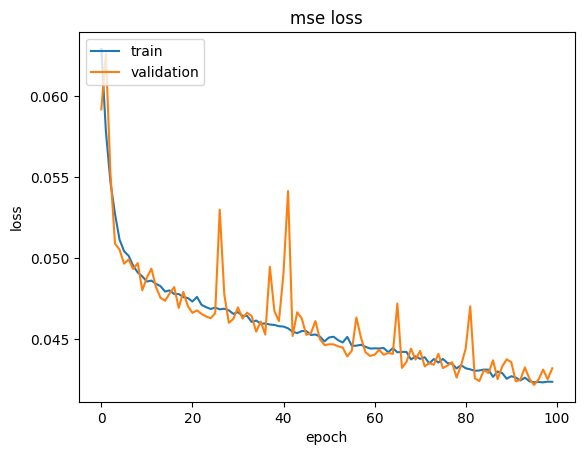

157/157 [==============================] - 1s 4ms/step - loss: 0.7042 - CE_loss: 0.7042 - mse_loss: 0.0487 - CE_accuracy: 0.8322 - mse_root_mean_squared_error: 0.2207
0.8348000049591064
lambda:  2


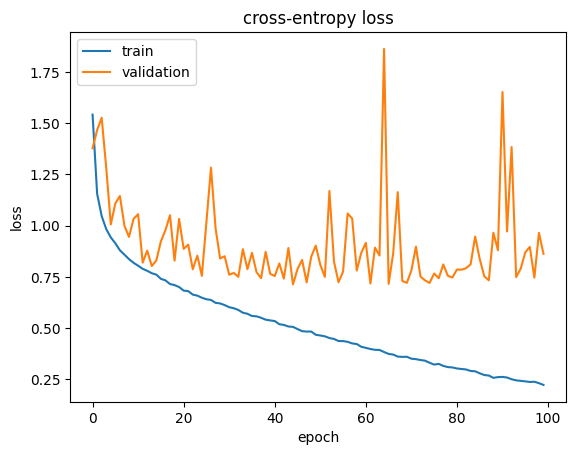

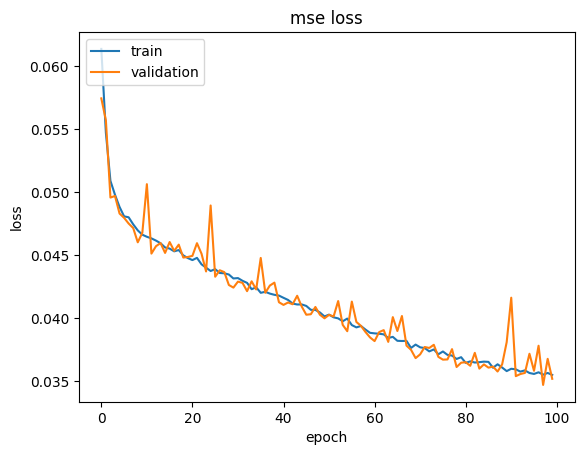

157/157 [==============================] - 1s 3ms/step - loss: 0.7258 - CE_loss: 0.7258 - mse_loss: 0.0429 - CE_accuracy: 0.8254 - mse_root_mean_squared_error: 0.2072
0.8393999934196472
lambda:  5


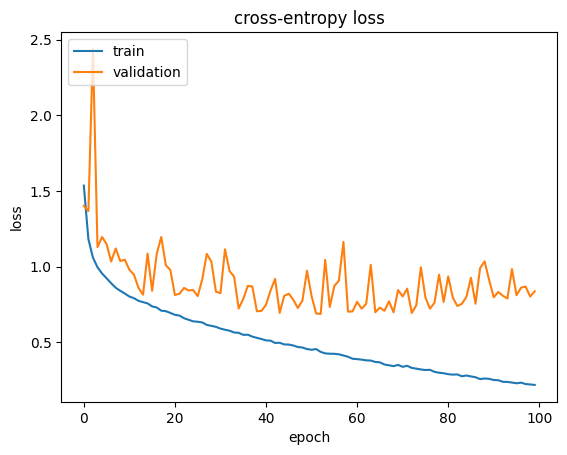

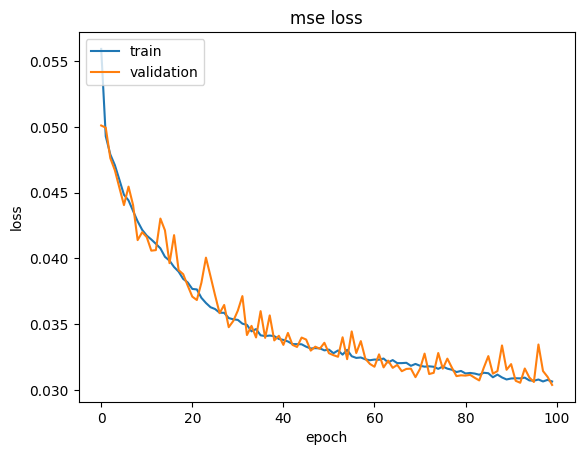

157/157 [==============================] - 0s 3ms/step - loss: 1.1943 - CE_loss: 1.1943 - mse_loss: 0.0398 - CE_accuracy: 0.7618 - mse_root_mean_squared_error: 0.1994
0.7635999917984009
lambda:  10


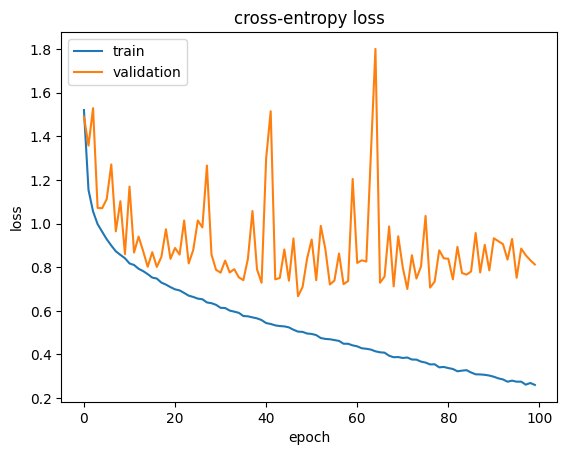

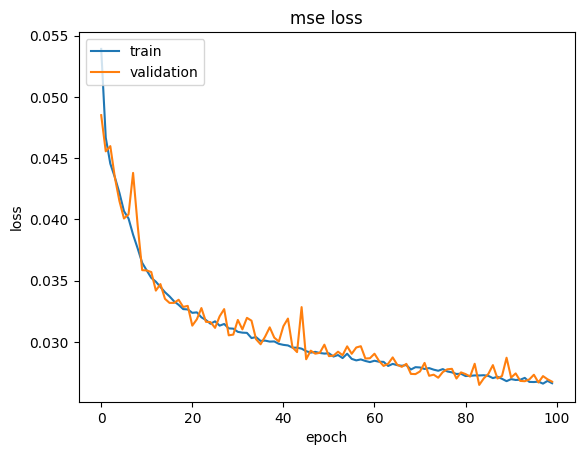

157/157 [==============================] - 1s 3ms/step - loss: 0.7042 - CE_loss: 0.7042 - mse_loss: 0.0351 - CE_accuracy: 0.8288 - mse_root_mean_squared_error: 0.1872
0.8299999833106995
[[0.85460001 0.76340002 0.82740003 0.76899999 0.88660002]
 [0.80940002 0.83219999 0.82539999 0.76179999 0.82880002]]
current overlap is:  2
lambda:  0


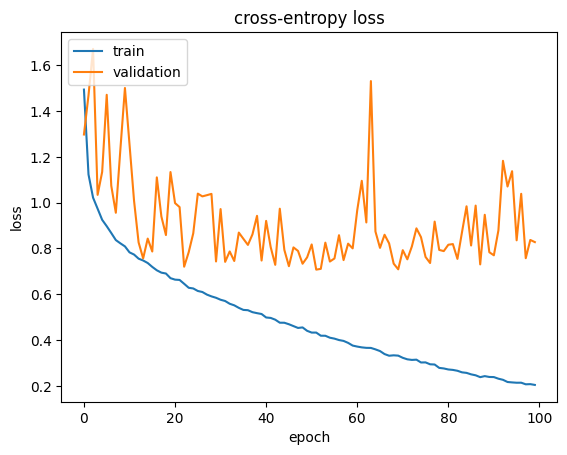

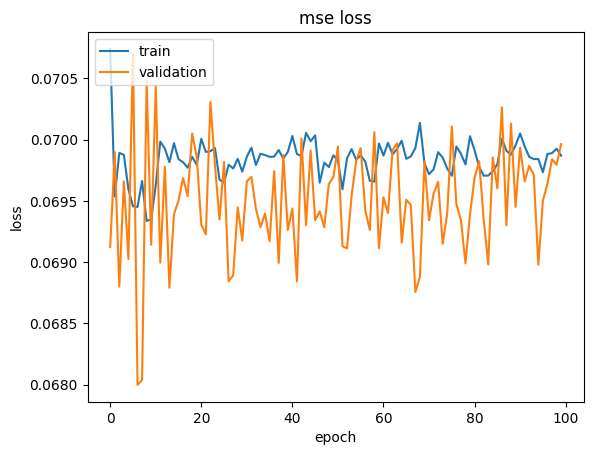

157/157 [==============================] - 0s 3ms/step - loss: 1.2793 - CE_loss: 1.2793 - mse_loss: 0.0667 - CE_accuracy: 0.7014 - mse_root_mean_squared_error: 0.2583
0.7024000287055969
lambda:  1


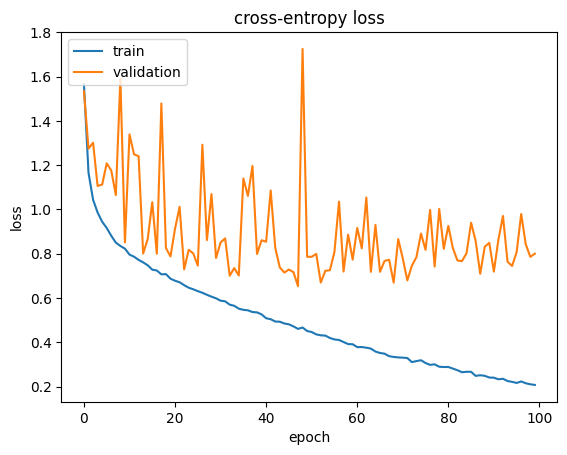

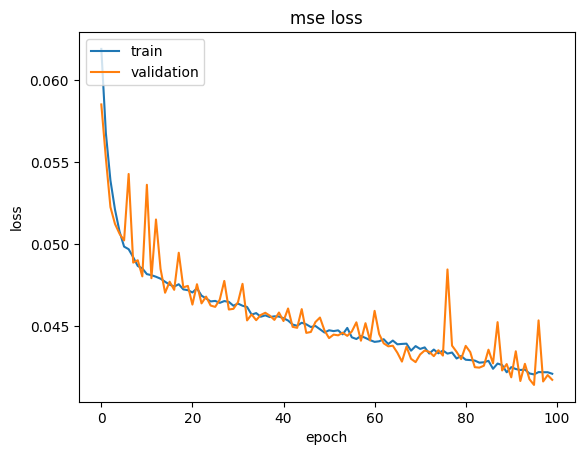

157/157 [==============================] - 0s 3ms/step - loss: 1.1439 - CE_loss: 1.1439 - mse_loss: 0.0475 - CE_accuracy: 0.7254 - mse_root_mean_squared_error: 0.2180
0.7271999716758728
lambda:  2


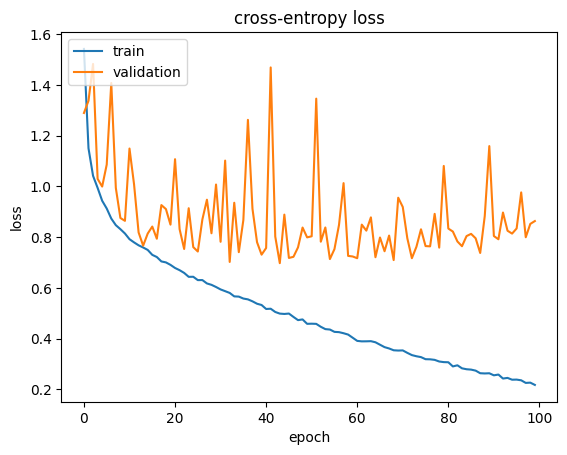

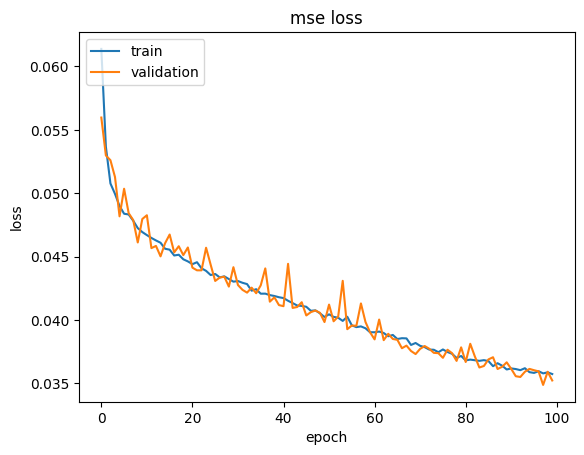

157/157 [==============================] - 0s 3ms/step - loss: 1.3700 - CE_loss: 1.3700 - mse_loss: 0.0416 - CE_accuracy: 0.6886 - mse_root_mean_squared_error: 0.2041
0.6922000050544739
lambda:  5


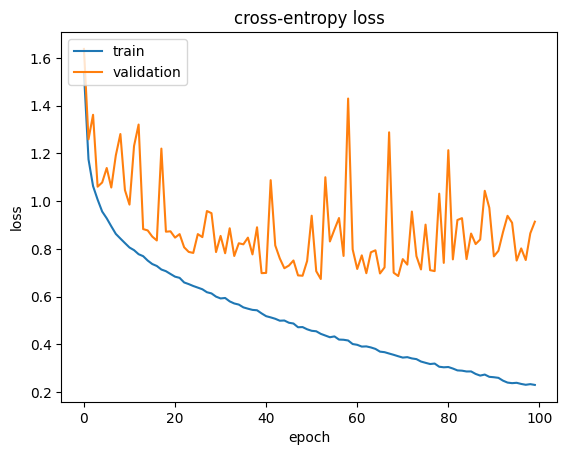

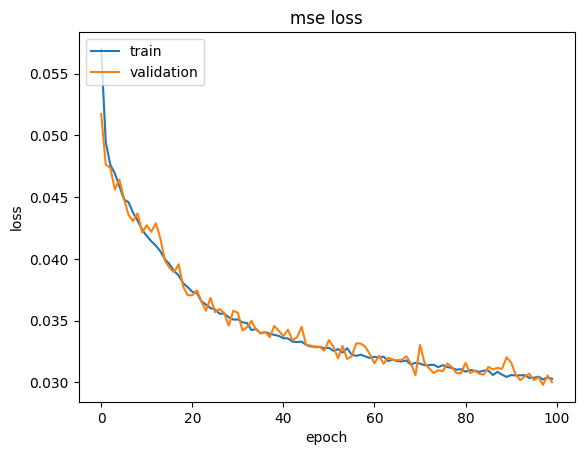

157/157 [==============================] - 1s 4ms/step - loss: 1.2335 - CE_loss: 1.2335 - mse_loss: 0.0390 - CE_accuracy: 0.7086 - mse_root_mean_squared_error: 0.1976
0.7077999711036682
lambda:  10


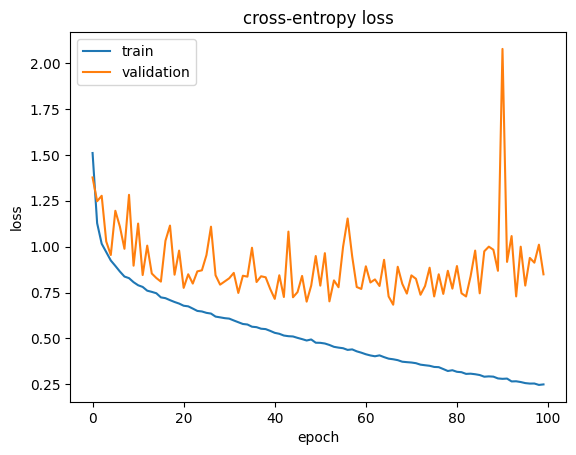

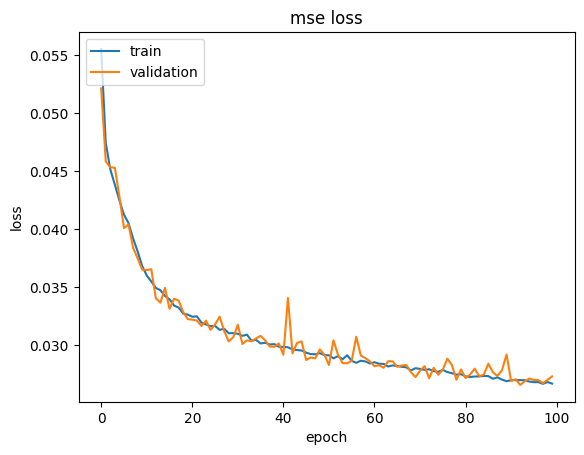

157/157 [==============================] - 1s 3ms/step - loss: 1.2715 - CE_loss: 1.2715 - mse_loss: 0.0341 - CE_accuracy: 0.7012 - mse_root_mean_squared_error: 0.1847
0.7049999833106995
[[0.85460001 0.76340002 0.82740003 0.76899999 0.88660002]
 [0.80940002 0.83219999 0.82539999 0.76179999 0.82880002]
 [0.70139998 0.72539997 0.6886     0.70859998 0.70120001]]
current overlap is:  3
lambda:  0


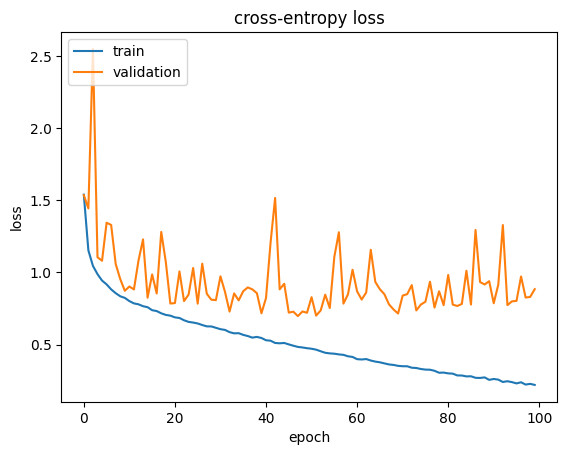

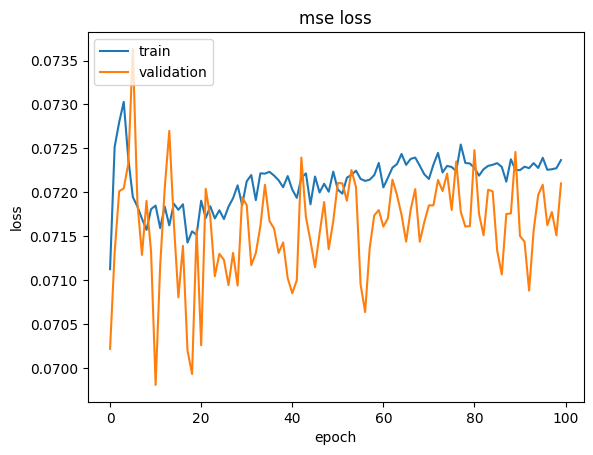

157/157 [==============================] - 1s 4ms/step - loss: 1.4452 - CE_loss: 1.4452 - mse_loss: 0.0674 - CE_accuracy: 0.6622 - mse_root_mean_squared_error: 0.2595
0.670799970626831
lambda:  1


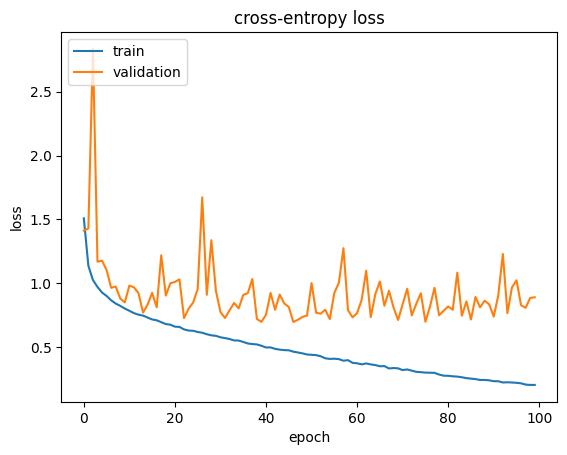

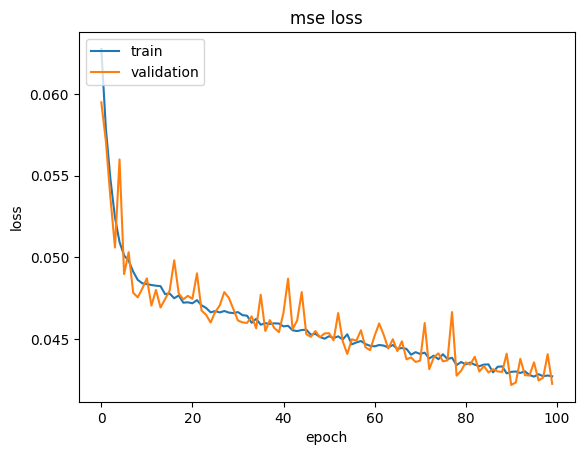

157/157 [==============================] - 0s 3ms/step - loss: 1.8169 - CE_loss: 1.8169 - mse_loss: 0.0461 - CE_accuracy: 0.6204 - mse_root_mean_squared_error: 0.2148
0.6227999925613403
lambda:  2


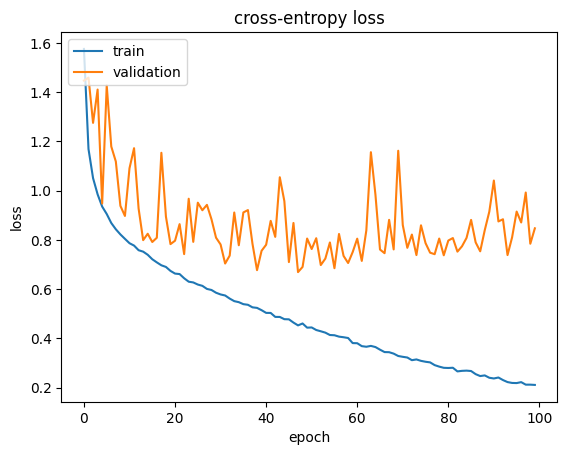

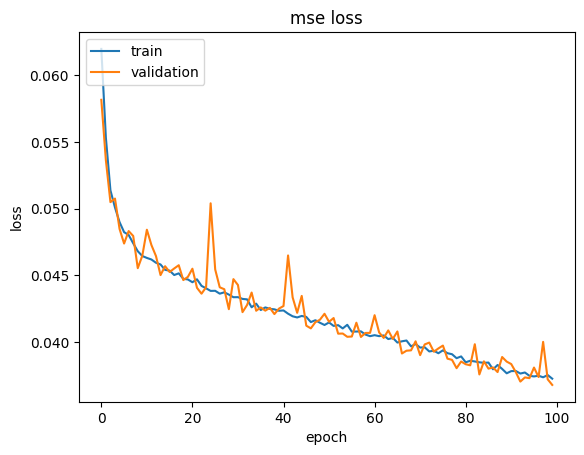

157/157 [==============================] - 1s 5ms/step - loss: 1.3031 - CE_loss: 1.3031 - mse_loss: 0.0416 - CE_accuracy: 0.6908 - mse_root_mean_squared_error: 0.2039
0.6972000002861023
lambda:  5


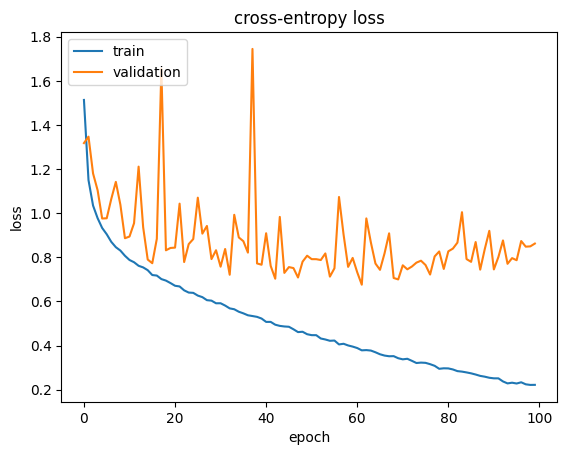

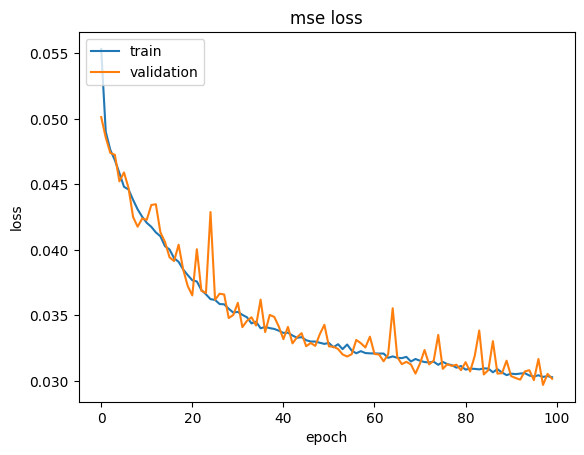

157/157 [==============================] - 0s 3ms/step - loss: 1.2829 - CE_loss: 1.2829 - mse_loss: 0.0355 - CE_accuracy: 0.6868 - mse_root_mean_squared_error: 0.1883
0.6901999711990356
lambda:  10


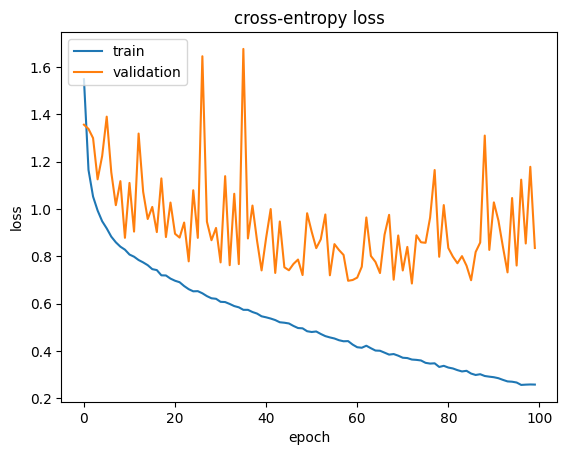

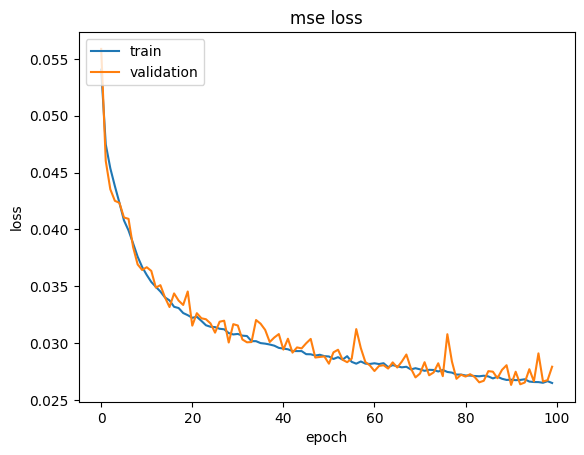

157/157 [==============================] - 0s 3ms/step - loss: 1.3035 - CE_loss: 1.3035 - mse_loss: 0.0353 - CE_accuracy: 0.6688 - mse_root_mean_squared_error: 0.1879
0.6660000085830688
[[0.85460001 0.76340002 0.82740003 0.76899999 0.88660002]
 [0.80940002 0.83219999 0.82539999 0.76179999 0.82880002]
 [0.70139998 0.72539997 0.6886     0.70859998 0.70120001]
 [0.66219997 0.62040001 0.69080001 0.6868     0.6688    ]]
current overlap is:  4
lambda:  0


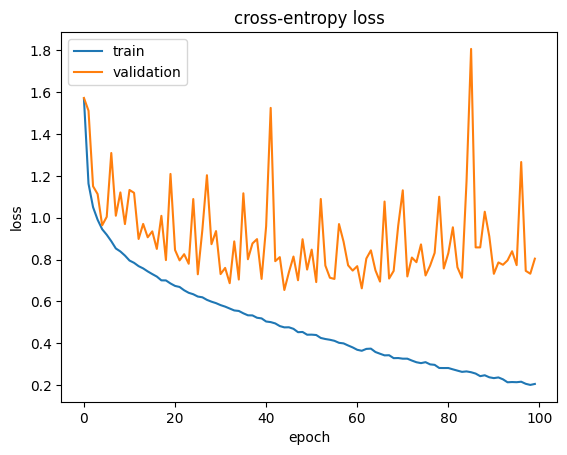

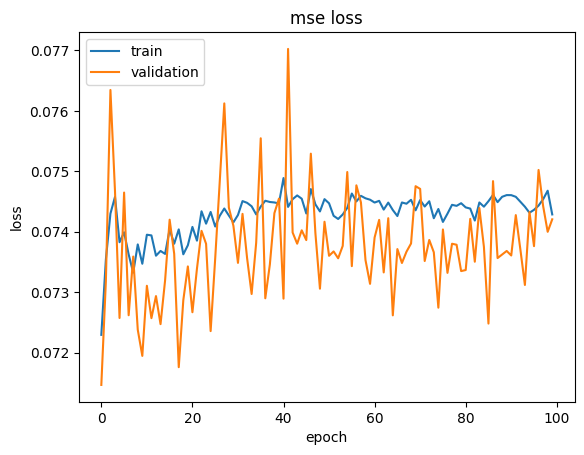

157/157 [==============================] - 0s 3ms/step - loss: 1.0682 - CE_loss: 1.0682 - mse_loss: 0.0748 - CE_accuracy: 0.7304 - mse_root_mean_squared_error: 0.2735
0.7347999811172485
lambda:  1


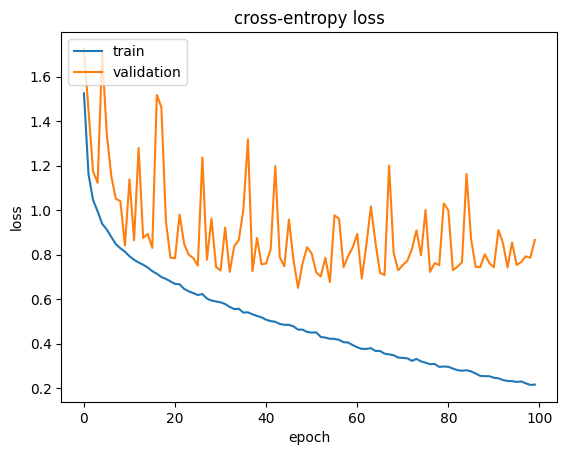

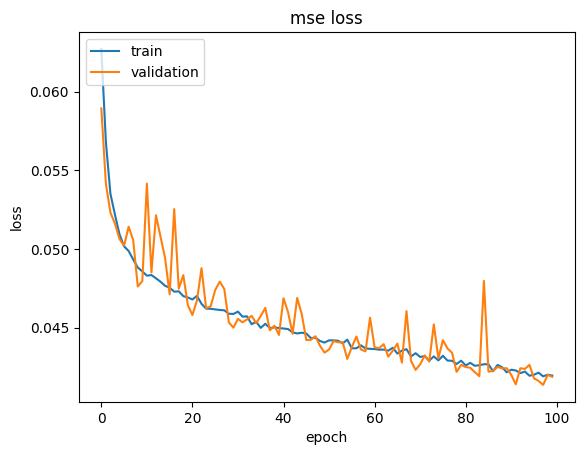

157/157 [==============================] - 1s 3ms/step - loss: 1.8521 - CE_loss: 1.8521 - mse_loss: 0.0495 - CE_accuracy: 0.6402 - mse_root_mean_squared_error: 0.2225
0.649399995803833
lambda:  2


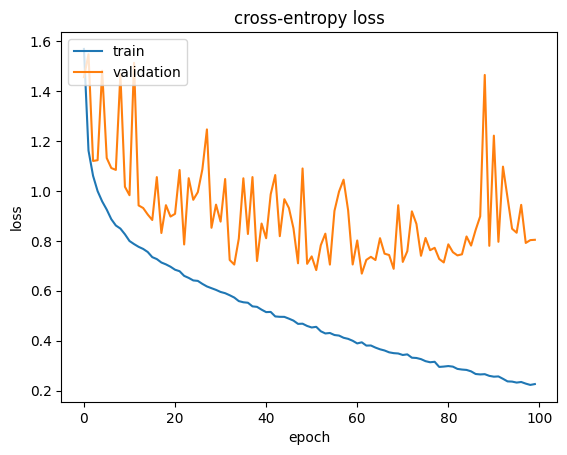

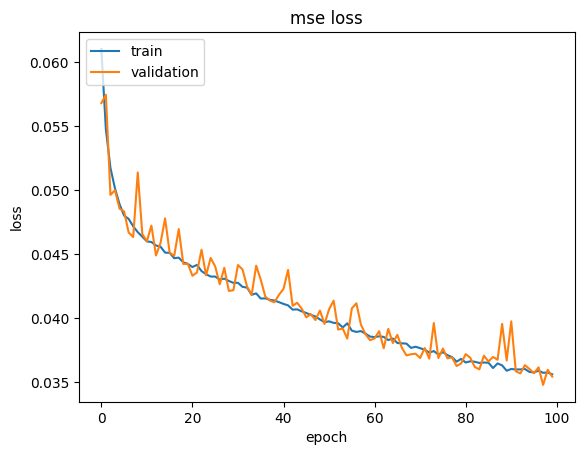

157/157 [==============================] - 1s 3ms/step - loss: 1.1373 - CE_loss: 1.1373 - mse_loss: 0.0453 - CE_accuracy: 0.7234 - mse_root_mean_squared_error: 0.2129
0.7166000008583069
lambda:  5


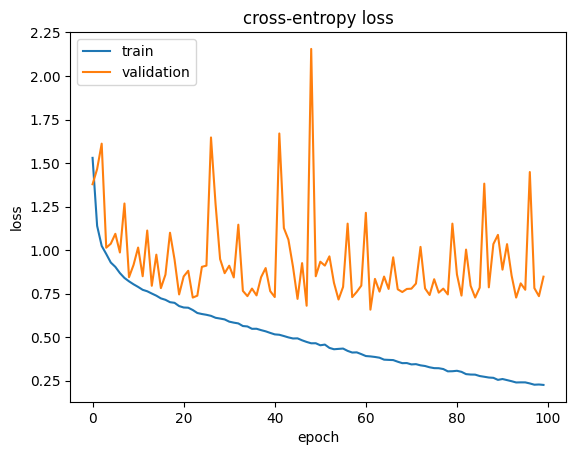

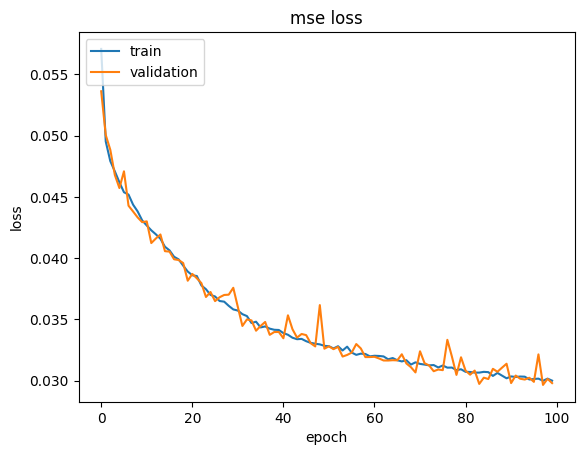

157/157 [==============================] - 0s 3ms/step - loss: 6.9817 - CE_loss: 6.9817 - mse_loss: 0.0436 - CE_accuracy: 0.4074 - mse_root_mean_squared_error: 0.2087
0.40619999170303345
lambda:  10


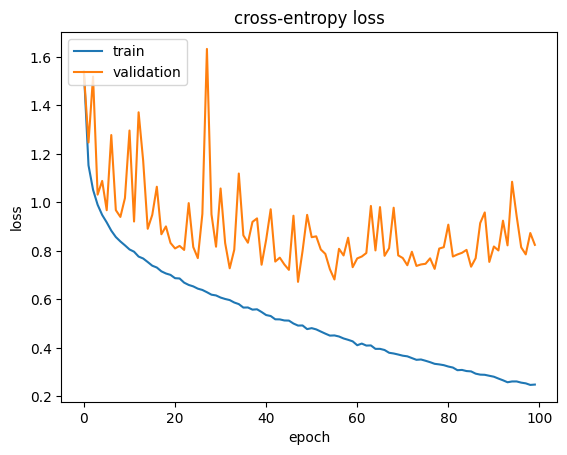

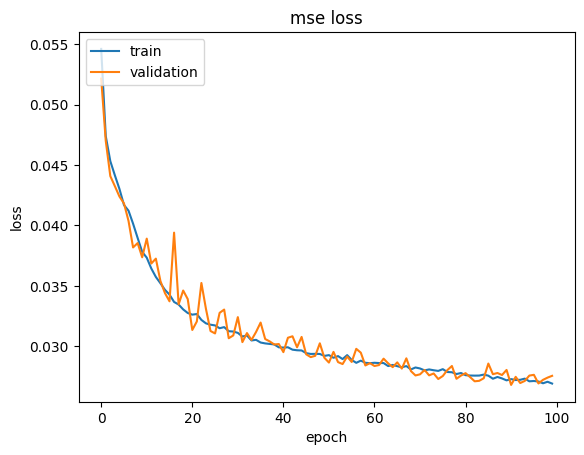

157/157 [==============================] - 1s 3ms/step - loss: 1.1853 - CE_loss: 1.1853 - mse_loss: 0.0369 - CE_accuracy: 0.7022 - mse_root_mean_squared_error: 0.1920
0.7110000252723694
[[0.85460001 0.76340002 0.82740003 0.76899999 0.88660002]
 [0.80940002 0.83219999 0.82539999 0.76179999 0.82880002]
 [0.70139998 0.72539997 0.6886     0.70859998 0.70120001]
 [0.66219997 0.62040001 0.69080001 0.6868     0.6688    ]
 [0.73040003 0.64020002 0.7234     0.40740001 0.7022    ]]
current overlap is:  5
lambda:  0


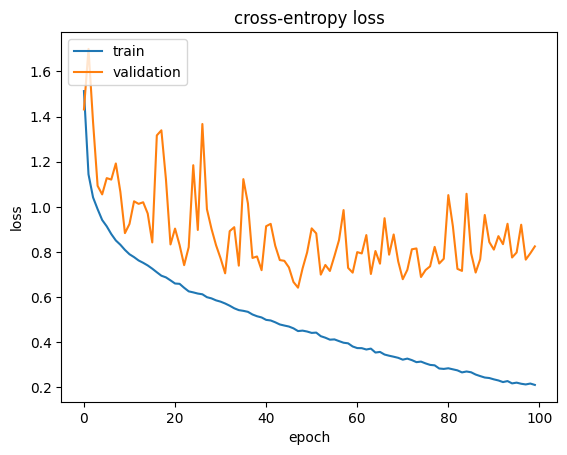

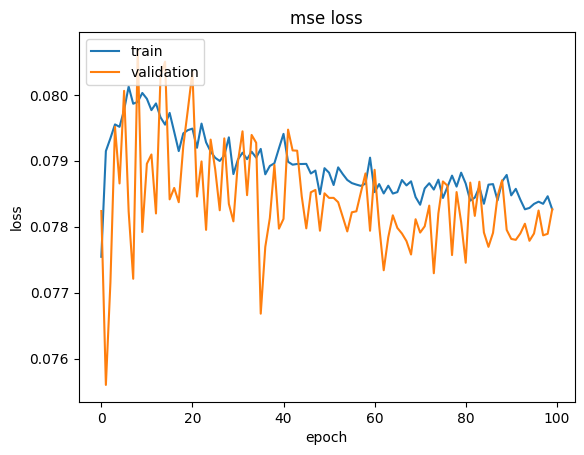


KeyboardInterrupt



In [64]:
key_list = ['loss', 'CE_loss', 'mse_loss', 'CE_accuracy', 'mse']

lambda_list = [0,1,2,5,10]


results_list = {key: [] for key in key_list}
for i in range(6):

    print("current overlap is: ", (i) )
    acc_list = [] 
    LABEL_SECOND_HALF = label2_list[5-i]
    for lambda_val in lambda_list:
        print("lambda: ", lambda_val)
        results_list = train_first_stage(lambda_val,results_list,LABEL_SECOND_HALF)
    print(np.array(results_list['CE_accuracy']).reshape(-1,5))


In [62]:
(np.array(results_list['CE_accuracy']).reshape(-1,5))

## for both maxpooling

array([[0.68580002, 0.847     , 0.85960001, 0.80140001, 0.73879999],
       [0.80900002, 0.81900001, 0.80699998, 0.81980002, 0.80180001],
       [0.67680001, 0.7058    , 0.64319998, 0.68599999, 0.69639999],
       [0.6304    , 0.66460001, 0.64700001, 0.62639999, 0.57480001],
       [0.71259999, 0.58459997, 0.64380002, 0.5402    , 0.71039999],
       [0.76660001, 0.79040003, 0.77859998, 0.77520001, 0.78460002]])

In [57]:
np.array(results_list['CE_accuracy']).reshape(-1,5)

array([[0.85979998, 0.85119998, 0.86580002, 0.86339998, 0.84979999],
       [0.82020003, 0.8276    , 0.81779999, 0.82059997, 0.74800003],
       [0.70899999, 0.6936    , 0.70700002, 0.704     , 0.6936    ],
       [0.67400002, 0.61159998, 0.66640002, 0.66820002, 0.65600002],
       [0.72680002, 0.70099998, 0.71759999, 0.71960002, 0.69580001],
       [0.77939999, 0.76660001, 0.78539997, 0.79360002, 0.77219999]])

In [54]:
32-64-noise- ...

[[0.85979998 0.85119998 0.86580002 0.86339998 0.84979999]
 [0.82020003 0.8276     0.81779999 0.82059997 0.74800003]
 [0.70899999 0.6936     0.70700002 0.704      0.6936    ]
 [0.67400002 0.61159998 0.66640002 0.66820002 0.65600002]
 [0.72680002 0.70099998 0.71759999 0.71960002 0.69580001]
 [0.77939999 0.76660001 0.78539997 0.79360002 0.77219999]]

SyntaxError: unmatched ']' (187059677.py, line 4)

In [30]:
rec_16 = np.array(
[[0.8466     ,0.85839999 ,0.85140002 ,0.8664     ,0.85079998],
 [0.82560003 ,0.82599998 ,0.829      ,0.82120001 ,0.81879997],
 [0.70039999 ,0.68699998 ,0.70660001 ,0.68519998 ,0.6846    ],
 [0.66579998 ,0.65439999 ,0.65560001 ,0.65979999 ,0.64880002],
 [0.72299999 ,0.7252     ,0.69980001 ,0.71060002 ,0.70959997],
 [0.79000002 ,0.7992     ,0.78200001 ,0.7798     ,0.7748    ]])

rec_32 = np.array(

[[0.85460001, 0.85600001 ,0.83939999, 0.85479999, 0.82080001],
 [0.81580001, 0.82599998 ,0.81660002, 0.80980003, 0.82020003],
 [0.70160002, 0.69580001 ,0.69480002, 0.69700003, 0.68660003],
 [0.66619998, 0.66259998 ,0.67360002, 0.63779998, 0.62639999],
 [0.70779997, 0.71780002 ,0.708     , 0.71359998, 0.72600001],
 [0.78820002, 0.78359997 ,0.7802    , 0.78600001, 0.76499999]])

rec_64 = np.array(
[[0.8574     ,0.85180002 ,0.85720003 ,0.85079998 ,0.86699998],
 [0.81440002 ,0.81879997 ,0.83099997 ,0.81980002 ,0.80059999],
 [0.699      ,0.67540002 ,0.70179999 ,0.68199998 ,0.68419999],
 [0.66759998 ,0.67820001 ,0.6638     ,0.66759998 ,0.64899999],
 [0.70300001 ,0.708      ,0.70420003 ,0.70039999 ,0.708     ],
 [0.78560001 ,0.7956     ,0.78460002 ,0.77240002 ,0.77679998]])



(5, 6)

In [31]:
## lr = 0.06 
data1 = np.array(
[[0.8434     ,0.847      ,0.84420002 ,0.83600003 ,0.8452     ,0.79320002],
 [0.78500003 ,0.78399998 ,0.79439998 ,0.76679999 ,0.67540002 ,0.67720002],
 [0.67040002 ,0.67460001 ,0.65640002 ,0.64060003 ,0.63340002 ,0.6358    ],
 [0.63440001 ,0.61799997 ,0.69099998 ,0.68519998 ,0.70679998 ,0.69099998],
 [0.699      ,0.76859999 ,0.7726     ,0.76859999 ,0.77280003 ,0.76319999]])

data1 = data1.reshape(6,-1)


## NEWEST
data2 = np.array([[0.85540003 ,0.84640002 ,0.84020001 ,0.85659999 ,0.8276     ,0.8154    ],
 [0.80760002 ,0.80919999 ,0.81379998 ,0.77079999 ,0.68660003 ,0.68540001],
 [0.68099999 ,0.65979999 ,0.67000002 ,0.64520001 ,0.65319997 ,0.6476    ],
 [0.65060002 ,0.64579999 ,0.70160002 ,0.72100002 ,0.708      ,0.69980001],
 [0.68839997 ,0.77399999 ,0.77139997 ,0.77759999 ,0.7658     ,0.76920003]])
data2 = data2.reshape(6,-1)

# make the classify layer smaller
data3 = np.array([[0.8362     ,0.83340001 ,0.83240002 ,0.83939999 ,0.82160002 ,0.79339999],
 [0.79339999 ,0.78799999 ,0.7852     ,0.77819997 ,0.66119999 ,0.66060001],
 [0.6692     ,0.67760003 ,0.64999998 ,0.64139998 ,0.6286     ,0.64380002],
 [0.60320002 ,0.61519998 ,0.69139999 ,0.68180001 ,0.66579998 ,0.66619998],
 [0.68480003 ,0.77420002 ,0.77079999 ,0.76279998 ,0.76639998 ,0.74080002]])
data3 = data3.reshape(6,-1)

data4 =  np.array([[0.85360003, 0.85540003, 0.84240001, 0.84899998 ,0.85420001],
 [0.80419999, 0.81220001, 0.8064    , 0.78680003 ,0.80779999],
 [0.67439997, 0.68080002, 0.69300002, 0.67559999 ,0.67919999],
 [0.66100001, 0.64279997, 0.65319997, 0.64420003 ,0.64020002],
 [0.64240003, 0.68339998, 0.69999999, 0.68040001 ,0.69520003],
 [0.76520002, 0.7852    , 0.77780002, 0.7798     ,0.74680001]])


In [25]:
np.savetxt("rec_256.csv", data2, delimiter=",")
#reads = np.loadtxt("rec_128.csv", delimiter=",")


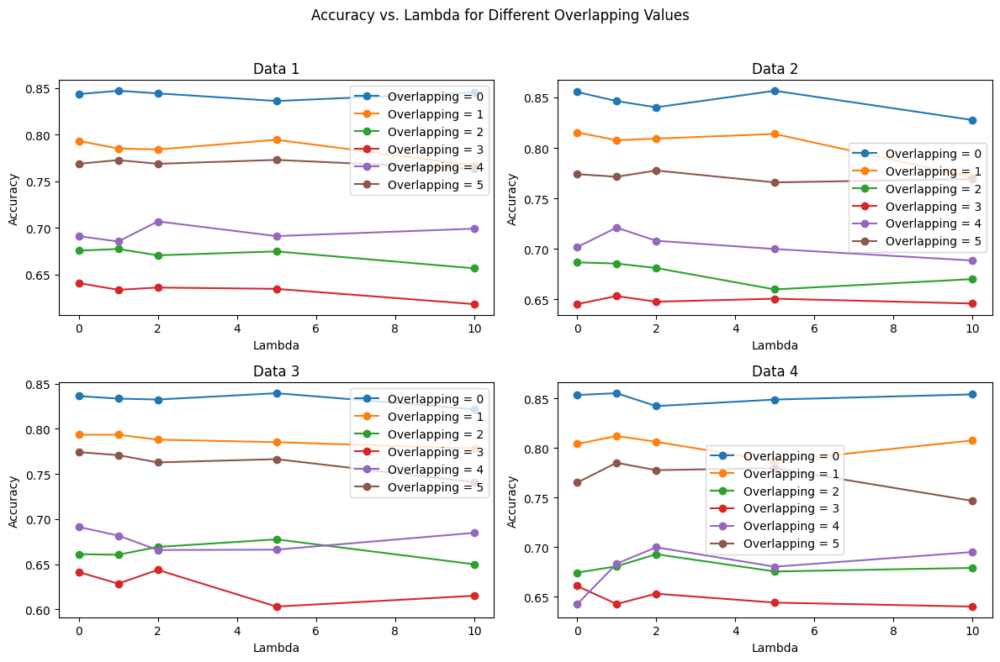

In [32]:
# Plotting
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle('Accuracy vs. Lambda for Different Overlapping Values')
lambda_values = [0,1,2,5,10]
for i, ax in enumerate(axs.flat):
    for j in range(6):
        label = f'Overlapping = {j}'
        ax.plot(lambda_values, locals()[f'data{i + 1}'][j], label=label, marker='o')

    ax.set_xlabel('Lambda')
    ax.set_ylabel('Accuracy')
    ax.set_title(f'Data {i + 1}')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [ ]:
##double learning rate
a = 
[[0.83420002 0.82980001 0.8416     0.82859999 0.83539999 0.78920001
  0.78740001 0.78259999 0.77219999 0.78619999 0.65700001 0.65899998
  0.66939998 0.65579998 0.66000003 0.62040001 0.64920002 0.60879999
  0.63419998 0.6286     0.68959999 0.69559997 0.685      0.69279999
  0.69620001 0.76859999 0.764      0.77020001 0.76980001 0.75940001]
 [0.824      0.8348     0.82740003 0.8308     0.83099997 0.78920001
  0.78579998 0.78439999 0.78680003 0.7852     0.65859997 0.6728
  0.6692     0.64600003 0.65560001 0.62360001 0.62260002 0.62260002
  0.6232     0.60640001 0.69499999 0.6972     0.69400001 0.68099999
  0.69779998 0.7586     0.7554     0.76539999 0.77499998 0.75400001]
 [0.84500003 0.8308     0.83099997 0.83639997 0.82599998 0.778
  0.79100001 0.78439999 0.78960001 0.79460001 0.67040002 0.67360002
  0.64520001 0.67500001 0.66619998 0.63200003 0.62480003 0.62699997
  0.62360001 0.6074     0.69919997 0.69059998 0.69880003 0.6846
  0.6832     0.77740002 0.76120001 0.74739999 0.76059997 0.73940003]
 [0.84380001 0.83160001 0.82920003 0.83740002 0.82840002 0.79360002
  0.79839998 0.78560001 0.77880001 0.77640003 0.6656     0.65179998
  0.66259998 0.65939999 0.6566     0.6268     0.61799997 0.63059998
  0.61680001 0.61080003 0.68599999 0.68519998 0.69819999 0.6778
  0.7008     0.77399999 0.75379997 0.75599998 0.76779997 0.76099998]
 [0.83560002 0.83920002 0.83600003 0.83340001 0.83999997 0.79519999
  0.78920001 0.78560001 0.79699999 0.77999997 0.65200001 0.65460002
  0.64719999 0.66420001 0.66140002 0.62760001 0.61580002 0.6268
  0.59640002 0.59140003 0.69840002 0.6936     0.6886     0.69139999
  0.68379998 0.77380002 0.75239998 0.7518     0.76340002 0.75480002]]

result_list = np.array(a).reshape(5,-1)
print(np.mean(result_list,axis=0).reshape(6,-1))

In [ ]:
[[0.83420002, 0.82980001, 0.8416    , 0.82859999, 0.83539999, 0.78920001,
  0.78740001, 0.78259999, 0.77219999, 0.78619999, 0.65700001, 0.65899998,
  0.66939998, 0.65579998, 0.66000003, 0.62040001, 0.64920002, 0.60879999,
  0.63419998, 0.6286    , 0.68959999, 0.69559997, 0.685     , 0.69279999,
  0.69620001, 0.76859999, 0.764     , 0.77020001, 0.76980001, 0.75940001]
 [0.824     , 0.8348    , 0.82740003, 0.8308    , 0.83099997, 0.78920001,
  0.78579998, 0.78439999, 0.78680003, 0.7852    , 0.65859997, 0.6728,
  0.6692    , 0.64600003, 0.65560001, 0.62360001, 0.62260002, 0.62260002,
  0.6232    , 0.60640001, 0.69499999, 0.6972    , 0.69400001, 0.68099999,
  0.69779998, 0.7586    , 0.7554    , 0.76539999, 0.77499998, 0.75400001]
 [0.84500003, 0.8308    , 0.83099997, 0.83639997, 0.82599998, 0.778,
  0.79100001, 0.78439999, 0.78960001, 0.79460001, 0.67040002, 0.67360002,
  0.64520001, 0.67500001, 0.66619998, 0.63200003, 0.62480003, 0.62699997,
  0.62360001, 0.6074    , 0.69919997, 0.69059998, 0.69880003, 0.6846,
  0.6832    , 0.77740002, 0.76120001, 0.74739999, 0.76059997, 0.73940003]
 [0.84380001, 0.83160001, 0.82920003, 0.83740002, 0.82840002, 0.79360002,
  0.79839998, 0.78560001, 0.77880001, 0.77640003, 0.6656    , 0.65179998,
  0.66259998, 0.65939999, 0.6566    , 0.6268    , 0.61799997, 0.63059998,
  0.61680001, 0.61080003, 0.68599999, 0.68519998, 0.69819999, 0.6778,
  0.7008    , 0.77399999, 0.75379997, 0.75599998, 0.76779997, 0.76099998]
 [0.83560002, 0.83920002, 0.83600003, 0.83340001, 0.83999997, 0.79519999,
  0.78920001, 0.78560001, 0.79699999, 0.77999997, 0.65200001, 0.65460002,
  0.64719999, 0.66420001, 0.66140002, 0.62760001, 0.61580002, 0.6268,
  0.59640002, 0.59140003, 0.69840002, 0.6936    , 0.6886    , 0.69139999,
  0.68379998, 0.77380002, 0.75239998, 0.7518    , 0.76340002, 0.75480002]]

In [29]:
### super large model
result_list = np.array(
[[0.88440001, 0.88020003, 0.87580001, 0.87900001, 0.88080001, 0.829,
  0.84100002, 0.83399999, 0.82819998, 0.8326    , 0.71160001, 0.72000003,
  0.71640003, 0.7288    , 0.708     , 0.70020002, 0.7022    , 0.69,
  0.68199998, 0.68980002, 0.72920001, 0.73100001, 0.73860002, 0.72920001,
  0.72820002, 0.80180001, 0.7802    , 0.80040002, 0.79720002, 0.80320001],
 [0.88459998, 0.884     , 0.88520002, 0.8624    , 0.87900001, 0.83020002,
  0.8502    , 0.83579999, 0.83939999, 0.84240001, 0.72979999, 0.72320002,
  0.71920002, 0.722     , 0.72299999, 0.69499999, 0.69260001, 0.70060003,
  0.68699998, 0.6868    , 0.73640001, 0.73680001, 0.73659998, 0.73720002,
  0.73339999, 0.80440003, 0.79960001, 0.7924    , 0.78439999, 0.79259998],
 [0.88200003, 0.87840003, 0.88239998, 0.87559998, 0.87620002, 0.83459997,
  0.84219998, 0.83639997, 0.83660001, 0.83099997, 0.72839999, 0.71560001,
  0.72240001, 0.72600001, 0.71740001, 0.68660003, 0.68879998, 0.66839999,
  0.69419998, 0.69319999, 0.73900002, 0.73460001, 0.74559999, 0.72619998,
  0.72640002, 0.79640001, 0.80260003, 0.79979998, 0.79320002, 0.80199999],
 [0.87819999, 0.8822    , 0.86839998, 0.88239998, 0.87480003, 0.84299999,
  0.8344    , 0.83099997, 0.8272    , 0.83240002, 0.72960001, 0.73659998,
  0.73140001, 0.7216    , 0.73079997, 0.69199997, 0.68620002, 0.69499999,
  0.69239998, 0.70380002, 0.7446    , 0.7374    , 0.73379999, 0.7342,
  0.72320002, 0.7938    , 0.80360001, 0.7834    , 0.7942    , 0.79879999],
 [0.87099999, 0.86739999, 0.88279998, 0.87459999, 0.87519997, 0.84420002,
  0.84259999, 0.8398    , 0.83560002, 0.8344    , 0.72600001, 0.7256,
  0.72659999, 0.71240002, 0.704     , 0.68739998, 0.68959999, 0.69959998,
  0.68919998, 0.68720001, 0.73839998, 0.74519998, 0.73699999, 0.74739999,
  0.73100001, 0.80680001, 0.81279999, 0.801     , 0.7906    , 0.7956    ]])

np.mean(result_list,axis=0).reshape(6,-1)

array([[0.88004   , 0.87844001, 0.87891999, 0.87479999, 0.87720001],
       [0.8362    , 0.84208   , 0.83539998, 0.8334    , 0.83456   ],
       [0.72508   , 0.72420001, 0.72320001, 0.72216001, 0.71663999],
       [0.69224   , 0.69188   , 0.69072   , 0.68895998, 0.69216001],
       [0.73752   , 0.737     , 0.73831999, 0.73484   , 0.72844001],
       [0.80064001, 0.79976001, 0.7954    , 0.79192001, 0.79843999]])

In [39]:
result_list = np.array(results_list['CE_accuracy']).reshape(5,-1)
print(np.mean(result_list,axis=0).reshape(6,-1))

[[0.84664001 0.84511999 0.84124001 0.84776001 0.83379999]
 [0.79856001 0.79432    0.79808    0.79352    0.7896    ]
 [0.67644    0.67908001 0.66456    0.66963999 0.6696    ]
 [0.63744    0.63191999 0.63256    0.63235999 0.6232    ]
 [0.70344    0.70008    0.6994     0.69572001 0.69068   ]
 [0.76887999 0.77548    0.77215999 0.76992    0.76072   ]]


In [ ]:
[[0.84664001 ,0.84511999 ,0.84124001, 0.84776001 ,0.83379999],
 [0.79856001 ,0.79432    ,0.79808   , 0.79352    ,0.7896    ],
 [0.67644    ,0.67908001 ,0.66456   , 0.66963999 ,0.6696    ],
 [0.63744    ,0.63191999 ,0.63256   , 0.63235999 ,0.6232    ],
 [0.70344    ,0.70008    ,0.6994    , 0.69572001 ,0.69068   ],
 [0.76887999 ,0.77548    ,0.77215999, 0.76992    ,0.76072   ]]

In [ ]:

[[0.84664001 0.84511999 0.84124001 0.84776001 0.83379999]
 [0.79856001 0.79432    0.79808    0.79352    0.7896    ]
 [0.67644    0.67908001 0.66456    0.66963999 0.6696    ]
 [0.63744    0.63191999 0.63256    0.63235999 0.6232    ]
 [0.70344    0.70008    0.6994     0.69572001 0.69068   ]
 [0.76887999 0.77548    0.77215999 0.76992    0.76072   ]]

In [37]:
np.array(results_list['CE_accuracy']).reshape(6,-1)

array([[0.84960002, 0.84539998, 0.83600003, 0.85600001, 0.84020001,
        0.80180001, 0.78960001, 0.80080003, 0.78600001, 0.7802    ,
        0.6724    , 0.67820001, 0.68239999, 0.68559998, 0.67180002,
        0.63880002, 0.62459999, 0.6214    , 0.63340002, 0.62739998,
        0.70099998, 0.69319999, 0.70639998, 0.69620001, 0.67799997],
       [0.76279998, 0.7762    , 0.77200001, 0.76499999, 0.75940001,
        0.84640002, 0.85180002, 0.847     , 0.84420002, 0.82319999,
        0.801     , 0.79839998, 0.78899997, 0.80379999, 0.7956    ,
        0.68279999, 0.67720002, 0.66600001, 0.65399998, 0.66780001,
        0.64020002, 0.63459998, 0.64160001, 0.6318    , 0.62580001],
       [0.70899999, 0.69760001, 0.68760002, 0.69499999, 0.68440002,
        0.7676    , 0.78240001, 0.773     , 0.76980001, 0.76660001,
        0.84460002, 0.84759998, 0.83780003, 0.84600002, 0.8308    ,
        0.80180001, 0.796     , 0.80080003, 0.7852    , 0.78820002,
        0.68099999, 0.68580002, 0.65219998, 0.

In [ ]:
array([[0.88319999, 0.87180001, 0.86320001, 0.88      , 0.86339998,
        0.83219999],
       [0.84560001, 0.83020002, 0.84740001, 0.83319998, 0.73720002,
        0.72479999],
       [0.7288    , 0.72140002, 0.71920002, 0.69139999, 0.69059998,
        0.69660002],
       [0.69199997, 0.68180001, 0.74059999, 0.73040003, 0.73360002,
        0.7374    ],
       [0.73220003, 0.80919999, 0.81239998, 0.80059999, 0.79280001,
        0.801     ]])

In [15]:
import pickle 

with open('cifar10_acc_100ep.pkl', 'wb') as f:
    pickle.dump(results_list, f)

In [1]:
import pickle 
with open('cifar10_acc_100ep.pkl', 'rb') as f:
    x = pickle.load(f)

In [6]:
import numpy as np
np.array(x['CE_accuracy']).reshape(5,-1)

array([[0.81339997, 0.80739999, 0.73699999, 0.79680002, 0.77160001,
        0.77100003],
       [0.75220001, 0.75440001, 0.74839997, 0.73519999, 0.65359998,
        0.64660001],
       [0.64499998, 0.66659999, 0.61919999, 0.60299999, 0.55659997,
        0.597     ],
       [0.56739998, 0.56940001, 0.46000001, 0.6638    , 0.64160001,
        0.66320002],
       [0.65079999, 0.6602    , 0.6742    , 0.73720002, 0.72180003,
        0.71740001]])

In [18]:
np.array(results_list['CE_accuracy']).reshape(5,-1)

array([[0.81339997, 0.80739999, 0.73699999, 0.79680002, 0.77160001,
        0.77100003],
       [0.75220001, 0.75440001, 0.74839997, 0.73519999, 0.65359998,
        0.64660001],
       [0.64499998, 0.66659999, 0.61919999, 0.60299999, 0.55659997,
        0.597     ],
       [0.56739998, 0.56940001, 0.46000001, 0.6638    , 0.64160001,
        0.66320002],
       [0.65079999, 0.6602    , 0.6742    , 0.73720002, 0.72180003,
        0.71740001]])

In [ ]:
np.array([[0.81339997, 0.80739999, 0.73699999, 0.79680002, 0.77160001,
        0.77100003],
       [0.75220001, 0.75440001, 0.74839997, 0.73519999, 0.65359998,
        0.64660001],
       [0.64499998, 0.66659999, 0.61919999, 0.60299999, 0.55659997,
        0.597     ],
       [0.56739998, 0.56940001, 0.46000001, 0.6638    , 0.64160001,
        0.66320002],
       [0.65079999, 0.6602    , 0.6742    , 0.73720002, 0.72180003,
        0.71740001]])